# Análisis bivariable

## Importación de librerias y carga de datos


In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import scipy

import statsmodels.stats.multicomp as mc
import statsmodels.api as sm
from scipy.stats import shapiro
from scipy.stats import pearsonr
from scipy.stats import spearmanr
from scipy.stats import chi2_contingency
from scipy.stats import mannwhitneyu 
from scipy.stats import kendalltau


from EDA_function_tools import *


In [2]:
# Cargo el dataset principal
df = pd.read_excel('./data/airbnb_2.xlsx',index_col = 0)
# Cargo el dataset segmentado por alquiler de pisos ('Entire home/apt)
df_home = pd.read_excel('./data/airbnb_home.xlsx', index_col=0)
df_private = df[df['room_type']== 'Private room']
df_shared = df [df['room_type']== 'Shared room']

In [3]:
df.columns

Index(['id', 'host_id', 'host_is_superhost', 'name', 'host_name', 'host_since',
       'amenities', 'host_listings_count', 'neighbourhood_cleansed',
       'neighbourhood_group_cleansed', 'latitude', 'longitude',
       'property_type', 'room_type', 'accommodates', 'bedrooms', 'beds',
       'price', 'minimum_nights', 'maximum_nights', 'number_of_reviews',
       'review_scores_rating', 'calculated_host_listings_count', 'bathrooms',
       'distrito', 'precio_m2', 'price_disc', 'accommodates_disc',
       'propietarios_disc', 'price_accommodates', 'price_bedrooms',
       'antiguedad_host', 'champion', 'segmentacion_mercado'],
      dtype='object')

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 18906 entries, 0 to 18905
Data columns (total 34 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   id                              18906 non-null  int64         
 1   host_id                         18906 non-null  int64         
 2   host_is_superhost               18906 non-null  object        
 3   name                            18906 non-null  object        
 4   host_name                       18880 non-null  object        
 5   host_since                      18880 non-null  datetime64[ns]
 6   amenities                       18906 non-null  object        
 7   host_listings_count             18880 non-null  float64       
 8   neighbourhood_cleansed          18906 non-null  object        
 9   neighbourhood_group_cleansed    18906 non-null  object        
 10  latitude                        18906 non-null  float64       
 11  longitu

In [5]:
df_home.columns

Index(['id', 'host_id', 'host_is_superhost', 'name', 'host_name', 'host_since',
       'amenities', 'host_listings_count', 'neighbourhood_cleansed',
       'neighbourhood_group_cleansed', 'latitude', 'longitude',
       'property_type', 'room_type', 'accommodates', 'bedrooms', 'beds',
       'price', 'minimum_nights', 'maximum_nights', 'number_of_reviews',
       'review_scores_rating', 'calculated_host_listings_count', 'bathrooms',
       'distrito', 'precio_m2', 'price_disc', 'accommodates_disc',
       'propietarios_disc', 'price_accommodates', 'price_bedrooms',
       'antiguedad_host', 'champion', 'segmentacion_mercado', 'sup_m2_est',
       'precio_est', 'price_x_sup'],
      dtype='object')

In [6]:
df_private.columns

Index(['id', 'host_id', 'host_is_superhost', 'name', 'host_name', 'host_since',
       'amenities', 'host_listings_count', 'neighbourhood_cleansed',
       'neighbourhood_group_cleansed', 'latitude', 'longitude',
       'property_type', 'room_type', 'accommodates', 'bedrooms', 'beds',
       'price', 'minimum_nights', 'maximum_nights', 'number_of_reviews',
       'review_scores_rating', 'calculated_host_listings_count', 'bathrooms',
       'distrito', 'precio_m2', 'price_disc', 'accommodates_disc',
       'propietarios_disc', 'price_accommodates', 'price_bedrooms',
       'antiguedad_host', 'champion', 'segmentacion_mercado'],
      dtype='object')

In [7]:
df_shared.columns

Index(['id', 'host_id', 'host_is_superhost', 'name', 'host_name', 'host_since',
       'amenities', 'host_listings_count', 'neighbourhood_cleansed',
       'neighbourhood_group_cleansed', 'latitude', 'longitude',
       'property_type', 'room_type', 'accommodates', 'bedrooms', 'beds',
       'price', 'minimum_nights', 'maximum_nights', 'number_of_reviews',
       'review_scores_rating', 'calculated_host_listings_count', 'bathrooms',
       'distrito', 'precio_m2', 'price_disc', 'accommodates_disc',
       'propietarios_disc', 'price_accommodates', 'price_bedrooms',
       'antiguedad_host', 'champion', 'segmentacion_mercado'],
      dtype='object')

## Funciones

In [8]:
# Función para determinar el tipo de correlación (si es paramétrica o no)
def correlacion_numericas(df, var_num1, var_num2):
    # Prueba de Shapiro-Wilk para normalidad
    _, p1 = shapiro(df[var_num1])
    _, p2 = shapiro(df[var_num2])

    # Correlación paramétrica (Pearson) si ambos conjuntos de datos son normales
    if p1 > 0.05 and p2 > 0.05:
        corr, p_value = pearsonr(df[var_num1], df[var_num2])
        print("Correlación paramétrica (Pearson):", corr)
    else:
        if len(df)< 5000:
            # Correlación no paramétrica (Spearman) si al menos uno de los conjuntos de datos no es normal
            corr, p_value = spearmanr(df[var_num1], df[var_num2])
            print("Correlación no paramétrica (Spearman):", corr)
        else:
            # Correlación no paramétrica (Kendall) si al menos uno de los conjuntos de datos no es normal y tenemos registros por encima de 5000
            tau, p_value = kendalltau(df[var_num1], df[var_num2])
            print(f"Correlación de Kendall: {tau}")
            print(f"Valor p: {p_value}")
            
def correlacion_categoricas(df,col1,col2):
    tabla_contingencia = pd.crosstab(df[col1], df[col2])
    chi2, p, dof, expected = chi2_contingency(tabla_contingencia)

    print("Valor Chi-Cuadrado:", chi2)
    print("P-Value:", p)
    print("Grados de Libertad:", dof)
    print("Tabla de Frecuencias Esperadas:\n", expected)


def cv_iqr(var_num):
    CV = round(df_home[var_num].describe().loc['std']/df_home[var_num].describe().loc['mean'],2)
    IQR = round(df_home[var_num].describe().loc['75%']-df_home[var_num].describe().loc['25%'],2)
    print(f'El CV (coeficiente de variación) es: {CV}\n')
    print(f'El IQR (rango intercuartílico) es de: {IQR}\n')

def test_anova(df, categorica, numerica):
    grupos = df[categorica].unique()  
    lista_combinada = [df[df[categorica] == grupo][numerica] for grupo in grupos] 
    f_val, p_val = stats.f_oneway(*lista_combinada) 
    print("Valor F:", f_val)
    print("Valor p:", p_val)

def test_tukey_hsd(df, categorica, numerica):
    tukey = mc.MultiComparison(df[numerica], df[categorica])
    resultado = tukey.tukeyhsd()
    print(resultado)

def analisis_regresion(df,numerica_1,numerica_2):
    X = sm.add_constant(df[numerica_1])
    modelo = sm.OLS(df[numerica_2], X).fit()
    print(modelo.summary())



In [9]:
df_home.info()

<class 'pandas.core.frame.DataFrame'>
Index: 11098 entries, 2 to 18885
Data columns (total 37 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   id                              11098 non-null  int64         
 1   host_id                         11098 non-null  int64         
 2   host_is_superhost               11098 non-null  object        
 3   name                            11098 non-null  object        
 4   host_name                       11086 non-null  object        
 5   host_since                      11086 non-null  datetime64[ns]
 6   amenities                       11098 non-null  object        
 7   host_listings_count             11086 non-null  float64       
 8   neighbourhood_cleansed          11098 non-null  object        
 9   neighbourhood_group_cleansed    11098 non-null  object        
 10  latitude                        11098 non-null  float64       
 11  longitu

In [10]:
# Compruebo
df_home.shape

(11098, 37)

In [11]:
df_home.info()

<class 'pandas.core.frame.DataFrame'>
Index: 11098 entries, 2 to 18885
Data columns (total 37 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   id                              11098 non-null  int64         
 1   host_id                         11098 non-null  int64         
 2   host_is_superhost               11098 non-null  object        
 3   name                            11098 non-null  object        
 4   host_name                       11086 non-null  object        
 5   host_since                      11086 non-null  datetime64[ns]
 6   amenities                       11098 non-null  object        
 7   host_listings_count             11086 non-null  float64       
 8   neighbourhood_cleansed          11098 non-null  object        
 9   neighbourhood_group_cleansed    11098 non-null  object        
 10  latitude                        11098 non-null  float64       
 11  longitu

## Análisis bivariable general

### Variables categóricas

#### Tipo de oferta y distrito

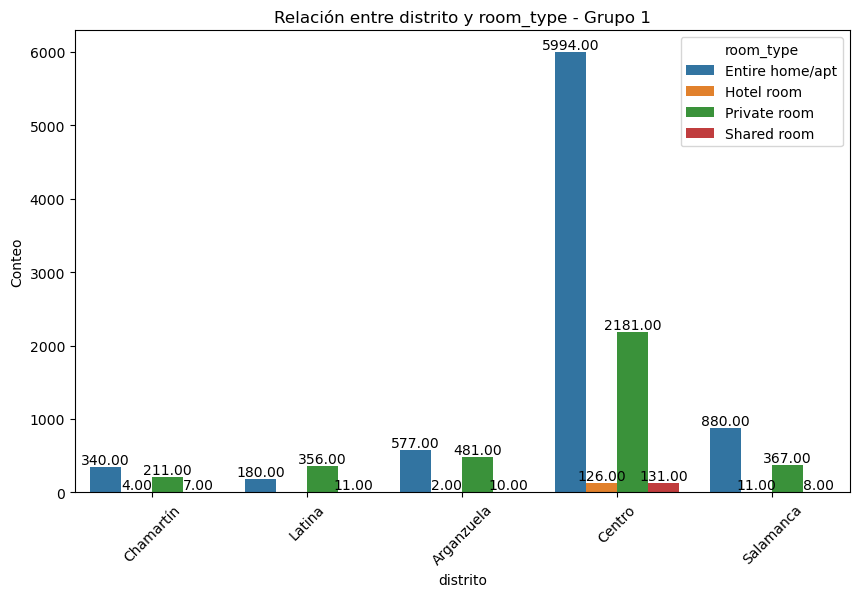

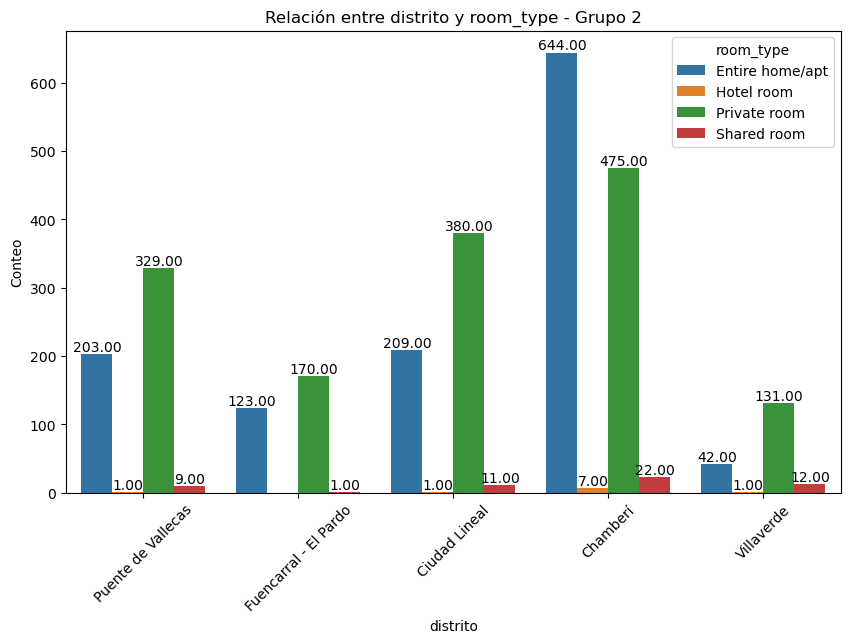

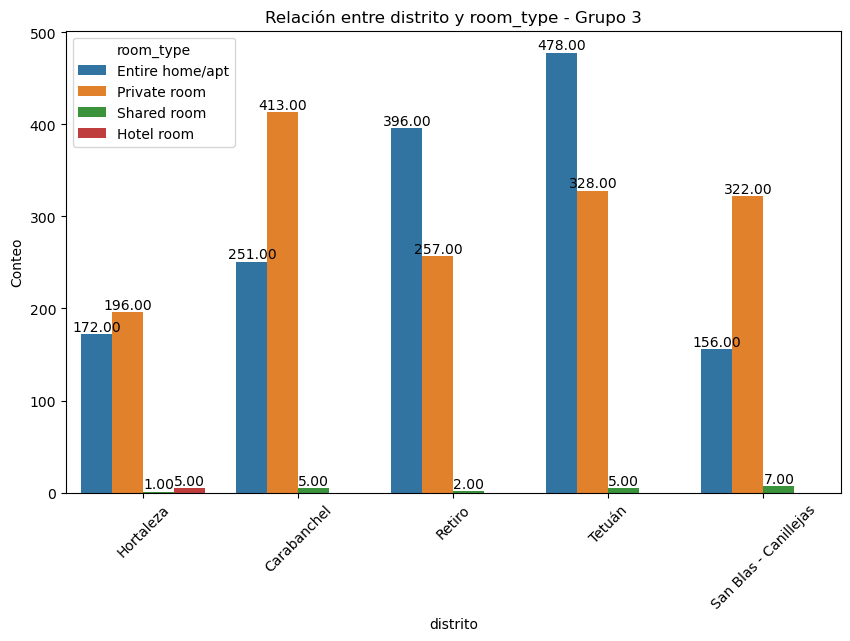

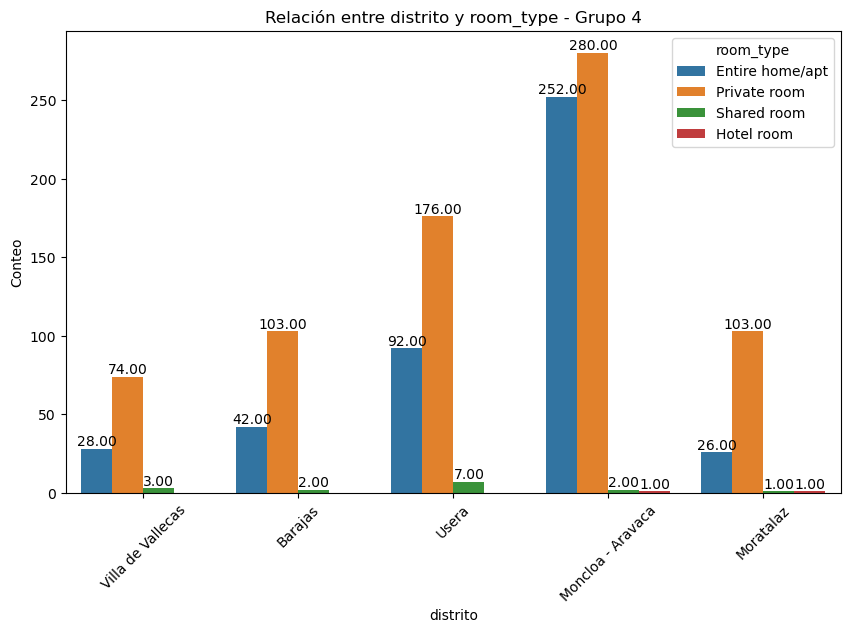

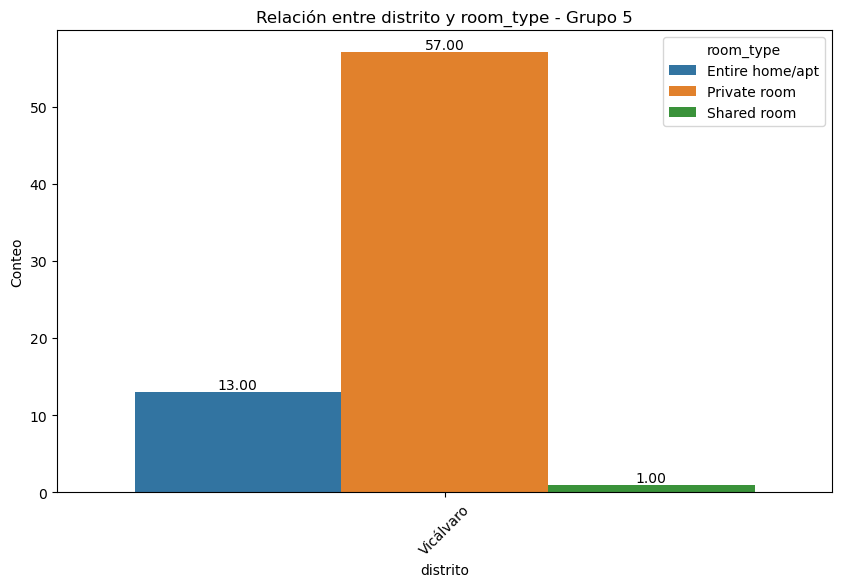

In [12]:
# Hallo primero el valor absoluto
plot_categorical_relationship_fin(df,'distrito','room_type',show_values=True)

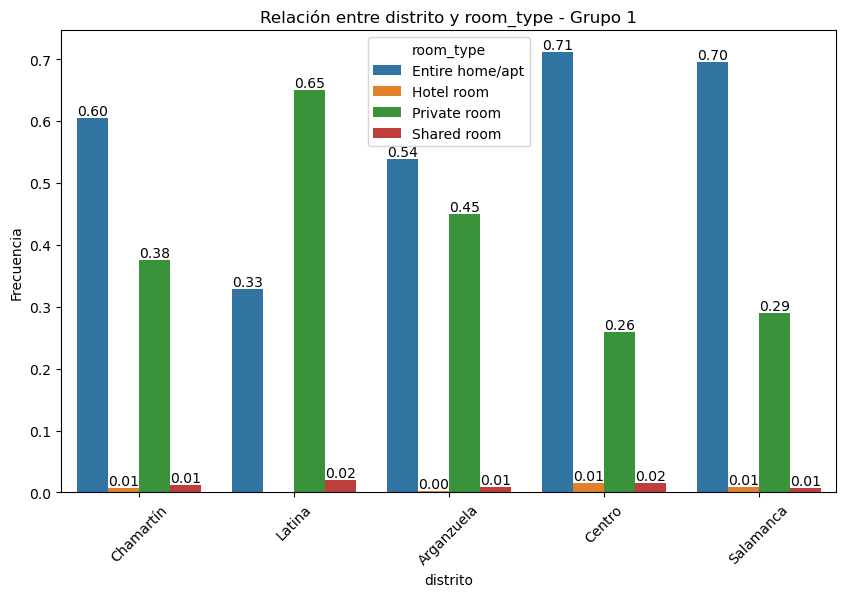

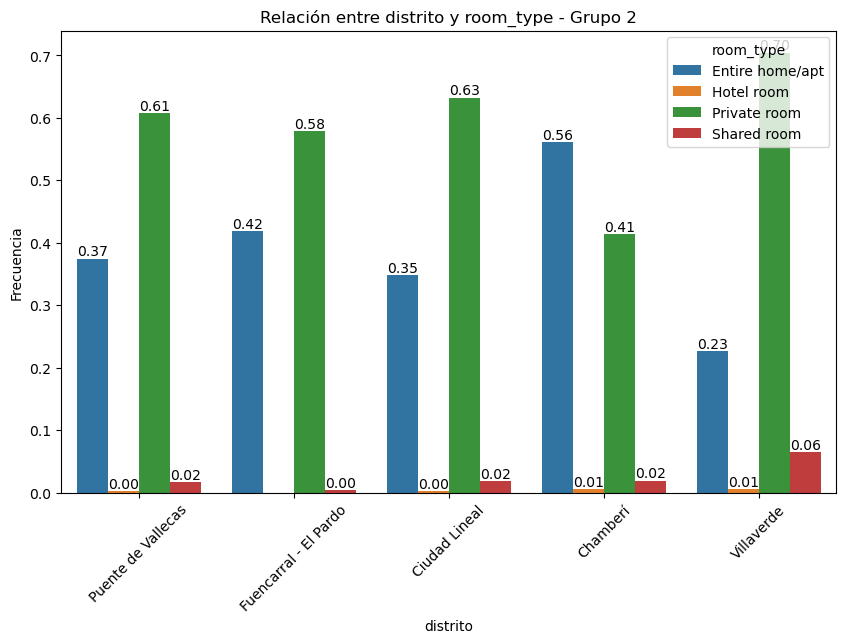

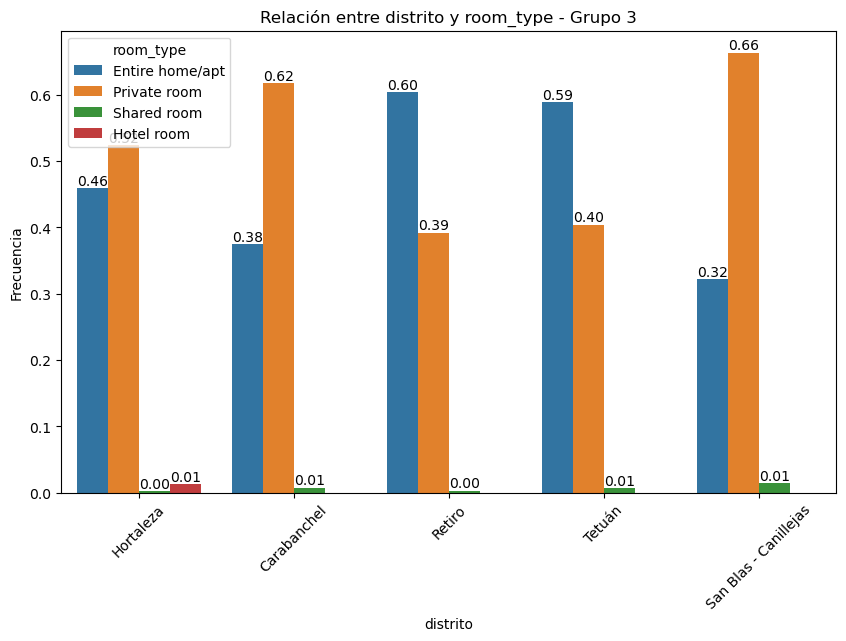

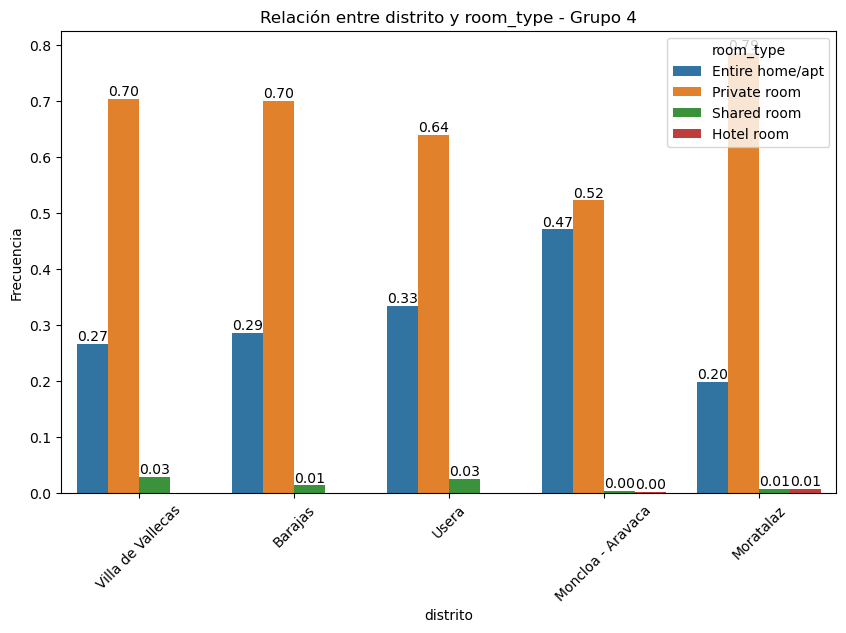

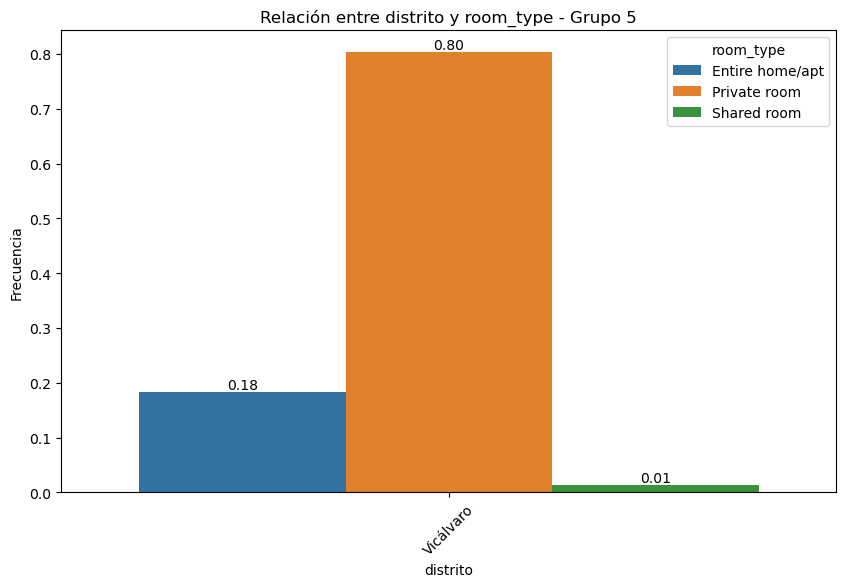

In [13]:
# Ahora valor relativo
plot_categorical_relationship_fin(df,'distrito','room_type',show_values=True,relative_freq=True)

In [14]:
# Aplicamo la correlación para ver si es significativa o no
correlacion_categoricas(df,'distrito','room_type')

Valor Chi-Cuadrado: 2047.5125433486667
P-Value: 0.0
Grados de Libertad: 60
Tabla de Frecuencias Esperadas:
 [[6.28100074e+02 9.05532635e+00 4.18242886e+02 1.46017137e+01]
 [8.62903840e+01 1.24404951e+00 5.74595367e+01 2.00602983e+00]
 [3.92709299e+02 5.66169470e+00 2.61499524e+02 9.12948270e+00]
 [4.94966339e+03 7.13593568e+01 3.29591029e+03 1.15066963e+02]
 [3.29899291e+02 4.75616206e+00 2.19675235e+02 7.66931133e+00]
 [6.73886808e+02 9.71543425e+00 4.48731620e+02 1.56661377e+01]
 [3.52792658e+02 5.08621602e+00 2.34919602e+02 8.20152333e+00]
 [1.72580768e+02 2.48809902e+00 1.14919073e+02 4.01205966e+00]
 [2.19541521e+02 3.16513276e+00 1.46189569e+02 5.10377658e+00]
 [3.21094150e+02 4.62921824e+00 2.13812017e+02 7.46461441e+00]
 [3.14050037e+02 4.52766318e+00 2.09121443e+02 7.30085687e+00]
 [7.68982334e+01 1.10864276e+00 5.12054374e+01 1.78768645e+00]
 [3.18159103e+02 4.58690363e+00 2.11857611e+02 7.39638210e+00]
 [3.84491167e+02 5.54321379e+00 2.56027187e+02 8.93843224e+00]
 [7.431539

#### Tipo de oferta por tipo de propietario discretizada

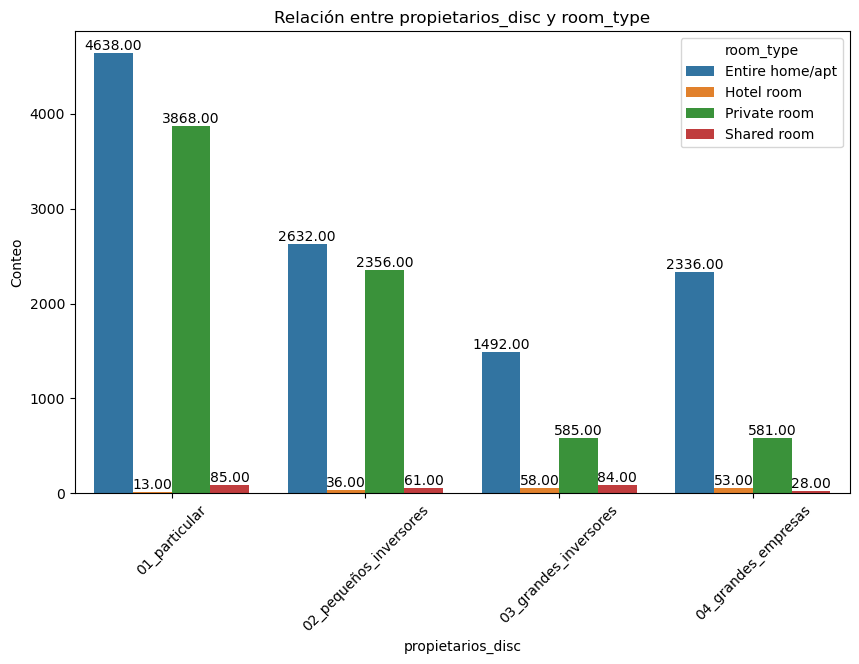

In [15]:
# Frecuencia absoluta
plot_categorical_relationship_fin(df,'propietarios_disc','room_type',show_values=True)

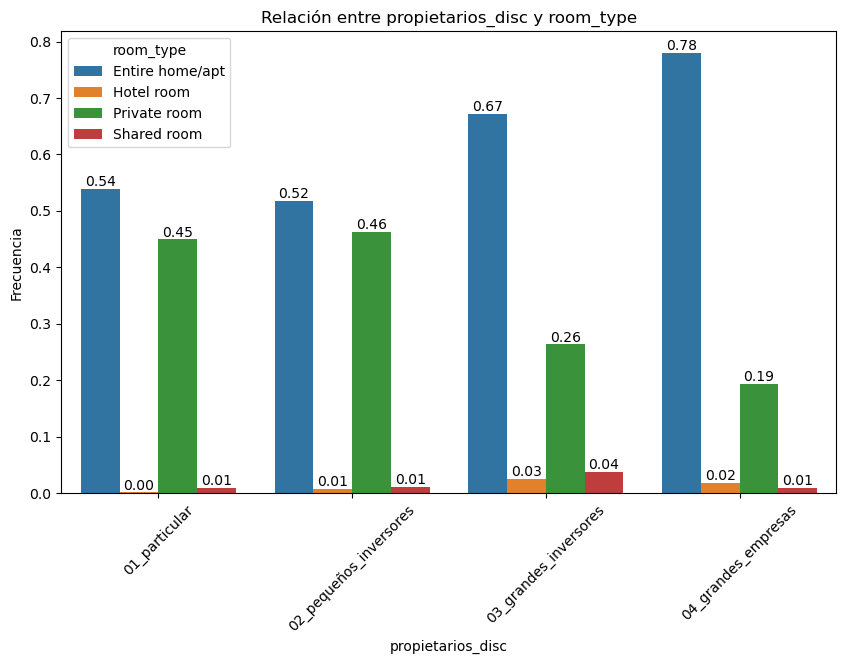

In [16]:
# Frecuencia relativa
plot_categorical_relationship_fin(df,'propietarios_disc','room_type',show_values=True,relative_freq=True)

In [17]:
# Correlación
correlacion_categoricas(df,'propietarios_disc','room_type')

Valor Chi-Cuadrado: 1097.124955796624
P-Value: 1.9353729865869224e-230
Grados de Libertad: 9
Tabla de Frecuencias Esperadas:
 [[5050.62900666   72.81497937 3363.14185973  117.41415424]
 [2984.94287528   43.03395747 1987.63091082   69.39225643]
 [1302.57389189   18.77922353  867.36538665   30.28149794]
 [1759.85422617   25.37183963 1171.8618428    40.9120914 ]]


#### Tipo de oferta por precio discretizada

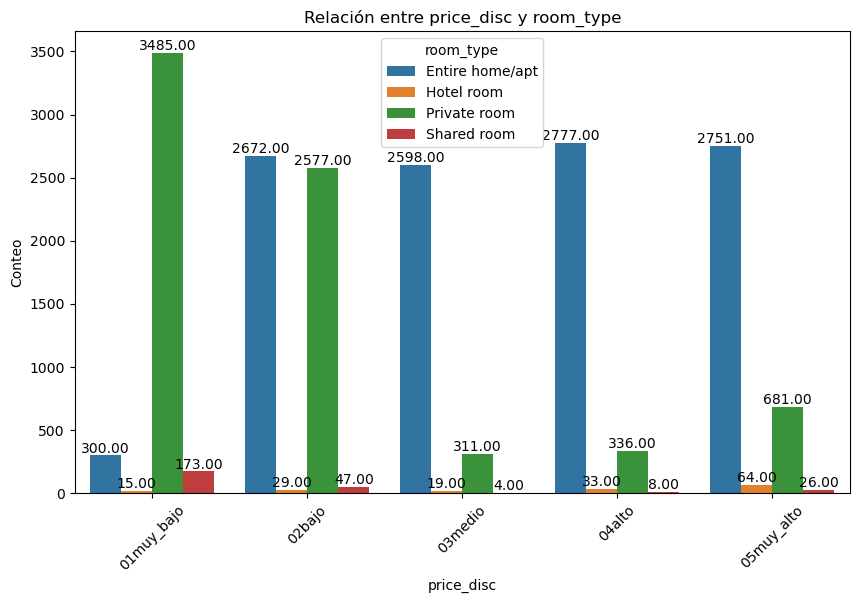

In [18]:
plot_categorical_relationship_fin(df,'price_disc','room_type',show_values=True,relative_freq=False)

In [19]:
correlacion_categoricas(df,'price_disc','room_type')

Valor Chi-Cuadrado: 7504.656066918033
P-Value: 0.0
Grados de Libertad: 12
Tabla de Frecuencias Esperadas:
 [[2332.1884058    33.62318841 1552.97101449   54.2173913 ]
 [3125.82513488   45.06505871 2081.44239924   72.66740717]
 [1721.11160478   24.81328679 1146.06368349   40.01142494]
 [1851.42769491   26.69205543 1232.83931027   43.04093938]
 [2067.44715963   29.80641066 1376.68359251   48.06283719]]


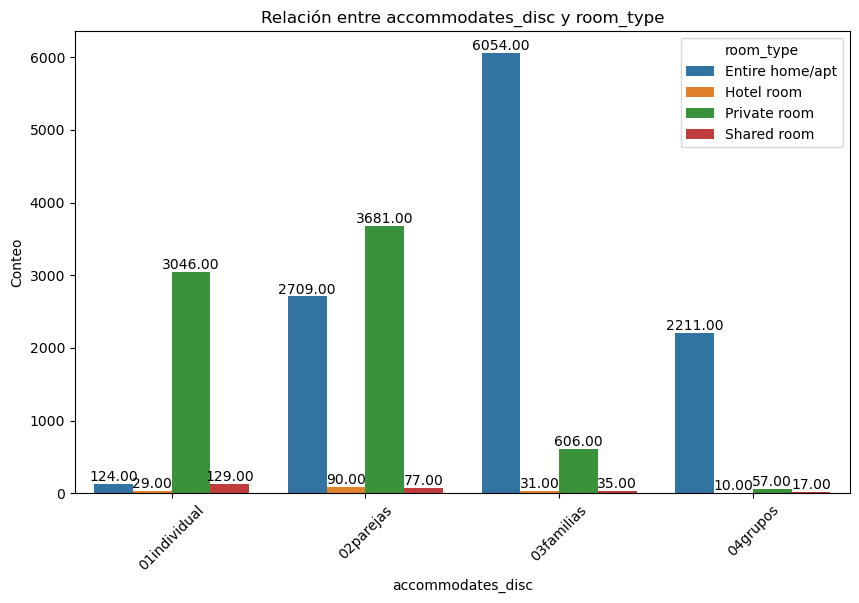

In [20]:
plot_categorical_relationship_fin(df,'accommodates_disc','room_type',show_values=True,relative_freq=False)

#### Tipo de oferta por nº de inquilinos discretizada

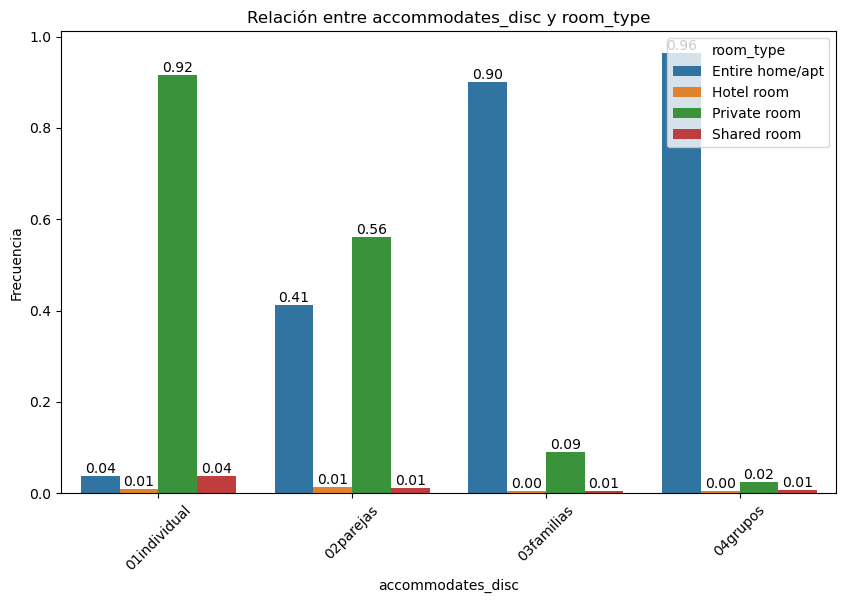

In [21]:
plot_categorical_relationship_fin(df,'accommodates_disc','room_type',show_values=True,relative_freq=True)

In [22]:
correlacion_categoricas(df,'accommodates_disc','room_type')

Valor Chi-Cuadrado: 9135.494092614446
P-Value: 0.0
Grados de Libertad: 9
Tabla de Frecuencias Esperadas:
 [[1953.56733312   28.16460383 1300.85263937   45.41542368]
 [3849.02073416   55.4913784  2563.00803978   89.47984767]
 [3948.22532529   56.92161219 2629.06696287   91.78609965]
 [1347.18660743   19.42240559  897.07235798   31.31862901]]


#### Tipo de oferta por superhost

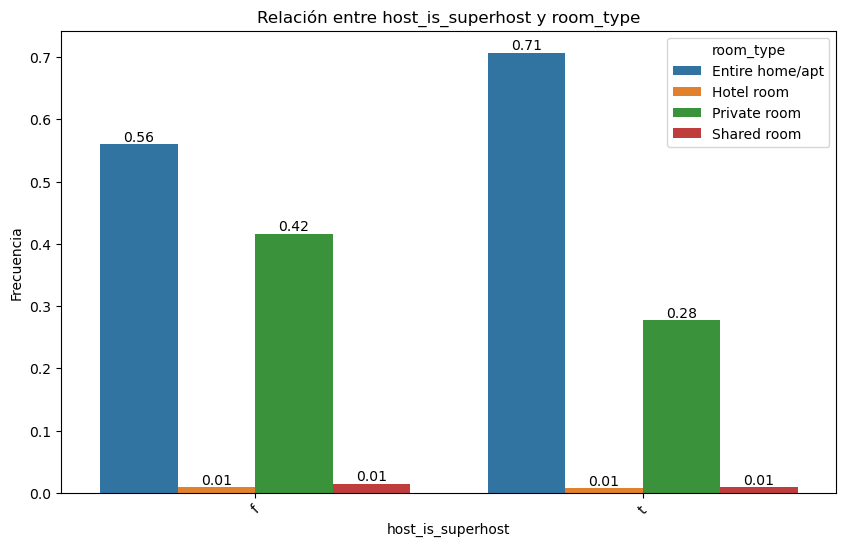

In [23]:
plot_categorical_relationship_fin(df,'host_is_superhost','room_type',show_values=True,relative_freq=True)

In [24]:
correlacion_categoricas(df,'host_is_superhost','room_type')

Valor Chi-Cuadrado: 251.74657110242106
P-Value: 2.7419748826238445e-54
Grados de Libertad: 3
Tabla de Frecuencias Esperadas:
 [[9066.9474241   130.71829049 6037.551042    210.78324341]
 [2031.0525759    29.28170951 1352.448958     47.21675659]]


#### Tipo de oferta por segmento_mercado

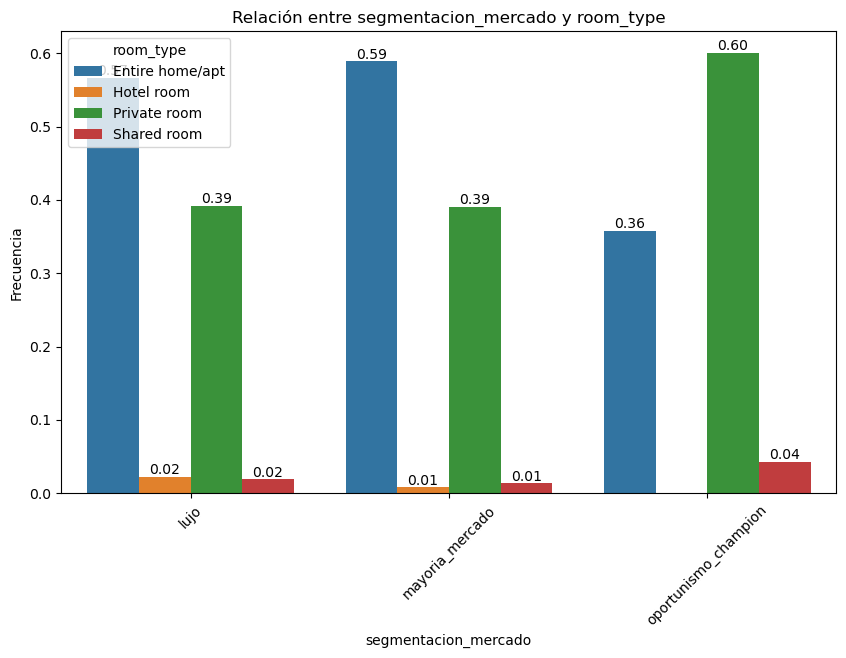

In [25]:
plot_categorical_relationship_fin(df,'segmentacion_mercado','room_type',show_values=True,relative_freq=True)

In [26]:
correlacion_categoricas(df,'segmentacion_mercado','room_type')

Valor Chi-Cuadrado: 41.23142710306495
P-Value: 2.6070359448758076e-07
Grados de Libertad: 6
Tabla de Frecuencias Esperadas:
 [[4.66085476e+02 6.71955993e+00 3.10359674e+02 1.08352904e+01]
 [1.05908239e+04 1.52688036e+02 7.05227864e+03 2.46209457e+02]
 [4.10906591e+01 5.92404528e-01 2.73616841e+01 9.55252301e-01]]


#### Precio discretizado por distrito

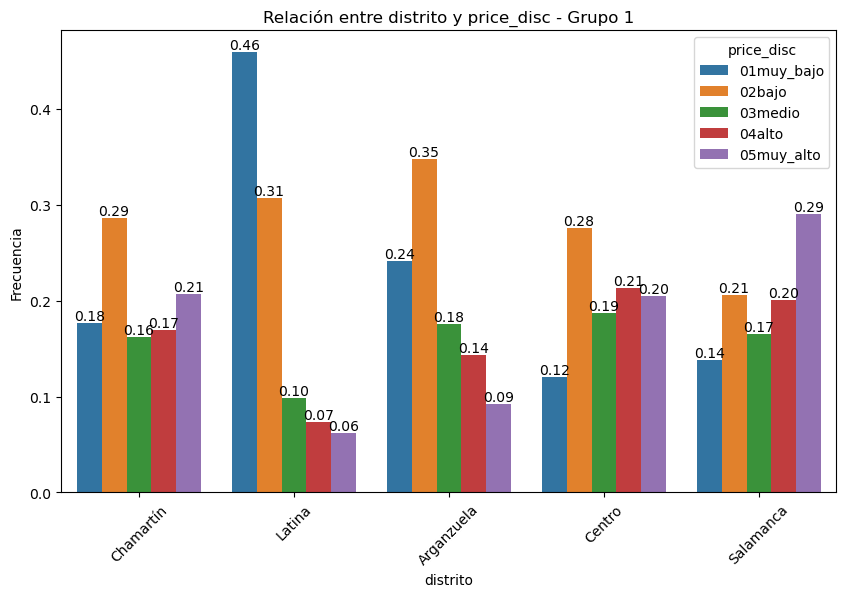

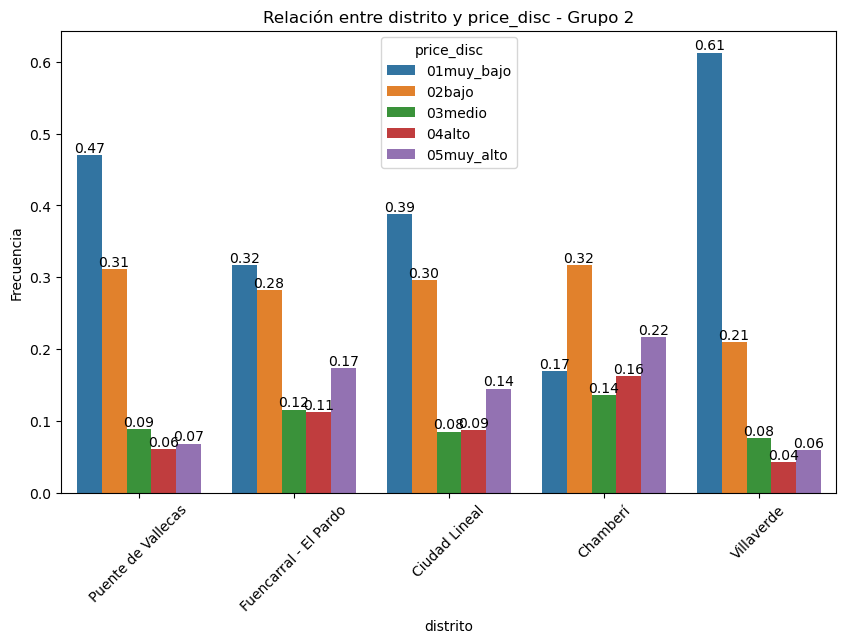

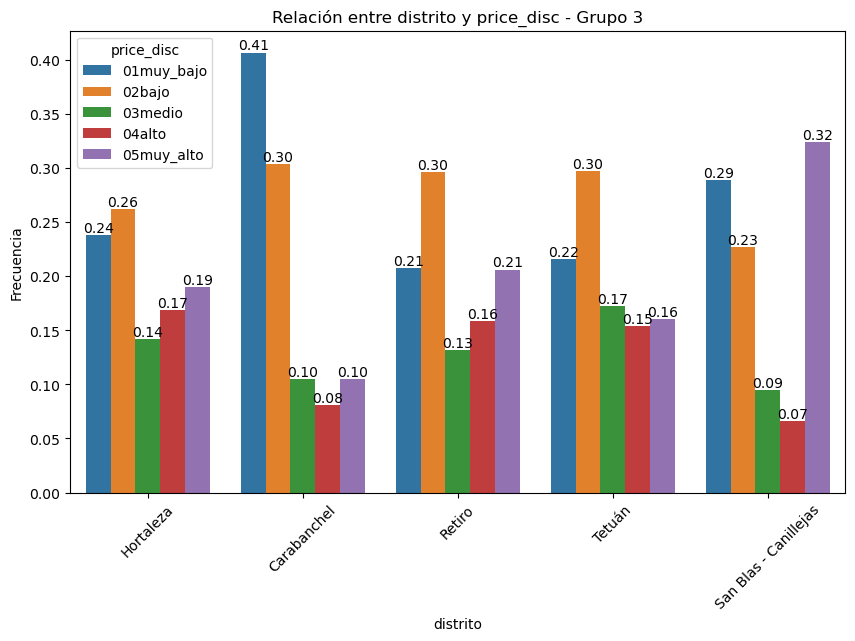

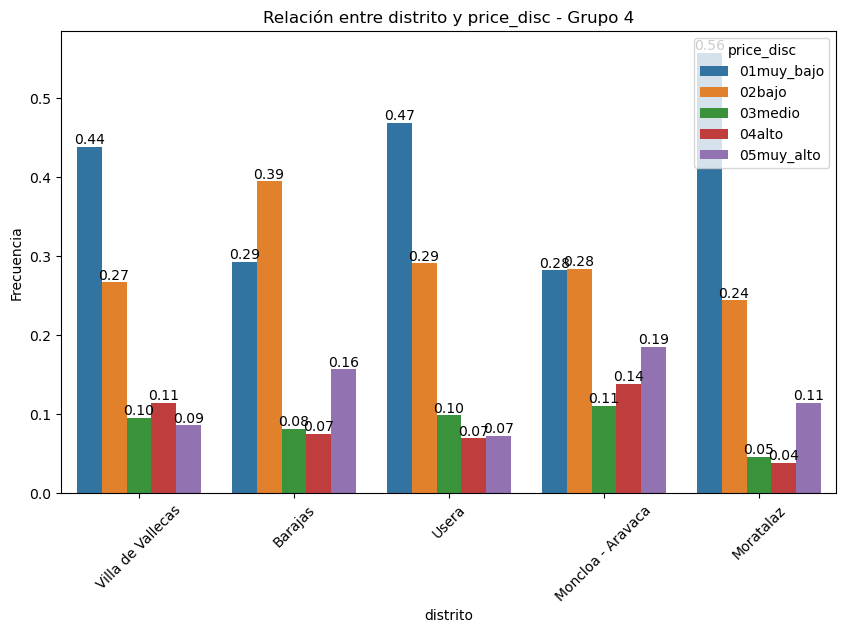

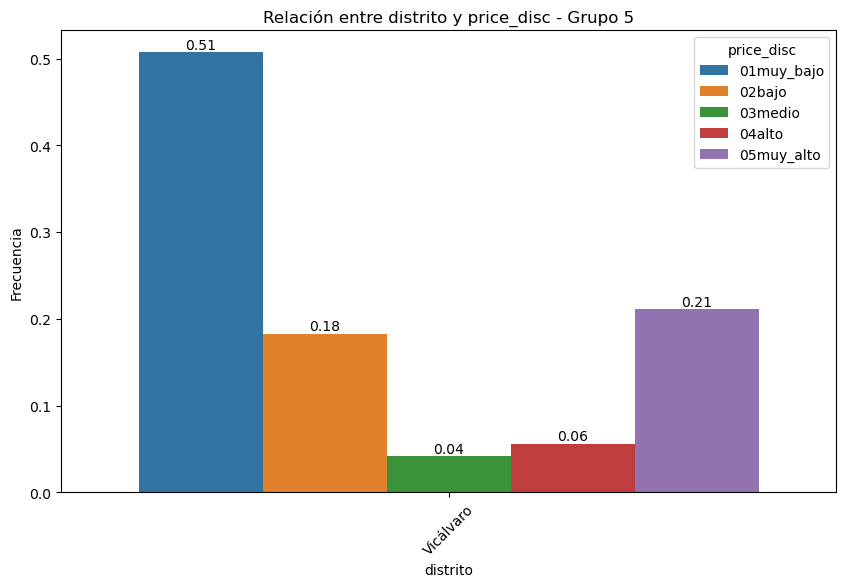

In [27]:
plot_categorical_relationship_fin(df,'distrito','price_disc',show_values=True,relative_freq=True)

In [28]:
correlacion_categoricas(df,'distrito','price_disc')

Valor Chi-Cuadrado: 2289.036270765015
P-Value: 0.0
Grados de Libertad: 80
Tabla de Frecuencias Esperadas:
 [[ 224.85507246  301.37258013  165.93885539  178.5031207   199.33037131]
 [  30.89130435   41.40352269   22.79720724   24.52332593   27.3846398 ]
 [ 140.58695652  188.42827674  103.75055538  111.60615678  124.62805459]
 [1771.94202899 2374.9285941  1307.66021369 1406.67132127 1570.79784195]
 [ 118.10144928  158.29101872   87.15666984   93.75584471  104.69501745]
 [ 241.24637681  323.34179626  178.0353327   191.51549773  213.86099651]
 [ 126.29710145  169.27562679   93.20490849  100.26203322  111.96033005]
 [  61.7826087    82.80704538   45.59441447   49.04665186   54.76927959]
 [  78.5942029   105.33957474   58.00105787   62.39267957   69.67248493]
 [ 114.94927536  154.06616947   84.8304242    91.25346451  101.90066646]
 [ 112.42753623  150.68629007   82.96942769   89.25156035   99.66518566]
 [  27.52898551   36.89701682   20.31587856   21.85412039   24.40399873]
 [ 113.89855072  

#### Precio discretizado por propietario discretizado

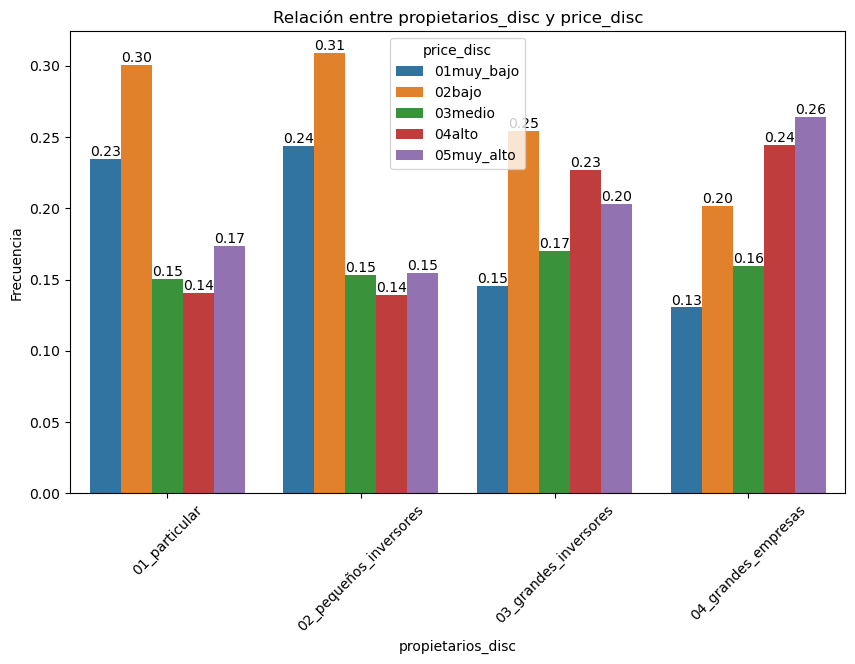

In [29]:
plot_categorical_relationship_fin(df,'propietarios_disc','price_disc',show_values=True,relative_freq=True)

In [30]:
correlacion_categoricas(df,'propietarios_disc','price_disc')

Valor Chi-Cuadrado: 641.1261432244792
P-Value: 1.731485082636049e-129
Grados de Libertad: 12
Tabla de Frecuencias Esperadas:
 [[1808.08695652 2423.37353221 1334.33449699 1435.36528086 1602.83973342]
 [1068.58695652 1432.22389718  788.59727071  848.3068867   947.28498889]
 [ 466.3115942   624.99603301  344.12927113  370.18544377  413.37765789]
 [ 630.01449275  844.40653761  464.93896118  500.14238866  558.4976198 ]]


#### Precio discretizado por huéspedes discretizado

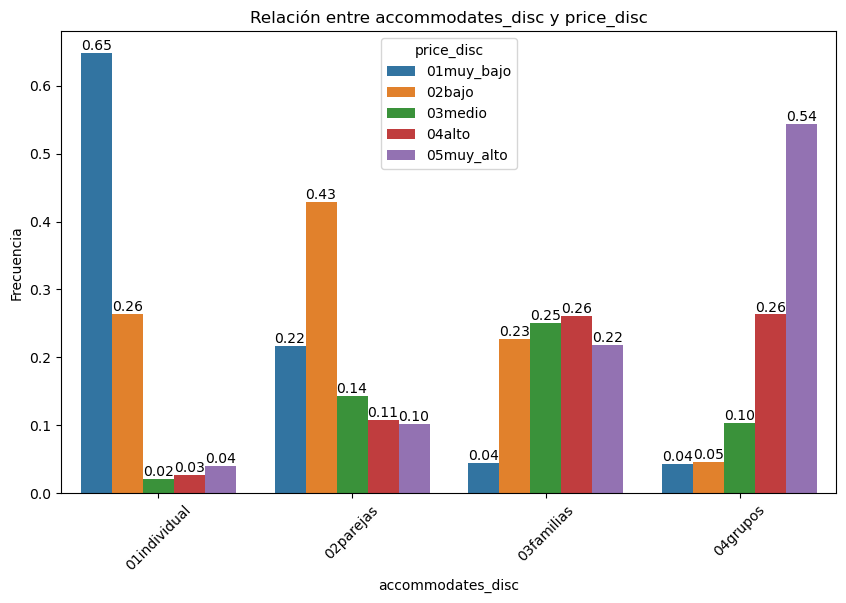

In [31]:
plot_categorical_relationship_fin(df,'accommodates_disc','price_disc',show_values=True,relative_freq=True)

In [32]:
correlacion_categoricas(df,'accommodates_disc','price_disc')

Valor Chi-Cuadrado: 9327.328162229252
P-Value: 0.0
Grados de Libertad: 12
Tabla de Frecuencias Esperadas:
 [[ 699.36231884  937.3532212   516.11636518  555.19475299  619.9733418 ]
 [1377.92028986 1846.82243732 1016.87950915 1093.87379668 1221.50396699]
 [1413.43478261 1894.42240559 1043.08854332 1122.06728023 1252.98698826]
 [ 482.2826087   646.40193589  355.91558235  382.8641701   427.53570295]]


#### Precio discretizado por segmento de mercado

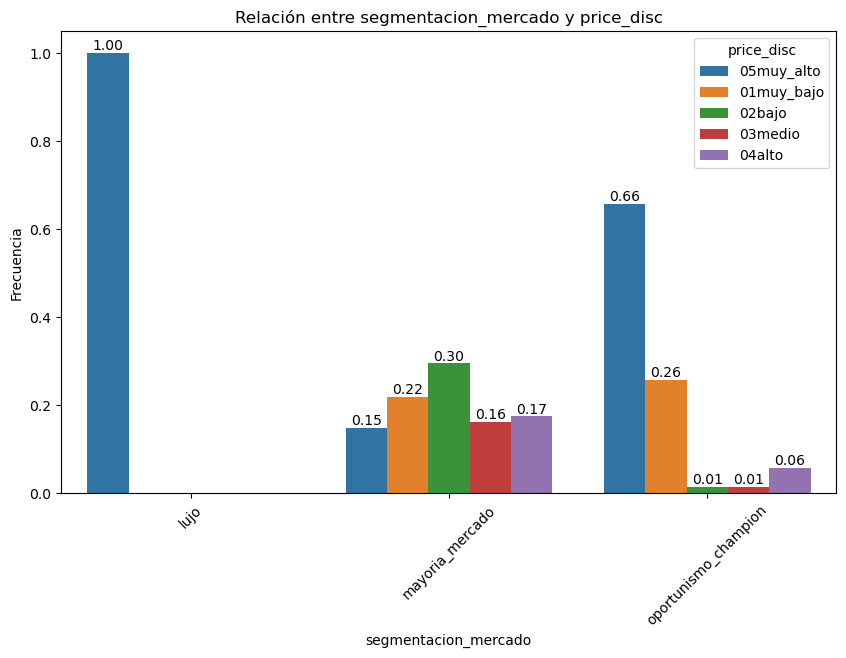

In [33]:
plot_categorical_relationship_fin(df,'segmentacion_mercado','price_disc',show_values=True,relative_freq=True)

In [34]:
correlacion_categoricas(df,'propietarios_disc','price_disc')

Valor Chi-Cuadrado: 641.1261432244792
P-Value: 1.731485082636049e-129
Grados de Libertad: 12
Tabla de Frecuencias Esperadas:
 [[1808.08695652 2423.37353221 1334.33449699 1435.36528086 1602.83973342]
 [1068.58695652 1432.22389718  788.59727071  848.3068867   947.28498889]
 [ 466.3115942   624.99603301  344.12927113  370.18544377  413.37765789]
 [ 630.01449275  844.40653761  464.93896118  500.14238866  558.4976198 ]]


### Variables combinadas

#### Precio por distrito (mediana)

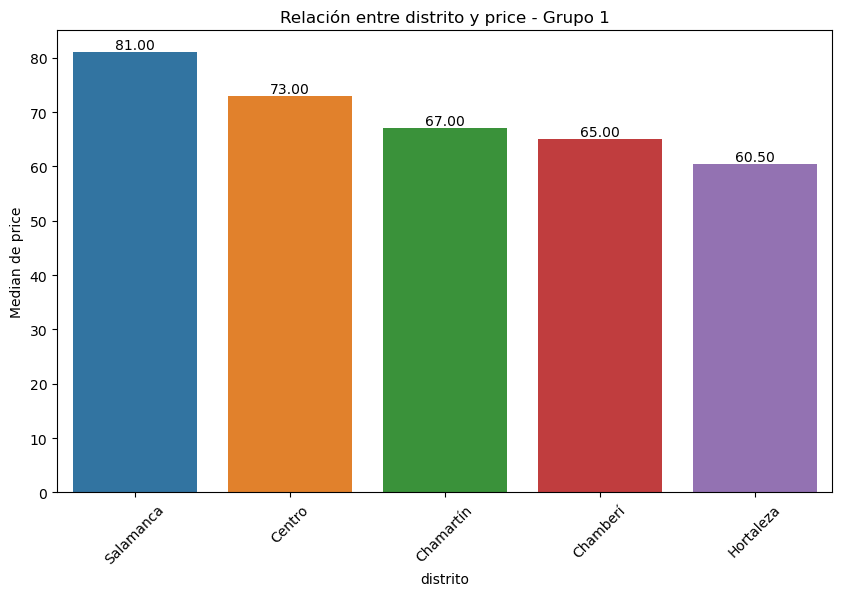

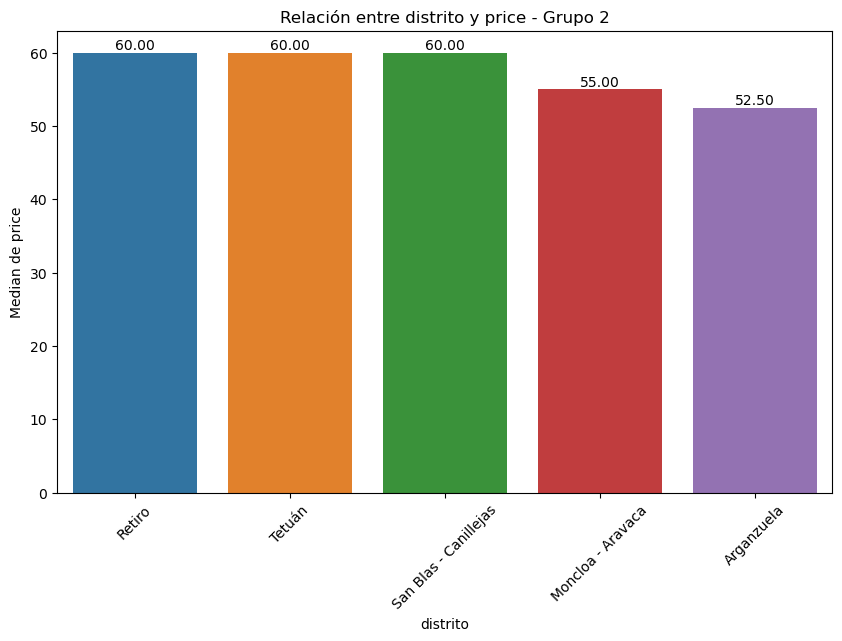

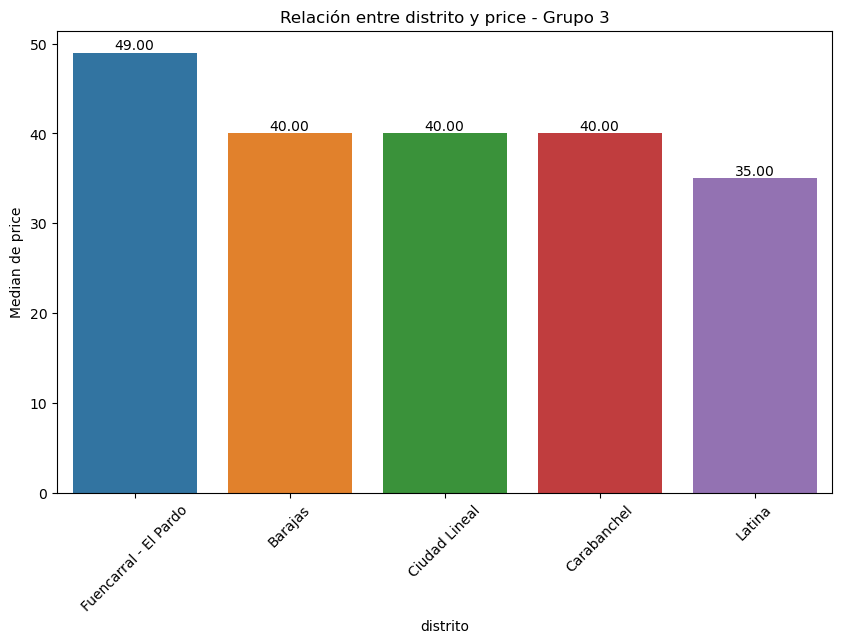

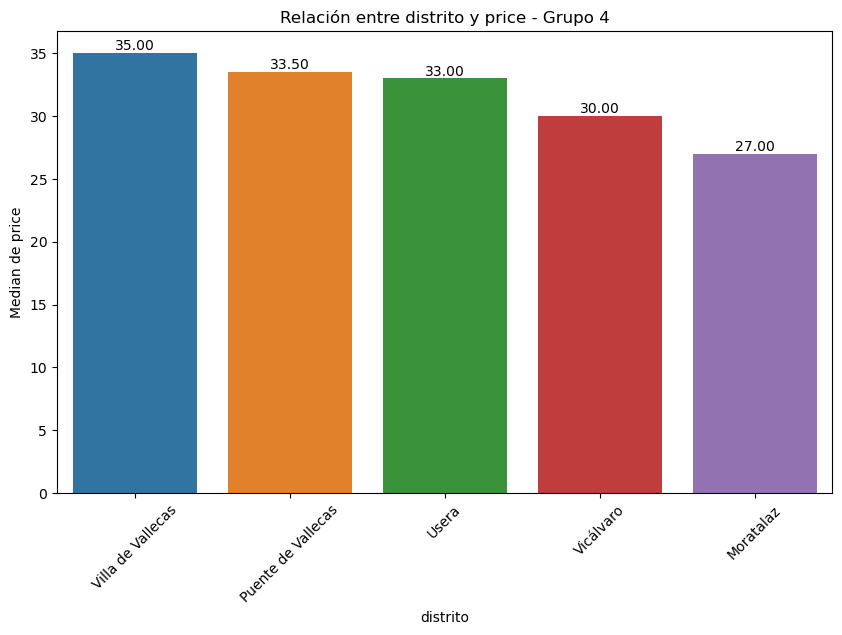

c:\Users\Alfonso\miniconda3\Lib\site-packages\seaborn\categorical.py:645: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  g_vals = grouped_vals.get_group(g)


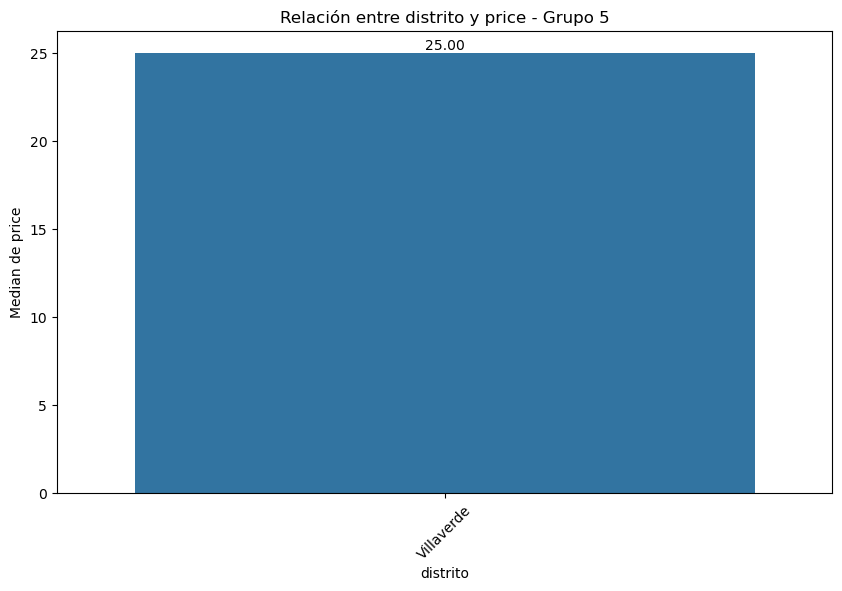

In [35]:
plot_categorical_numerical_relationship(df,'distrito','price', measure='median',show_values=True)

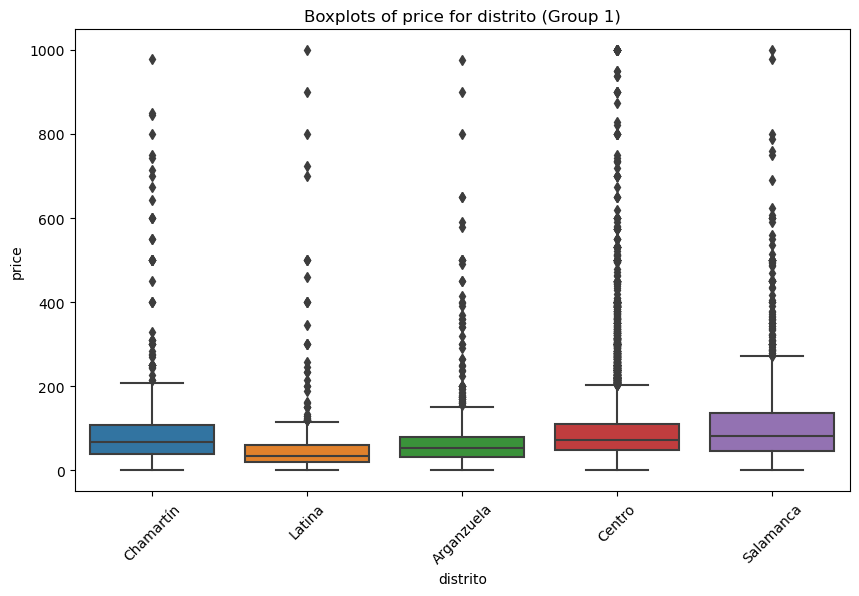

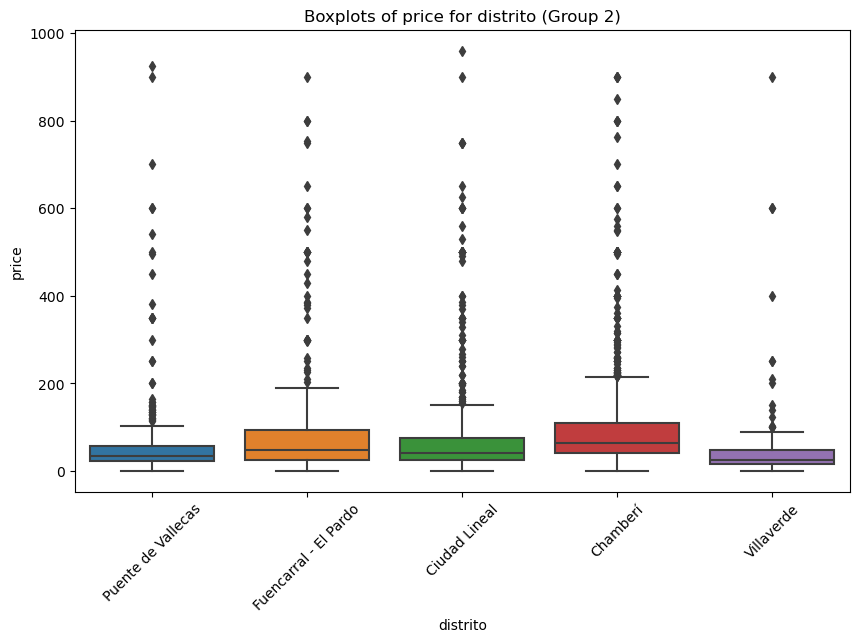

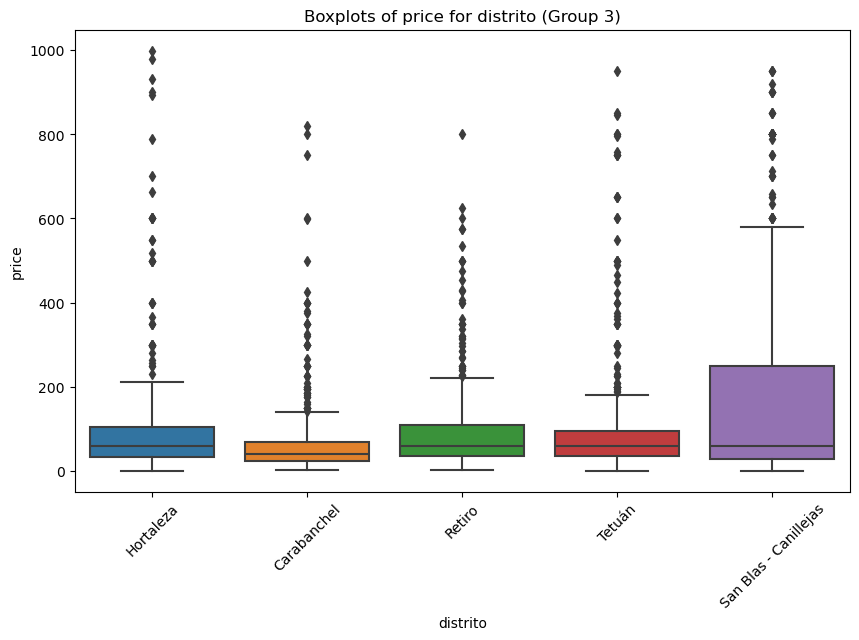

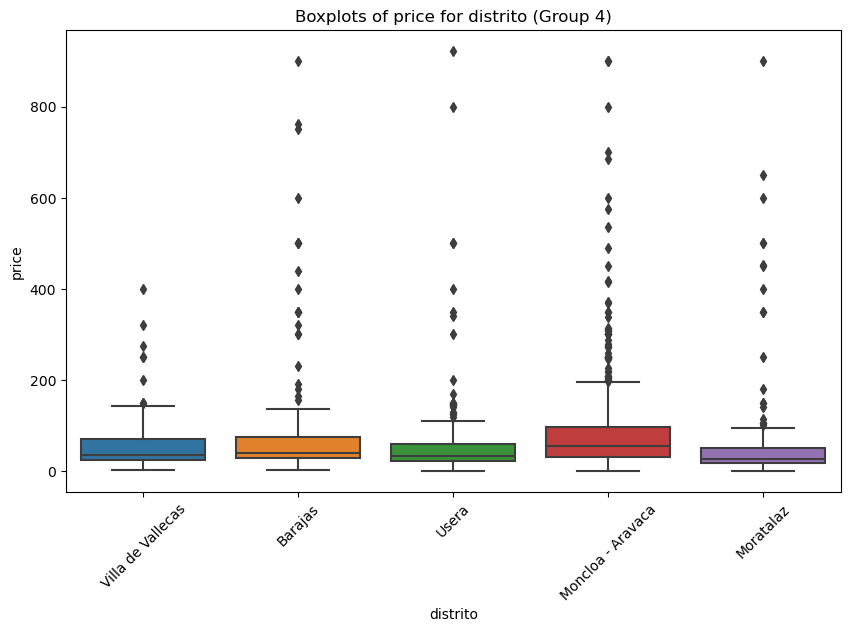

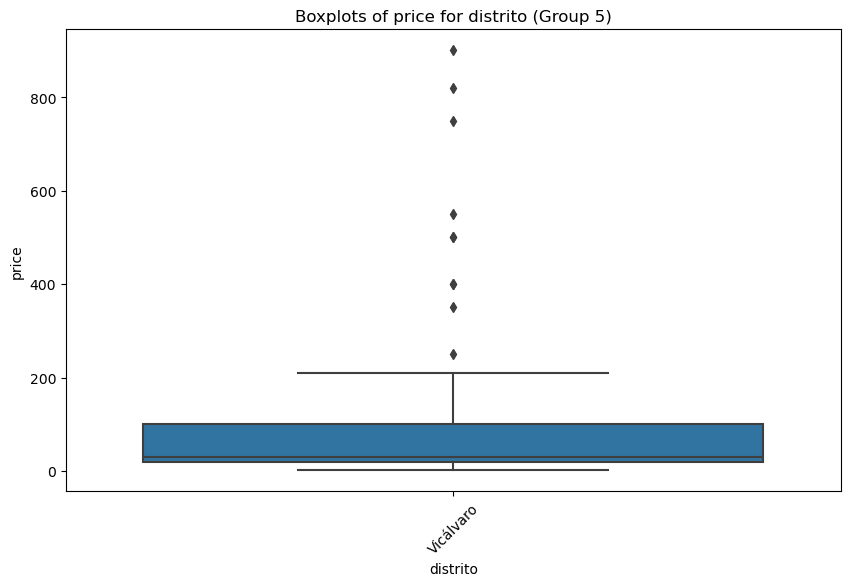

In [36]:
plot_grouped_boxplots(df,'distrito','price')

In [37]:
# Test de ANOVA
test_anova(df,'distrito','price')

Valor F: 31.415817772202374
Valor p: 3.8431730716728723e-118


La prueba ANOVA da como resultado que hay diferencias significativas en al menos una de las medias.

In [38]:
test_tukey_hsd(df,'distrito','price')

c:\Users\Alfonso\miniconda3\Lib\site-packages\scipy\integrate\_quadpack_py.py:1272: IntegrationWarning: The integral is probably divergent, or slowly convergent.
  quad_r = quad(f, low, high, args=args, full_output=self.full_output,


                 Multiple Comparison of Means - Tukey HSD, FWER=0.05                  
        group1                group2         meandiff p-adj    lower    upper   reject
--------------------------------------------------------------------------------------
           Arganzuela               Barajas   24.8425 0.5863  -10.2292  59.9142  False
           Arganzuela           Carabanchel   -5.5611    1.0  -25.2131  14.0909  False
           Arganzuela                Centro   26.0507    0.0   13.1114    38.99   True
           Arganzuela             Chamartín   33.0327    0.0   12.2615  53.8039   True
           Arganzuela              Chamberí   27.8011    0.0   10.8585  44.7437   True
           Arganzuela         Ciudad Lineal   13.1722 0.7484   -7.1524  33.4967  False
           Arganzuela Fuencarral - El Pardo   32.2928 0.0021    6.0384  58.5473   True
           Arganzuela             Hortaleza   37.4585    0.0   13.5079  61.4092   True
           Arganzuela                Latina

#### Precio por tipo de oferta (mediana)

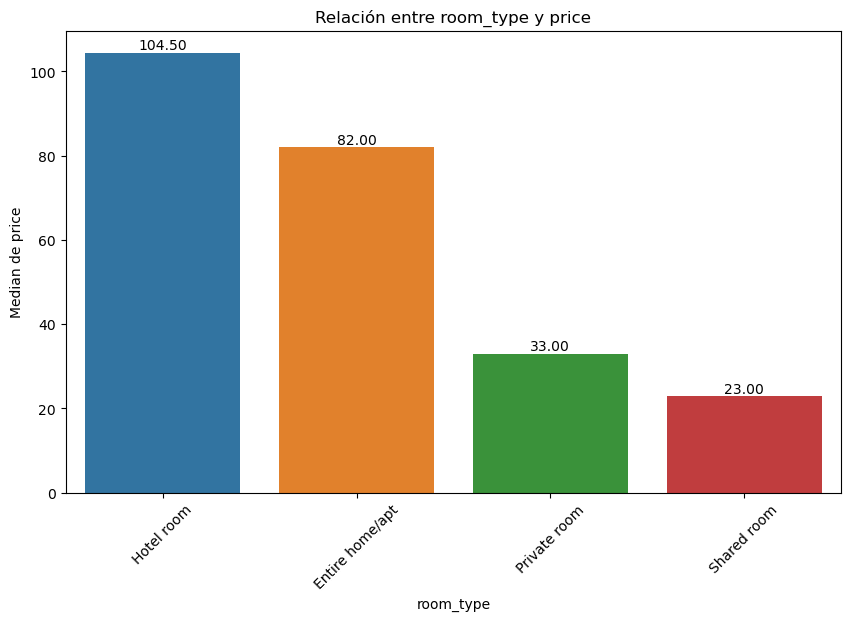

In [39]:
plot_categorical_numerical_relationship(df,'room_type','price', measure='median',show_values=True)

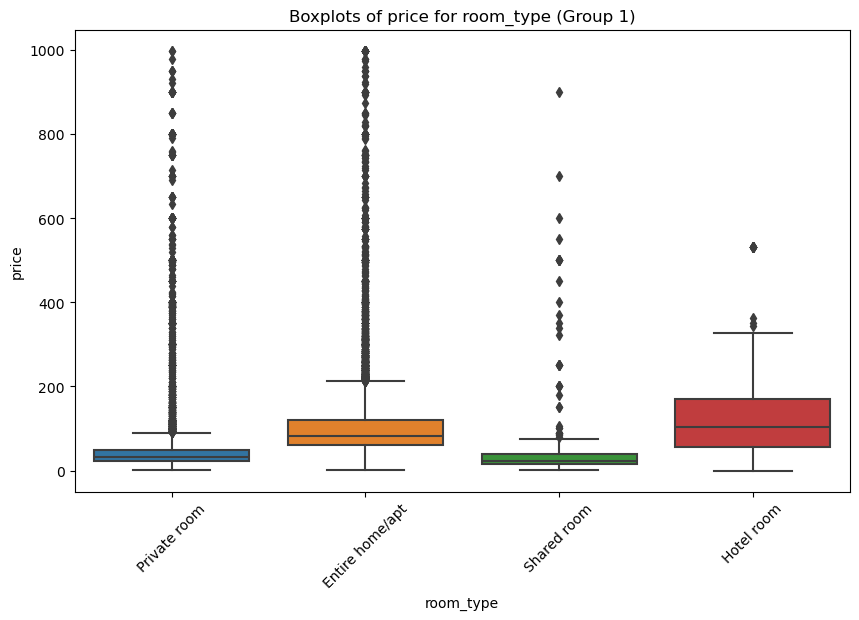

In [40]:
plot_grouped_boxplots(df,'room_type','price')

In [41]:
# Test ANOVA
test_anova(df,'room_type','price')

Valor F: 257.65438124574615
Valor p: 6.795076296974786e-164


La prueba ANOVA da como resultado que hay diferencias significativas en al menos una de las medias.

In [42]:
# Test de Tukey
test_tukey_hsd(df,'room_type','price')

         Multiple Comparison of Means - Tukey HSD, FWER=0.05         
     group1        group2    meandiff p-adj   lower    upper   reject
---------------------------------------------------------------------
Entire home/apt   Hotel room  30.7171 0.003    7.9603  53.4739   True
Entire home/apt Private room -44.8597   0.0  -49.1508 -40.5687   True
Entire home/apt  Shared room -49.6072   0.0   -67.606 -31.6084   True
     Hotel room Private room -75.5768   0.0  -98.4146  -52.739   True
     Hotel room  Shared room -80.3243   0.0 -109.0838 -51.5648   True
   Private room  Shared room  -4.7475 0.907  -22.8486  13.3536  False
---------------------------------------------------------------------


#### Precio por huéspedes_discretizado (mediana)

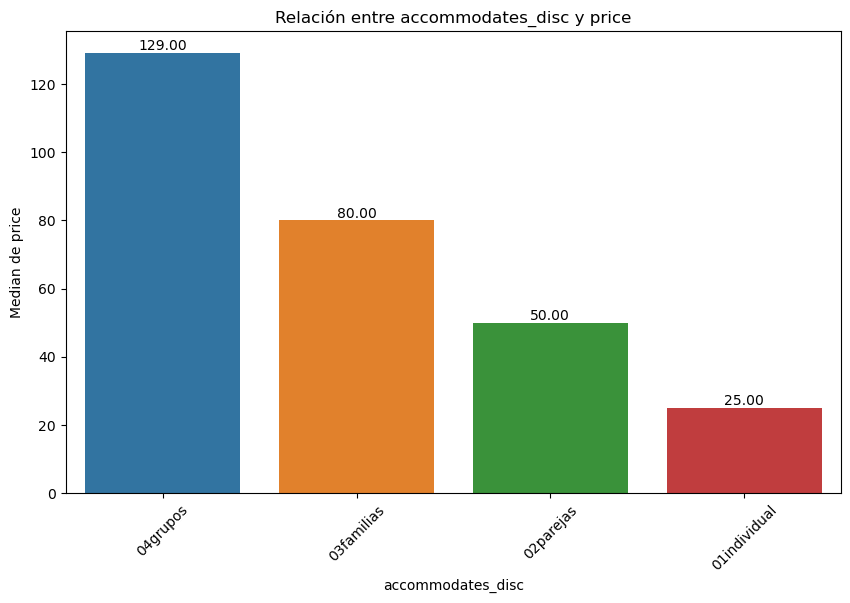

In [43]:
plot_categorical_numerical_relationship(df,'accommodates_disc','price', measure='median',show_values=True)

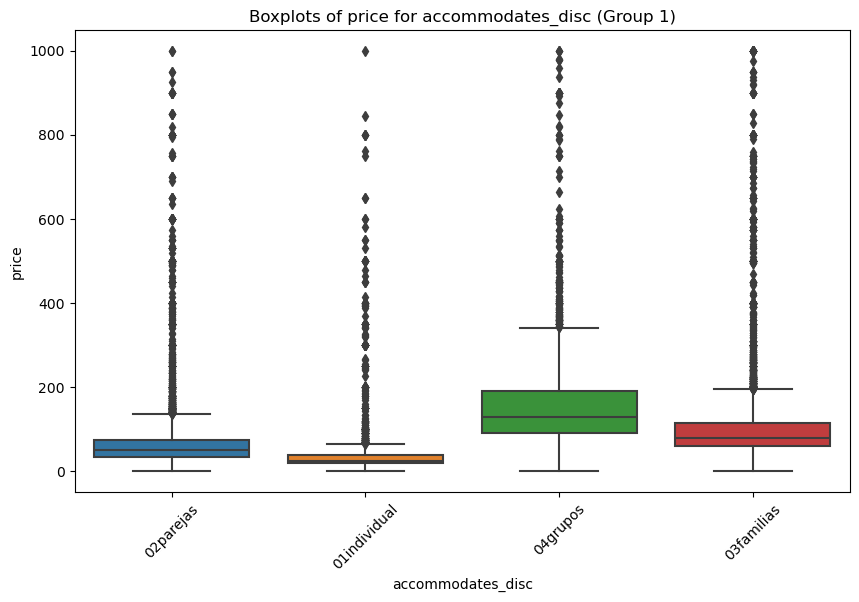

In [44]:
plot_grouped_boxplots(df,'accommodates_disc','price')

In [45]:
# Test ANOVA
test_anova(df,'accommodates','price')

Valor F: 155.33887218689537
Valor p: 0.0


In [46]:
# Test de Tukey
test_tukey_hsd(df,'accommodates','price')

  Multiple Comparison of Means - Tukey HSD, FWER=0.05  
group1 group2 meandiff p-adj    lower    upper   reject
-------------------------------------------------------
     1      2  34.5927    0.0   26.7812  42.4042   True
     1      3  53.8784    0.0   43.0164  64.7403   True
     1      4   70.325    0.0   61.7921  78.8579   True
     1      5  91.8381    0.0    77.543 106.1332   True
     1      6 104.1033    0.0   92.6919 115.5146   True
     1      7 124.7648    0.0   98.3533 151.1764   True
     1      8 138.0803    0.0  116.7507 159.4098   True
     1      9 138.3261    0.0     74.12 202.5322   True
     1     10 181.5003    0.0  146.2413 216.7592   True
     1     11 142.8208 0.0005   36.6801 248.9614   True
     1     12 232.3317    0.0  173.2179 291.4454   True
     1     13 187.7878    0.0   65.2822 310.2933   True
     1     14 222.4624    0.0   106.226 338.6988   True
     1     15 236.3126    0.0   97.4459 375.1792   True
     1     16  227.806    0.0  170.8172 284.7947

#### Precio por propietarios_disc (median)

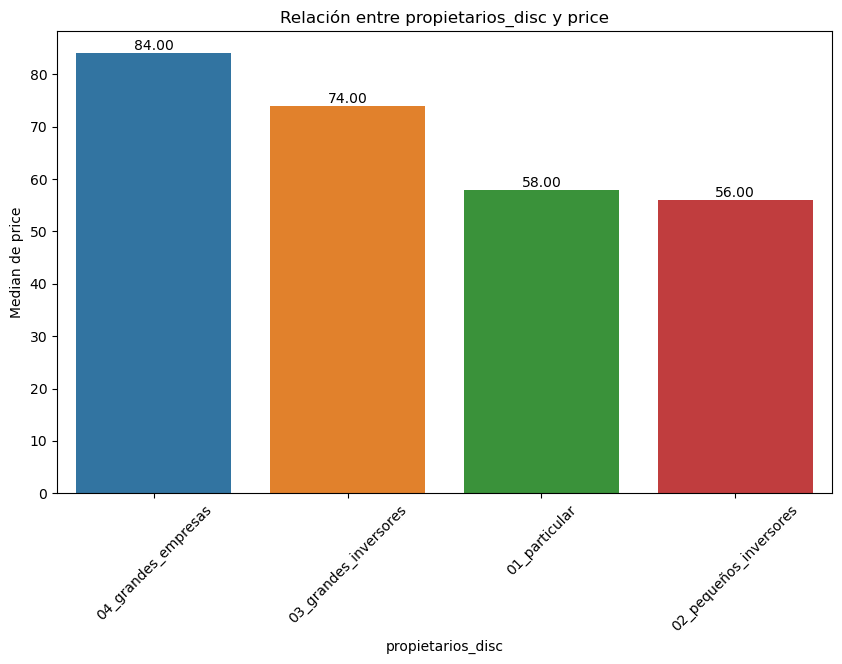

In [47]:
plot_categorical_numerical_relationship(df,'propietarios_disc','price', measure='median',show_values=True)

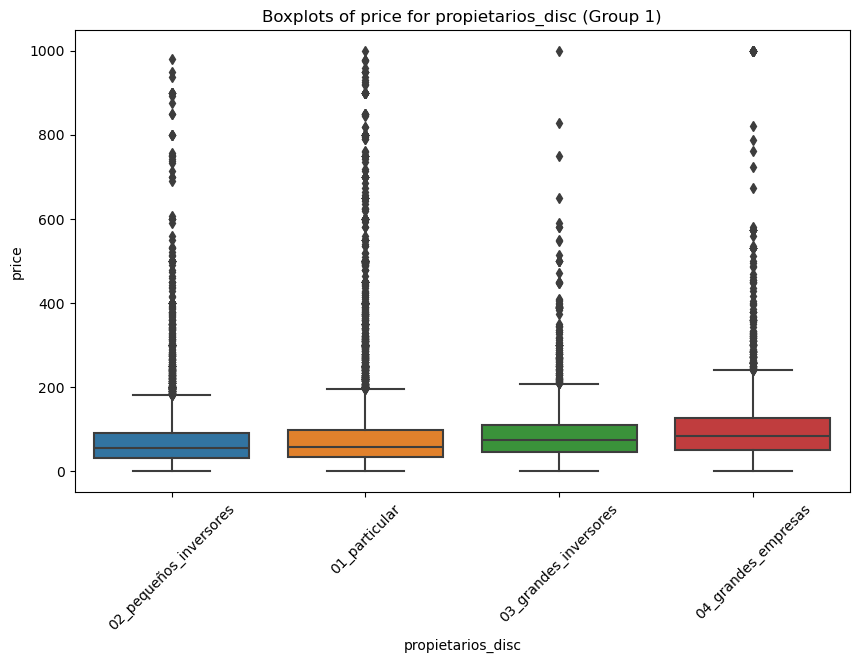

In [48]:
plot_grouped_boxplots(df,'propietarios_disc','price')

In [49]:
# Test ANOVA
test_anova(df,'propietarios_disc','price')

Valor F: 40.355502772955404
Valor p: 5.497954368722464e-26


In [50]:
# Test de Tukey
test_tukey_hsd(df,'propietarios_disc','price')

                 Multiple Comparison of Means - Tukey HSD, FWER=0.05                  
        group1                 group2         meandiff p-adj   lower    upper   reject
--------------------------------------------------------------------------------------
         01_particular 02_pequeños_inversores -15.5772    0.0 -20.7185 -10.4359   True
         01_particular  03_grandes_inversores  -5.6559 0.1531 -12.5762   1.2644  False
         01_particular    04_grandes_empresas  11.7466    0.0   5.5824  17.9109   True
02_pequeños_inversores  03_grandes_inversores   9.9213 0.0032   2.5264  17.3163   True
02_pequeños_inversores    04_grandes_empresas  27.3238    0.0  20.6311  34.0166   True
 03_grandes_inversores    04_grandes_empresas  17.4025    0.0    9.263   25.542   True
--------------------------------------------------------------------------------------


#### Oferta vs precio_m2

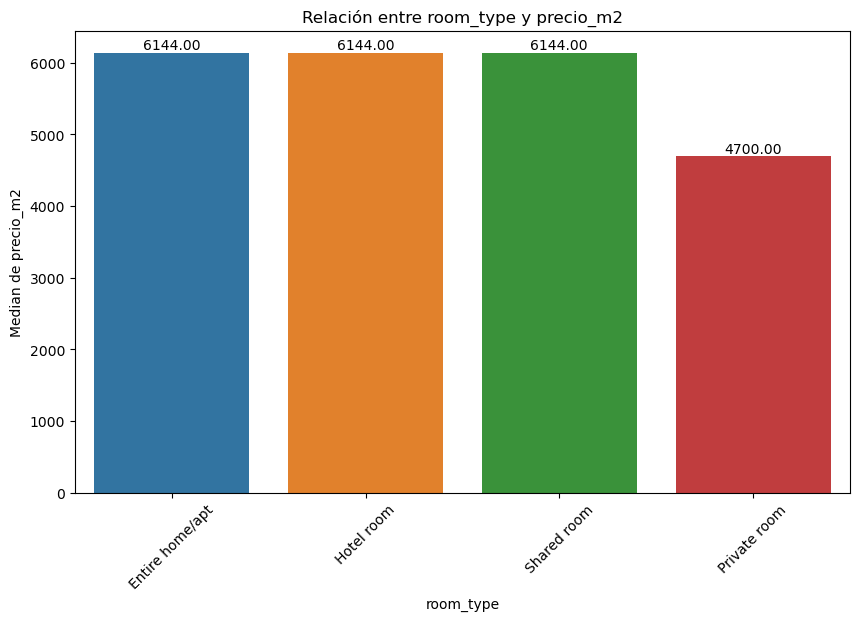

In [51]:
plot_categorical_numerical_relationship(df,'room_type','precio_m2', measure='median',show_values=True)

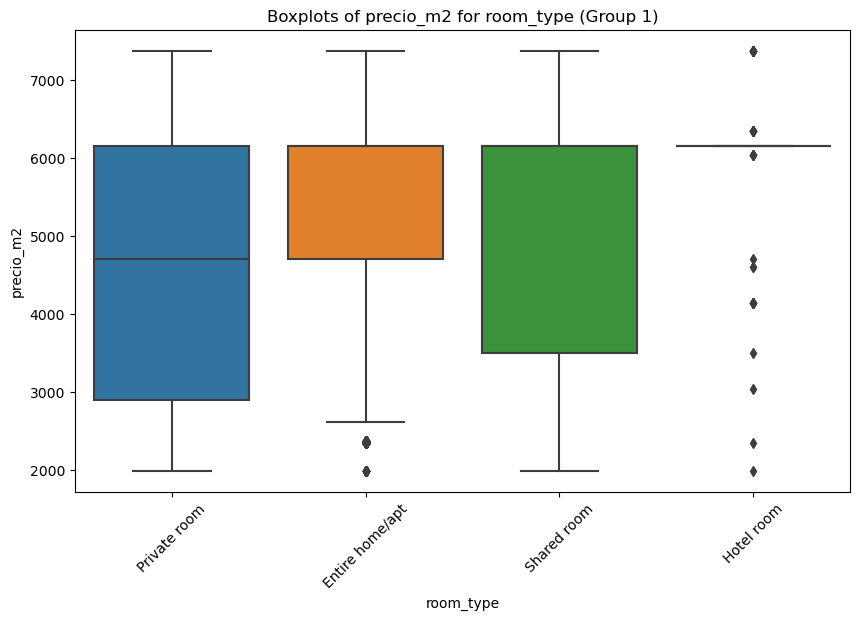

In [52]:
plot_grouped_boxplots(df,'room_type','precio_m2')

In [53]:
# Test ANOVA
test_anova(df,'room_type','precio_m2')

Valor F: 583.7662724318265
Valor p: 0.0


In [54]:
# Test de Turkey
test_tukey_hsd(df,'room_type','precio_m2')

            Multiple Comparison of Means - Tukey HSD, FWER=0.05            
     group1        group2     meandiff  p-adj    lower      upper    reject
---------------------------------------------------------------------------
Entire home/apt   Hotel room   457.0415 0.0002   171.4601   742.6229   True
Entire home/apt Private room  -863.3907    0.0  -917.2402  -809.5411   True
Entire home/apt  Shared room  -461.3613    0.0  -687.2331  -235.4894   True
     Hotel room Private room -1320.4322    0.0   -1607.03 -1033.8343   True
     Hotel room  Shared room  -918.4028    0.0 -1279.3136  -557.4919   True
   Private room  Shared room   402.0294    0.0   174.8738    629.185   True
---------------------------------------------------------------------------


In [55]:
df.columns

Index(['id', 'host_id', 'host_is_superhost', 'name', 'host_name', 'host_since',
       'amenities', 'host_listings_count', 'neighbourhood_cleansed',
       'neighbourhood_group_cleansed', 'latitude', 'longitude',
       'property_type', 'room_type', 'accommodates', 'bedrooms', 'beds',
       'price', 'minimum_nights', 'maximum_nights', 'number_of_reviews',
       'review_scores_rating', 'calculated_host_listings_count', 'bathrooms',
       'distrito', 'precio_m2', 'price_disc', 'accommodates_disc',
       'propietarios_disc', 'price_accommodates', 'price_bedrooms',
       'antiguedad_host', 'champion', 'segmentacion_mercado'],
      dtype='object')

In [56]:
df.select_dtypes(include=['int', 'float']).columns

Index(['id', 'host_id', 'host_listings_count', 'latitude', 'longitude',
       'accommodates', 'bedrooms', 'beds', 'price', 'minimum_nights',
       'maximum_nights', 'number_of_reviews', 'review_scores_rating',
       'calculated_host_listings_count', 'bathrooms', 'precio_m2',
       'price_accommodates', 'price_bedrooms', 'antiguedad_host'],
      dtype='object')

### Variables numéricas

#### Heatmap

In [57]:
columnas_temp = df.select_dtypes(include=['int', 'float']).columns
columnas_temp

Index(['id', 'host_id', 'host_listings_count', 'latitude', 'longitude',
       'accommodates', 'bedrooms', 'beds', 'price', 'minimum_nights',
       'maximum_nights', 'number_of_reviews', 'review_scores_rating',
       'calculated_host_listings_count', 'bathrooms', 'precio_m2',
       'price_accommodates', 'price_bedrooms', 'antiguedad_host'],
      dtype='object')

In [58]:
columnas_numericas = [ 'accommodates', 'bedrooms', 'beds', 'price', 'minimum_nights',
       'number_of_reviews', 'review_scores_rating',
       'bathrooms', 'precio_m2',
       'price_accommodates', 'price_bedrooms', 'antiguedad_host']

In [59]:
corr_matrix = df[columnas_numericas].corr()
corr_matrix

,accommodates,bedrooms,beds,price,minimum_nights,number_of_reviews,review_scores_rating,bathrooms,precio_m2,price_accommodates,price_bedrooms,antiguedad_host
accommodates,1.000000,0.690199,0.769728,0.325451,-0.036301,0.111890,0.014404,0.389720,0.170545,-0.126716,-0.052268,0.040814
bedrooms,0.690199,1.000000,0.705474,0.282346,-0.002157,0.019998,0.009984,0.466988,0.055538,-0.045188,-0.069591,0.021701
beds,0.769728,0.705474,1.000000,0.275514,-0.021147,0.064431,0.019891,0.416379,0.110547,-0.075515,-0.148974,0.025439
price,0.325451,0.282346,0.275514,1.000000,-0.027020,-0.078050,-0.008600,0.182119,0.074583,0.757108,0.789794,-0.018497
minimum_nights,-0.036301,-0.002157,-0.021147,-0.027020,1.000000,-0.035728,-0.027683,0.006857,0.007523,-0.012486,-0.015382,0.017997
number_of_reviews,0.111890,0.019998,0.064431,-0.078050,-0.035728,1.000000,0.110837,-0.028430,0.116715,-0.118920,-0.104113,0.257611
review_scores_rating,0.014404,0.009984,0.019891,-0.008600,-0.027683,0.110837,1.000000,0.025793,0.021003,-0.030092,-0.036374,0.080802
bathrooms,0.389720,0.466988,0.416379,0.182119,0.006857,-0.028430,0.025793,1.000000,0.090300,-0.029402,-0.041140,0.018262
precio_m2,0.170545,0.055538,0.110547,0.074583,0.007523,0.116715,0.021003,0.090300,1.000000,-0.025886,0.003532,0.115605
price_accommodates,-0.126716,-0.045188,-0.075515,0.757108,-0.012486,-0.118920,-0.030092,-0.029402,-0.025886,1.000000,0.881487,-0.042422


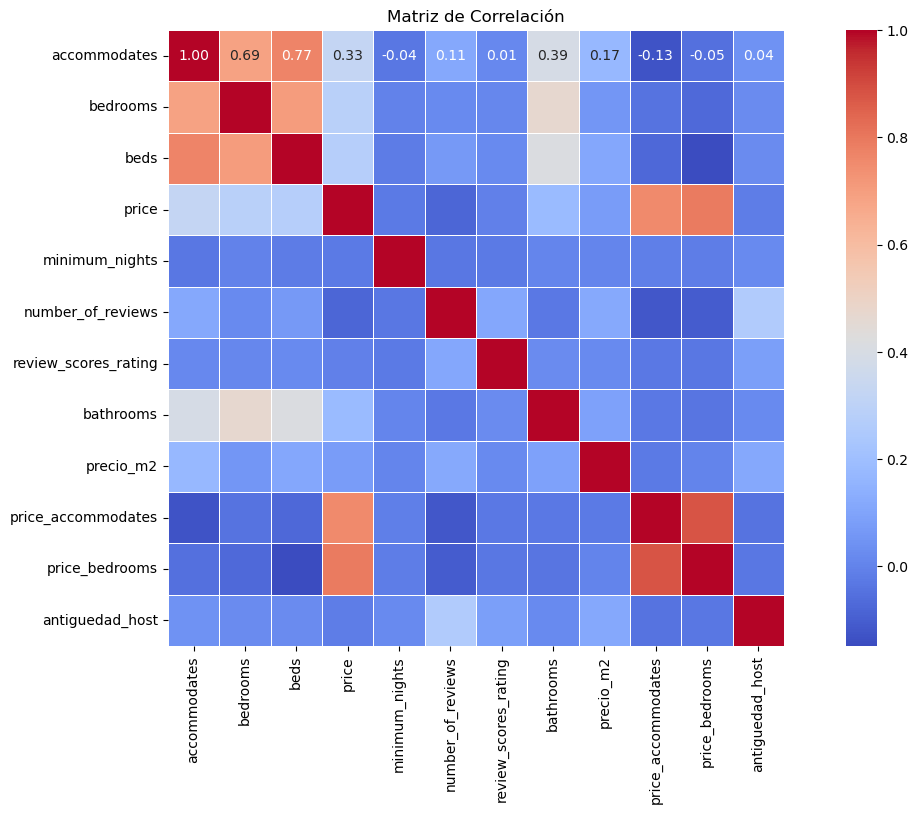

In [60]:
plt.figure(figsize=(16, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm',fmt=".2f", cbar=True, square=True, linewidths=.5)
plt.title('Matriz de Correlación')
plt.xticks(fontsize=10)  
plt.yticks(fontsize=10) 

plt.show()

- Quitando la relación que existe entre número de huéspedes con camas y habitaciones (algo lógico), el resto no muestra mucha correlación entre sí.
- No tengo en cuenta la relación entre 'price' y 'price_accommodates' y 'price_bedrooms', dado que se han sacado de `price'
- Hay una cierta correlación negativa entre:
    - price_accommodates y number_of_reviews
    - price_beds y number_of_reviews
    - price y number_of_reviews

- Hay cierta correlación positiva entre:
    - bathrooms y accommodates,bedrooms y beds

#### Precio por precio_m2

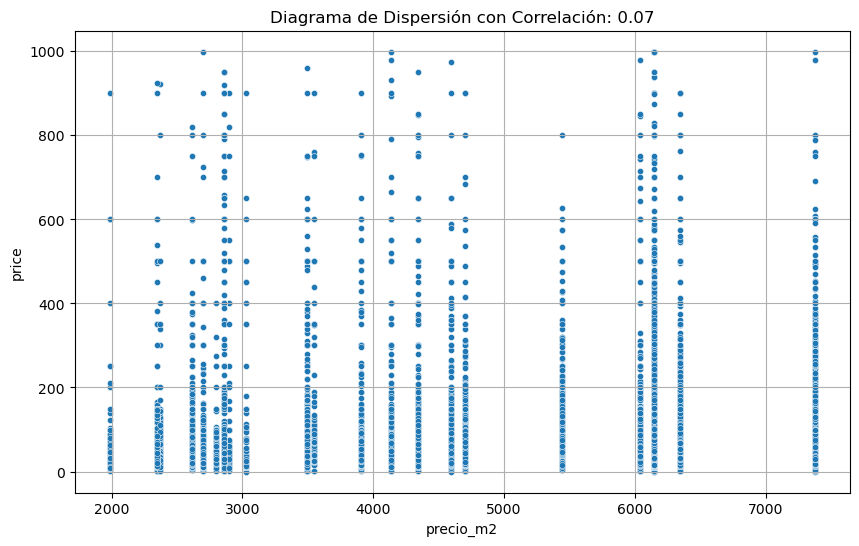

In [61]:
grafico_dispersion_con_correlacion(df,'precio_m2','price',20, mostrar_correlacion=True)

In [62]:
# Paso la correlación (Kendal, según el tamaño de la muestra)
correlacion_numericas(df,'precio_m2','price')

Correlación de Kendall: 0.18624997346726868
Valor p: 4.020567006689165e-274


C:\Users\Alfonso\AppData\Local\Temp\ipykernel_11832\1990776667.py:4: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 18906.
  _, p1 = shapiro(df[var_num1])
C:\Users\Alfonso\AppData\Local\Temp\ipykernel_11832\1990776667.py:5: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 18906.
  _, p2 = shapiro(df[var_num2])


#### Precio vs habitaciones

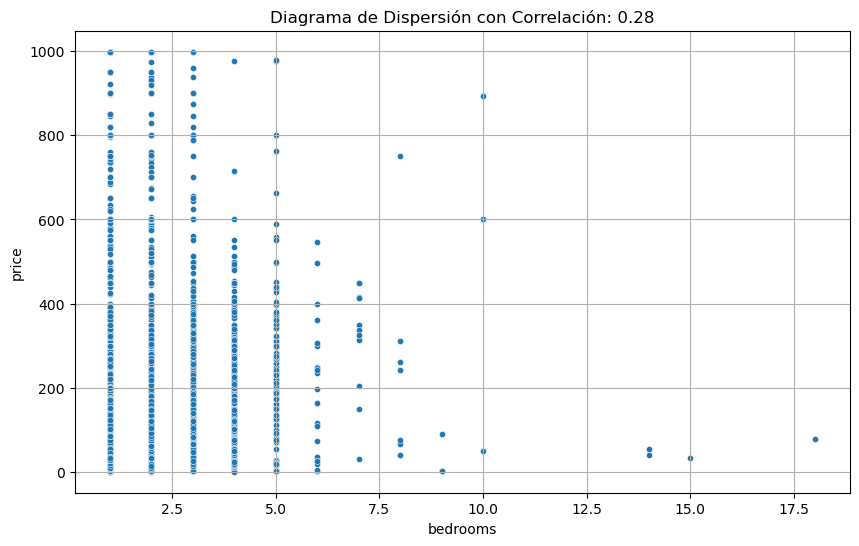

In [63]:
grafico_dispersion_con_correlacion(df,'bedrooms','price',20, mostrar_correlacion=True)

In [64]:
# Paso la correlación (Kendal, según el tamaño de la muestra)
correlacion_numericas(df,'bedrooms','price')

Correlación de Kendall: 0.34915715129869934
Valor p: 0.0


C:\Users\Alfonso\AppData\Local\Temp\ipykernel_11832\1990776667.py:4: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 18906.
  _, p1 = shapiro(df[var_num1])
C:\Users\Alfonso\AppData\Local\Temp\ipykernel_11832\1990776667.py:5: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 18906.
  _, p2 = shapiro(df[var_num2])


#### Precio vs camas

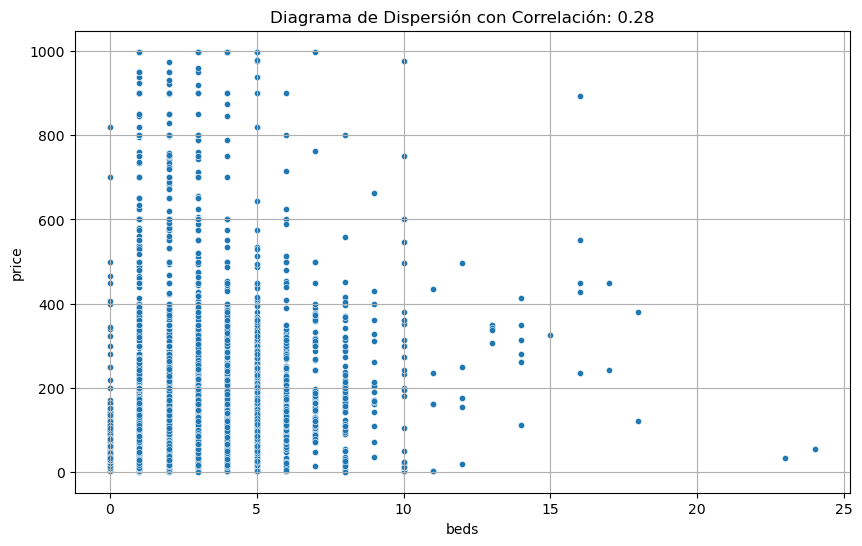

In [65]:
grafico_dispersion_con_correlacion(df,'beds','price',20, mostrar_correlacion=True)

In [66]:
# Paso la correlación (Kendal, según el tamaño de la muestra)
correlacion_numericas(df,'beds','price')

Correlación de Kendall: 0.36608440600751635
Valor p: 0.0


C:\Users\Alfonso\AppData\Local\Temp\ipykernel_11832\1990776667.py:4: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 18906.
  _, p1 = shapiro(df[var_num1])
C:\Users\Alfonso\AppData\Local\Temp\ipykernel_11832\1990776667.py:5: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 18906.
  _, p2 = shapiro(df[var_num2])


#### Precio vs accommodates

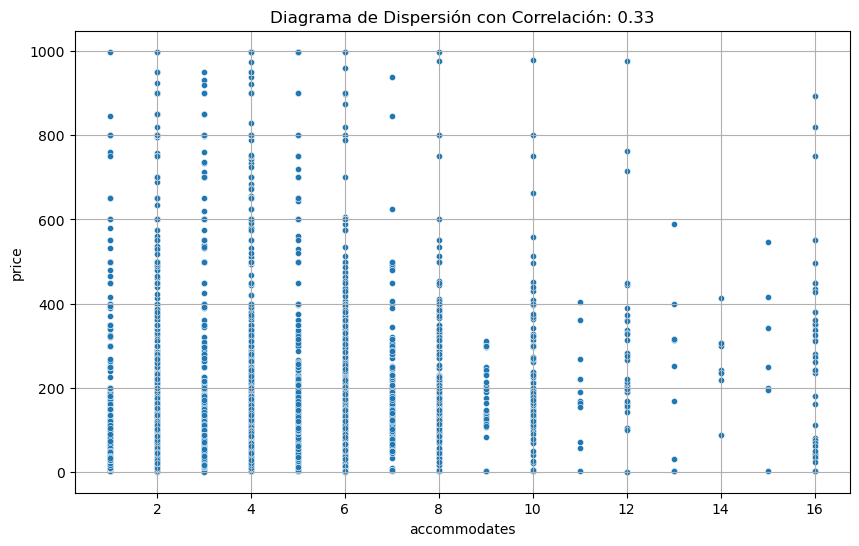

In [67]:
grafico_dispersion_con_correlacion(df,'accommodates','price',20, mostrar_correlacion=True)

In [68]:
# Paso la correlación (Kendal, según el tamaño de la muestra)
correlacion_numericas(df,'accommodates','price')

Correlación de Kendall: 0.47656508639859124
Valor p: 0.0


C:\Users\Alfonso\AppData\Local\Temp\ipykernel_11832\1990776667.py:4: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 18906.
  _, p1 = shapiro(df[var_num1])
C:\Users\Alfonso\AppData\Local\Temp\ipykernel_11832\1990776667.py:5: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 18906.
  _, p2 = shapiro(df[var_num2])


#### Precio vs número de reviews

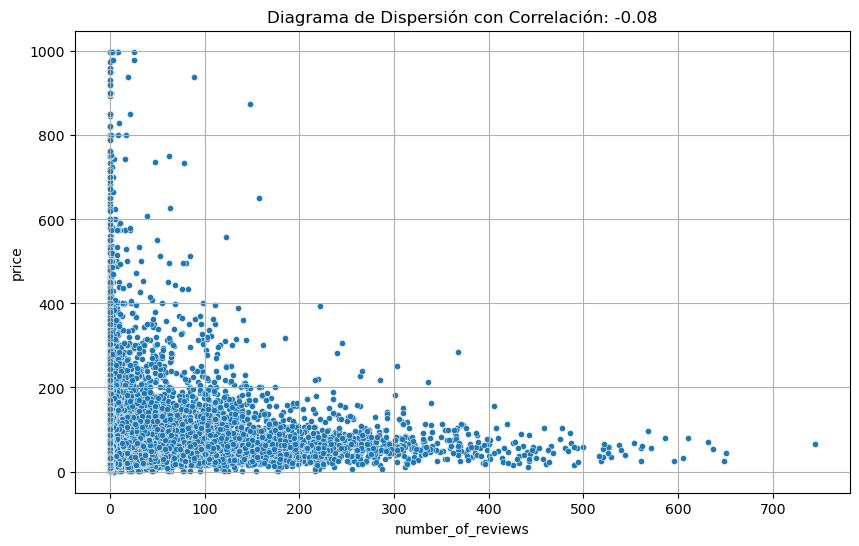

In [69]:
grafico_dispersion_con_correlacion(df,'number_of_reviews','price',20, mostrar_correlacion=True)

In [70]:
# Paso la correlación (Kendal, según el tamaño de la muestra)
correlacion_numericas(df,'number_of_reviews','price')

Correlación de Kendall: 0.005937643328813725
Valor p: 0.2399721796701536


C:\Users\Alfonso\AppData\Local\Temp\ipykernel_11832\1990776667.py:4: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 18906.
  _, p1 = shapiro(df[var_num1])
C:\Users\Alfonso\AppData\Local\Temp\ipykernel_11832\1990776667.py:5: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 18906.
  _, p2 = shapiro(df[var_num2])


#### Precio vs valoraciones


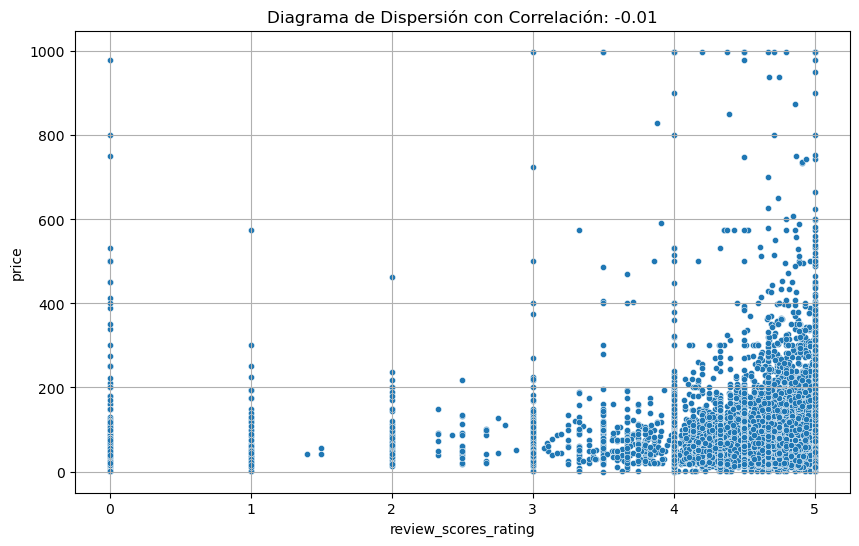

In [71]:
grafico_dispersion_con_correlacion(df,'review_scores_rating','price',20, mostrar_correlacion=True)

In [72]:
# Paso la correlación (Kendal, según el tamaño de la muestra)
correlacion_numericas(df,'review_scores_rating','price')

Correlación de Kendall: nan
Valor p: nan


C:\Users\Alfonso\AppData\Local\Temp\ipykernel_11832\1990776667.py:4: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 18906.
  _, p1 = shapiro(df[var_num1])
C:\Users\Alfonso\AppData\Local\Temp\ipykernel_11832\1990776667.py:5: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 18906.
  _, p2 = shapiro(df[var_num2])


____

## Análisis bivariable filtrando por casa (df_home, `Entire home/apt`)

### Variables categóricas

#### Precio discretizado por distrito

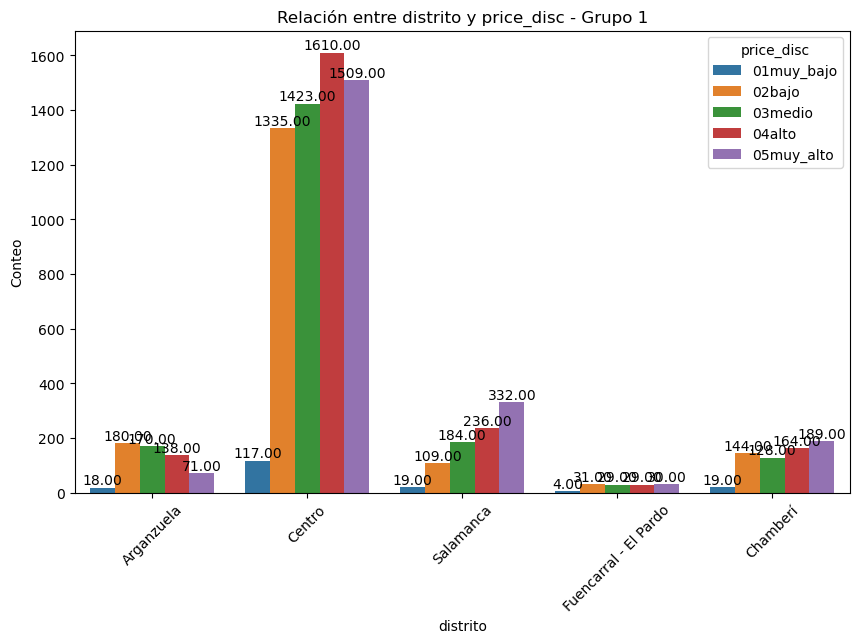

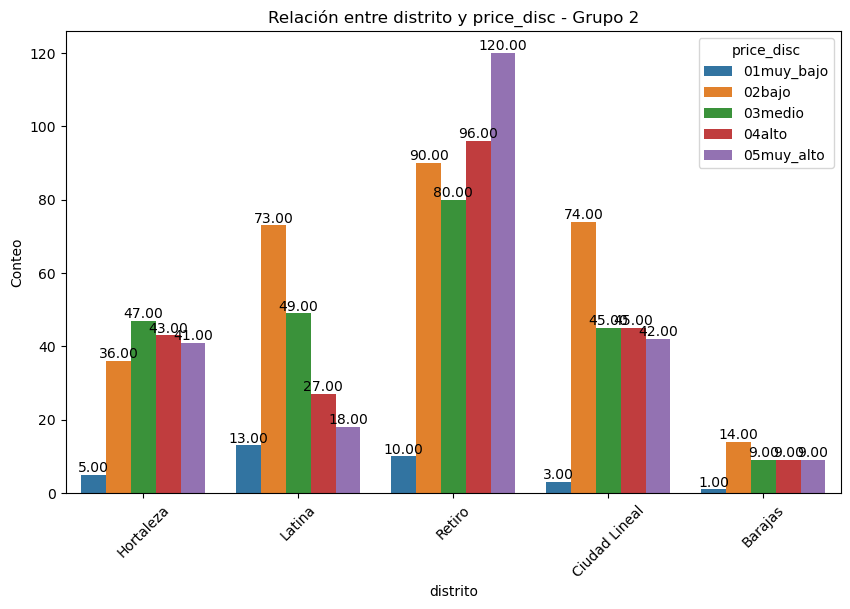

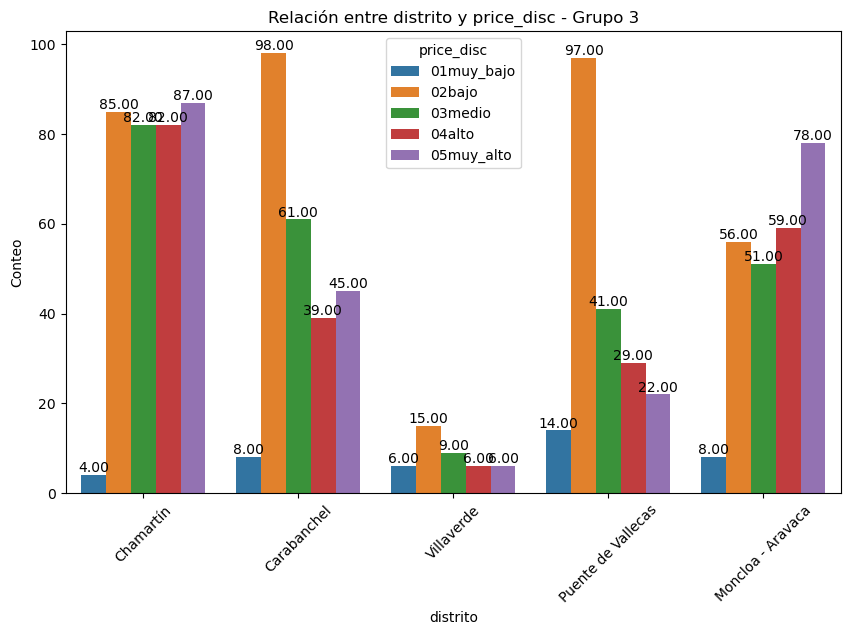

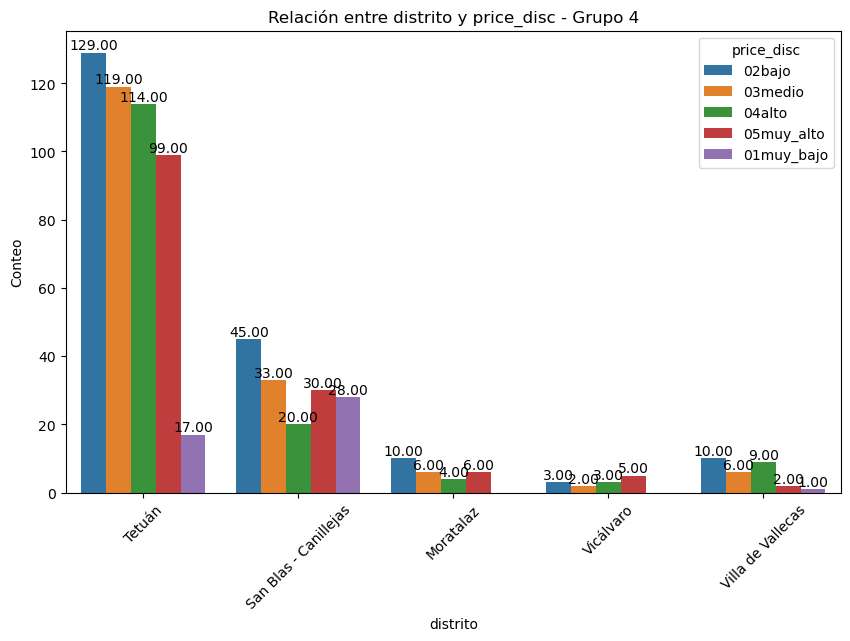

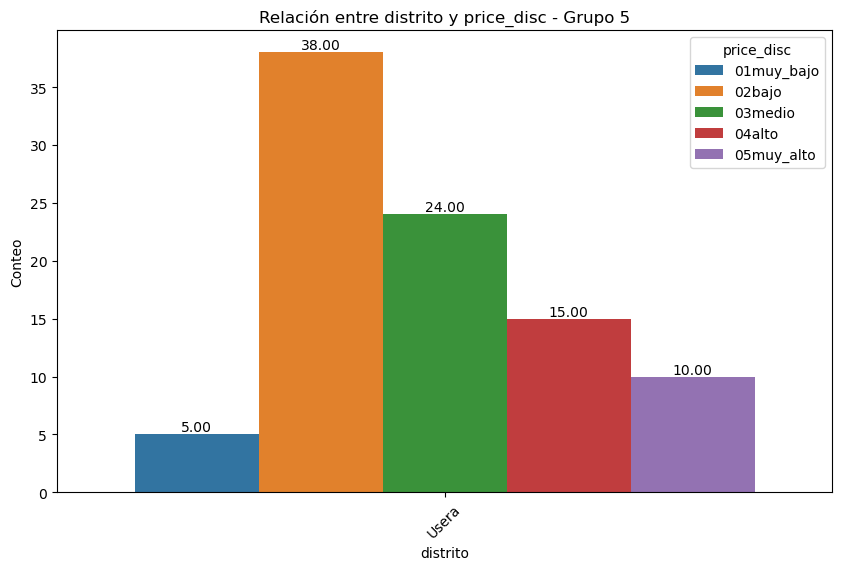

In [73]:
plot_categorical_relationship_fin(df_home,'distrito','price_disc',show_values=True)

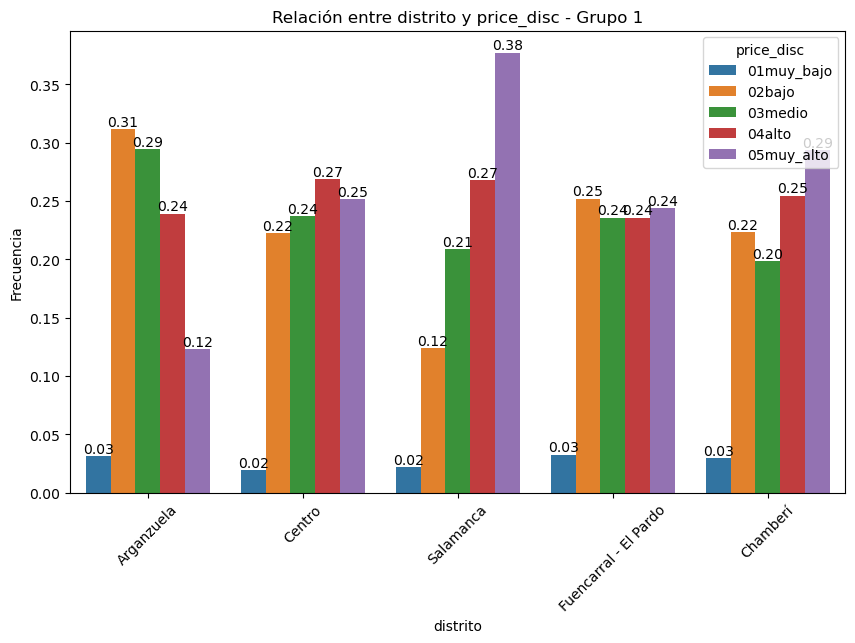

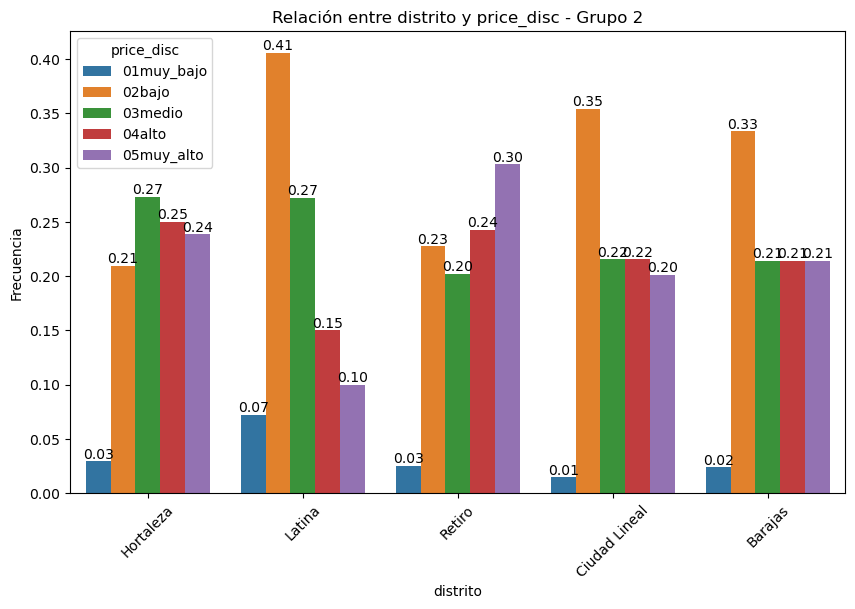

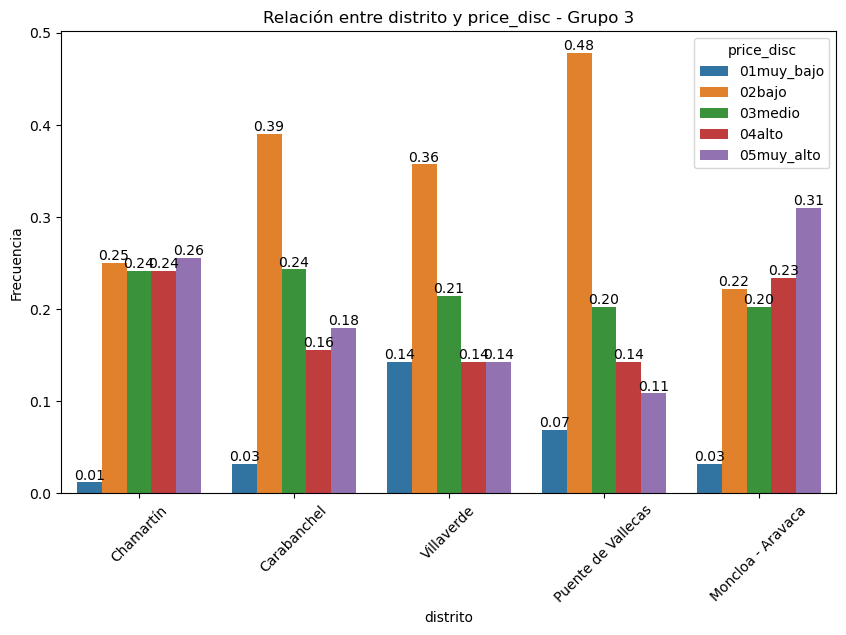

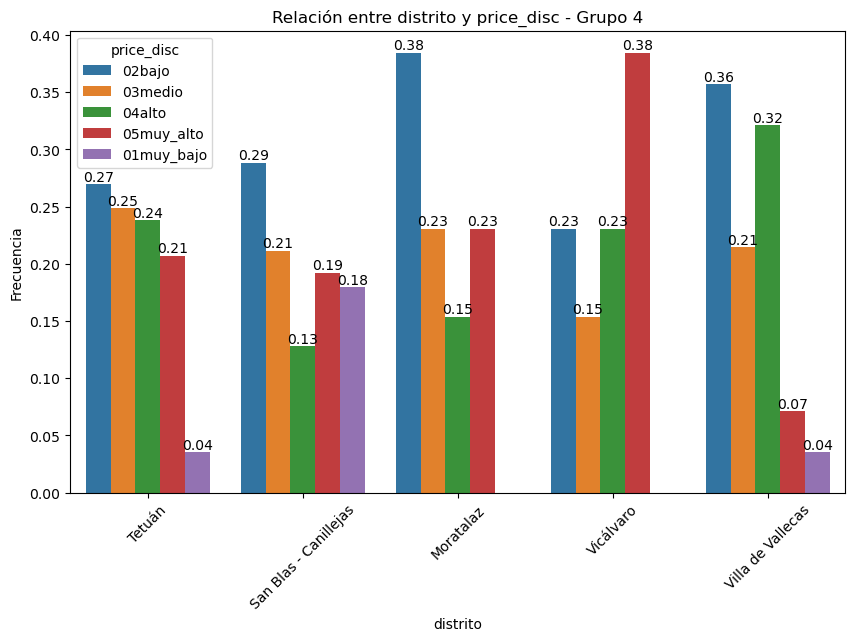

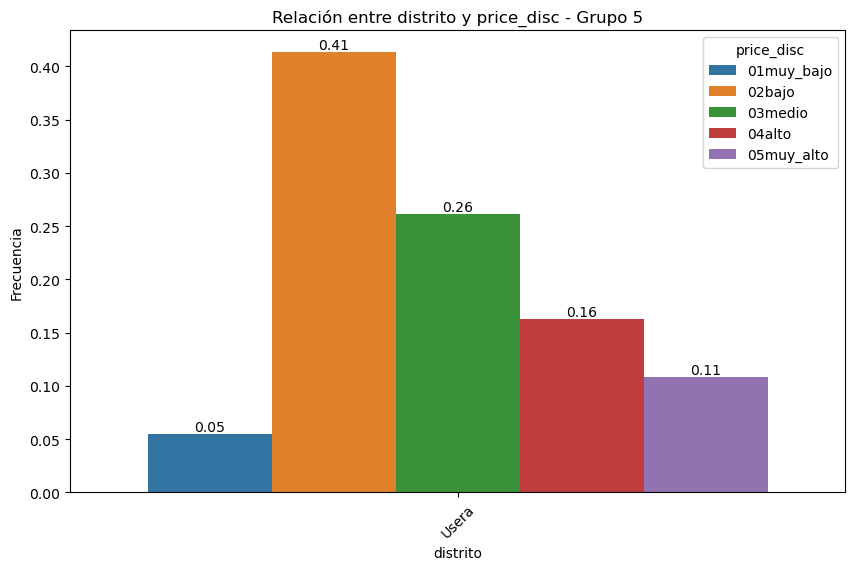

In [74]:
plot_categorical_relationship_fin(df_home,'distrito','price_disc',show_values=True,relative_freq=True)

In [75]:
correlacion_categoricas(df_home,'distrito','price_disc')

Valor Chi-Cuadrado: 646.1162625911727
P-Value: 2.0214490735466972e-89
Grados de Libertad: 80
Tabla de Frecuencias Esperadas:
 [[1.55974049e+01 1.38920887e+02 1.35073527e+02 1.44379978e+02
  1.43028203e+02]
 [1.13533970e+00 1.01120923e+01 9.83204181e+00 1.05094612e+01
  1.04110651e+01]
 [6.78500631e+00 6.04317895e+01 5.87581546e+01 6.28065417e+01
  6.22185078e+01]
 [1.62029194e+02 1.44314003e+03 1.40317282e+03 1.49985024e+03
  1.48580771e+03]
 [9.19084520e+00 8.18597946e+01 7.95927194e+01 8.50765904e+01
  8.42800505e+01]
 [1.74085421e+01 1.55052081e+02 1.50757974e+02 1.61145071e+02
  1.59636331e+02]
 [5.64966661e+00 5.03196972e+01 4.89261128e+01 5.22970806e+01
  5.18074428e+01]
 [3.32492341e+00 2.96139845e+01 2.87938367e+01 3.07777077e+01
  3.04895477e+01]
 [4.64948639e+00 4.14114255e+01 4.02645522e+01 4.30387457e+01
  4.26357902e+01]
 [4.86574158e+00 4.33375383e+01 4.21373220e+01 4.50405478e+01
  4.46188502e+01]
 [6.81203821e+00 6.06725536e+01 5.89922509e+01 6.30567670e+01
  6.24663903

#### Precio discretizado por propietario discretizado

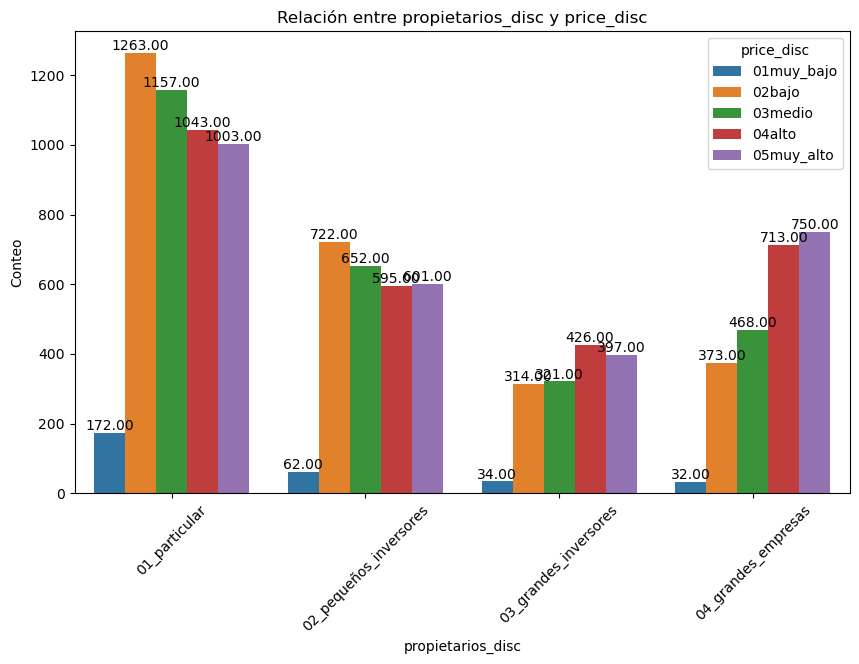

In [76]:
plot_categorical_relationship_fin(df_home,'propietarios_disc','price_disc',show_values=True)

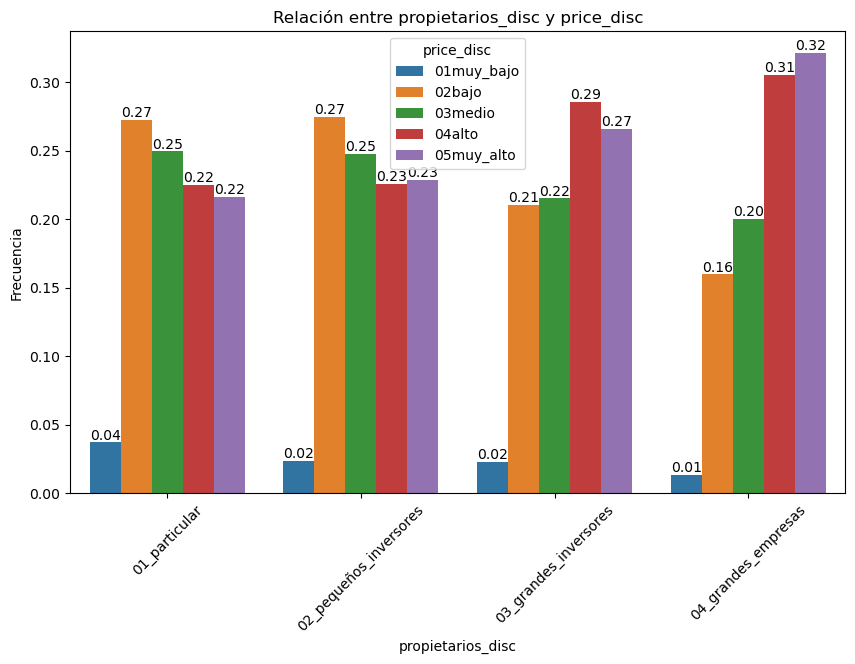

In [77]:
plot_categorical_relationship_fin(df_home,'propietarios_disc','price_disc',show_values=True,relative_freq=True)

In [78]:
correlacion_categoricas(df_home,'propietarios_disc','price_disc')

Valor Chi-Cuadrado: 285.20919100778235
P-Value: 5.949562679584618e-54
Grados de Libertad: 12
Tabla de Frecuencias Esperadas:
 [[ 125.37394125 1116.66390341 1085.73833123 1160.54478284 1149.67904127]
 [  71.14795459  633.69111552  616.14128672  658.59289962  652.42674356]
 [  40.33159128  359.22003965  349.27158046  373.33609659  369.84069202]
 [  63.14651289  562.42494143  546.84880159  584.52622094  579.05352316]]


#### Precio discretizado por huéspedes discretizado

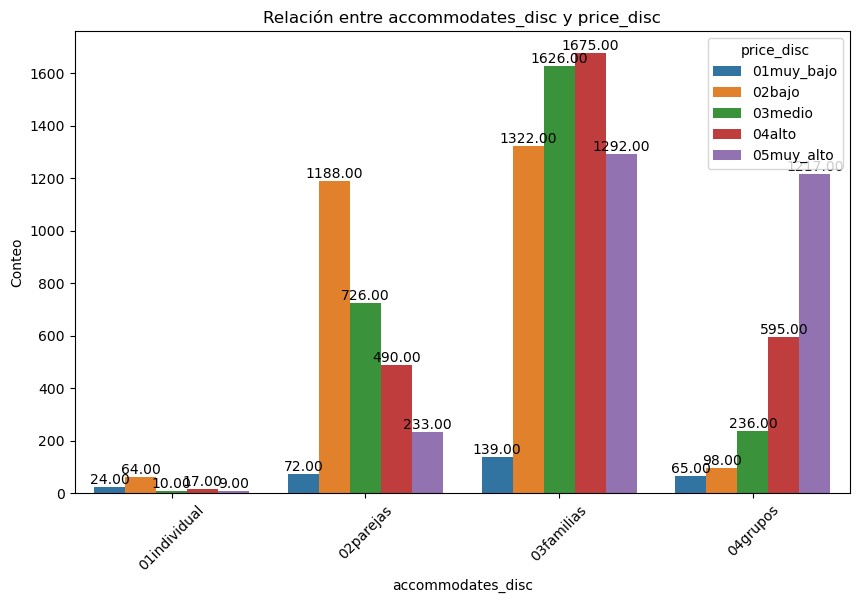

In [79]:
plot_categorical_relationship_fin(df_home,'accommodates_disc','price_disc',show_values=True)

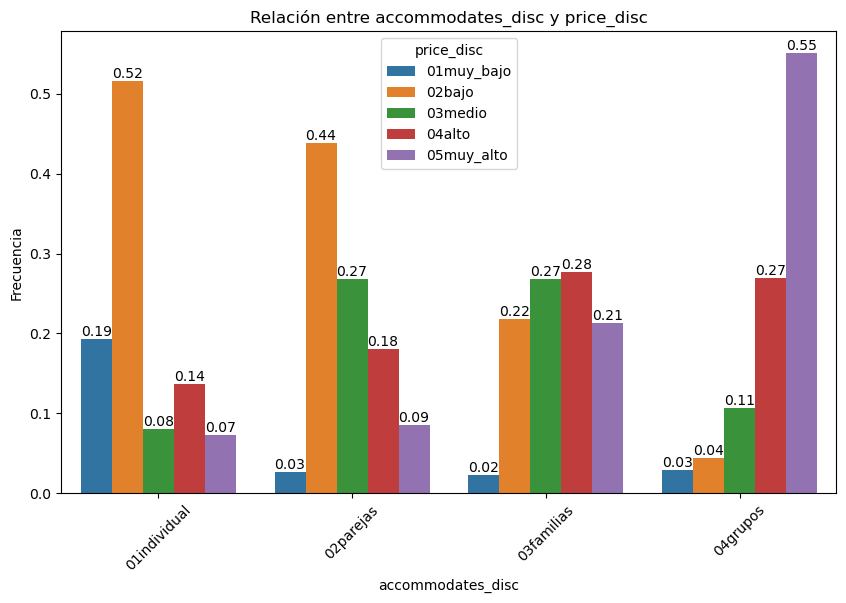

In [80]:
plot_categorical_relationship_fin(df_home,'accommodates_disc','price_disc',show_values=True,relative_freq=True)

In [81]:
correlacion_categoricas(df_home,'accommodates_disc','price_disc')

Valor Chi-Cuadrado: 2412.930263095838
P-Value: 0.0
Grados de Libertad: 12
Tabla de Frecuencias Esperadas:
 [[   3.35195531   29.8547486    29.02793296   31.02793296   30.73743017]
 [  73.2294107   652.22995134  634.1666967   677.86024509  671.51369616]
 [ 163.65110831 1457.58587133 1417.21859795 1514.86375924 1500.68066318]
 [  59.76752568  532.32942873  517.58677239  553.24806271  548.06821049]]


#### Precio discretizado por segmento de mercado

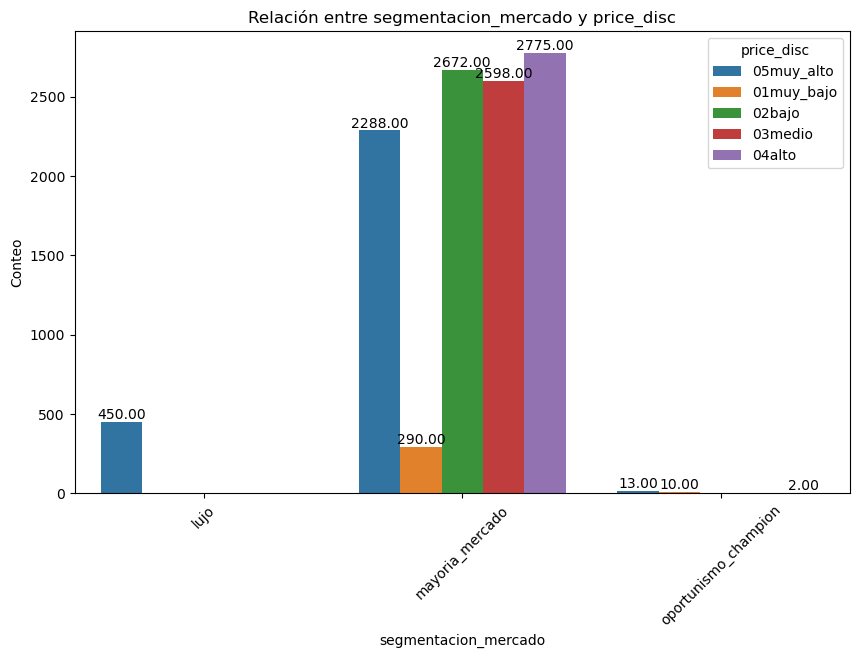

In [82]:
plot_categorical_relationship_fin(df_home,'segmentacion_mercado','price_disc',show_values=True)

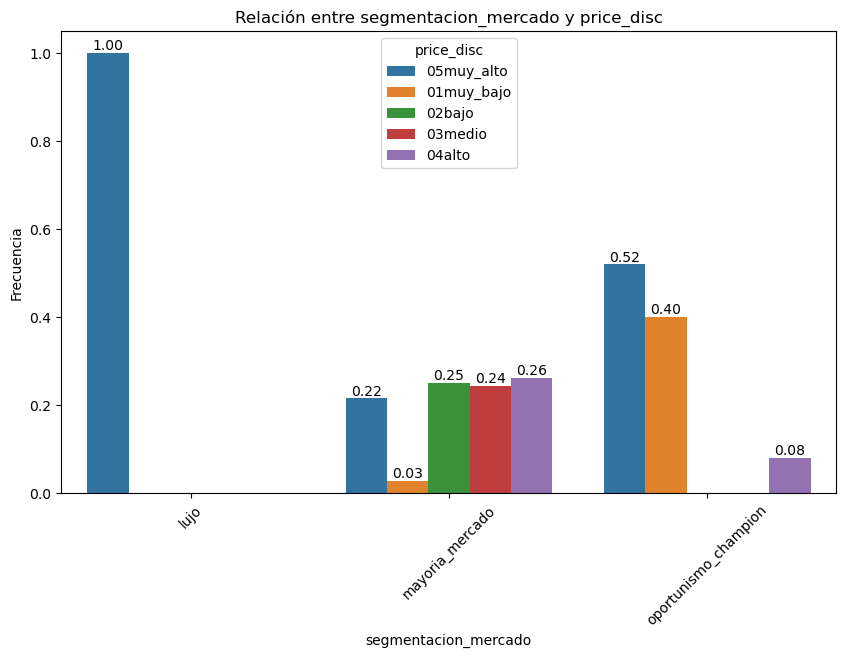

In [83]:
plot_categorical_relationship_fin(df_home,'segmentacion_mercado','price_disc',show_values=True,relative_freq=True)

In [84]:
correlacion_categoricas(df_home,'propietarios_disc','price_disc')

Valor Chi-Cuadrado: 285.20919100778235
P-Value: 5.949562679584618e-54
Grados de Libertad: 12
Tabla de Frecuencias Esperadas:
 [[ 125.37394125 1116.66390341 1085.73833123 1160.54478284 1149.67904127]
 [  71.14795459  633.69111552  616.14128672  658.59289962  652.42674356]
 [  40.33159128  359.22003965  349.27158046  373.33609659  369.84069202]
 [  63.14651289  562.42494143  546.84880159  584.52622094  579.05352316]]


### Variables combinadas

#### Precio por distrito (mediana)

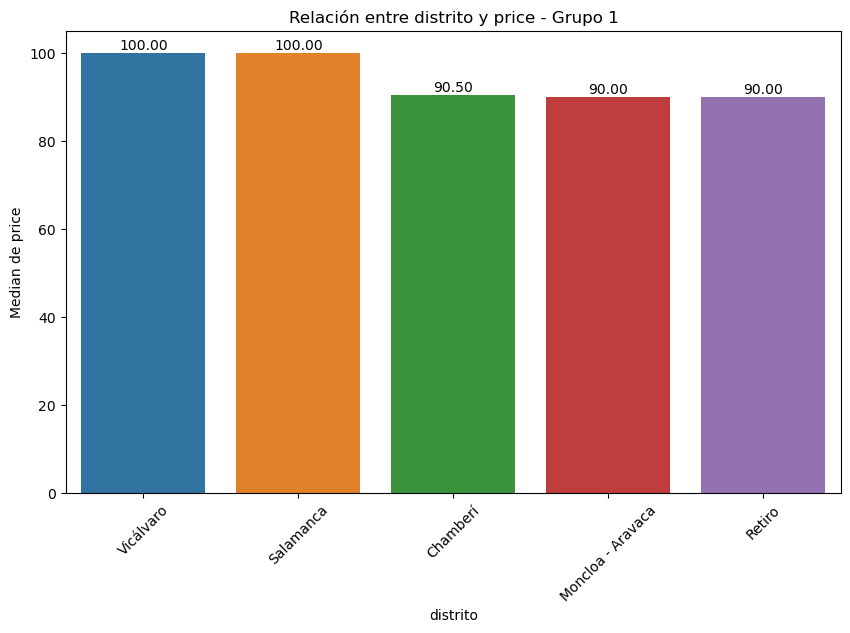

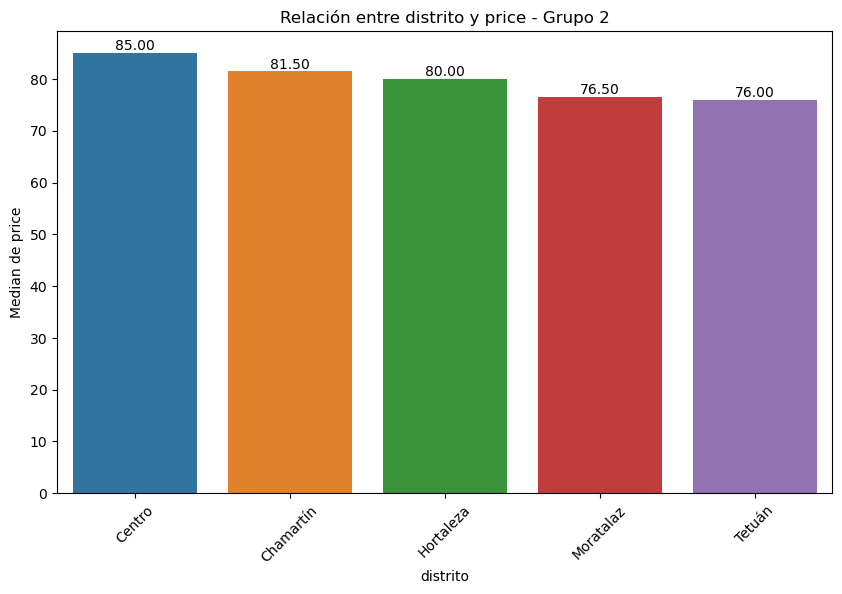

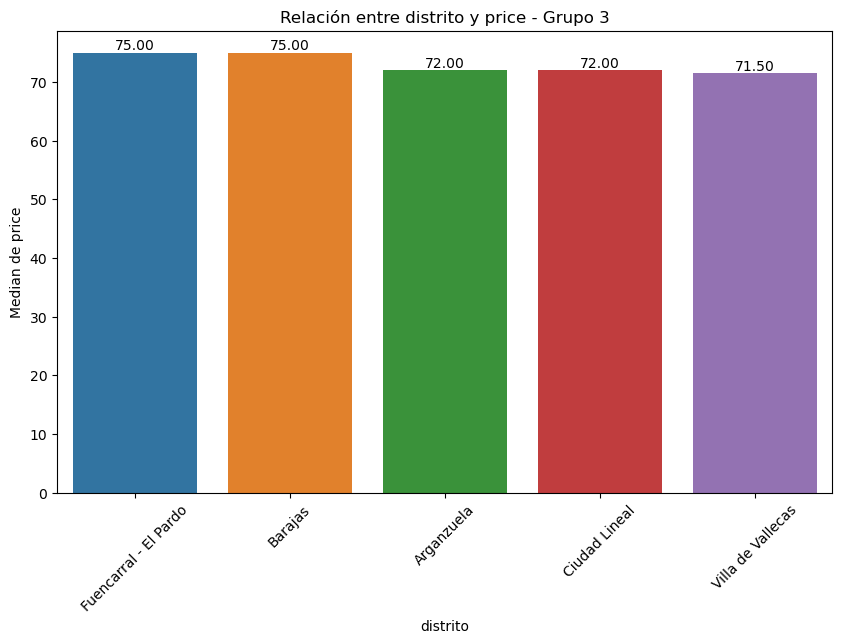

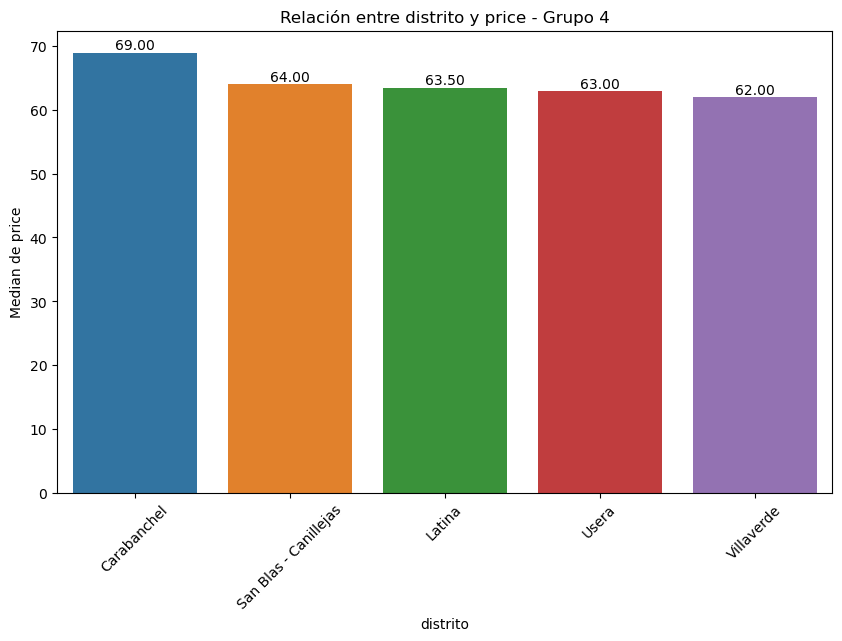

c:\Users\Alfonso\miniconda3\Lib\site-packages\seaborn\categorical.py:645: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  g_vals = grouped_vals.get_group(g)


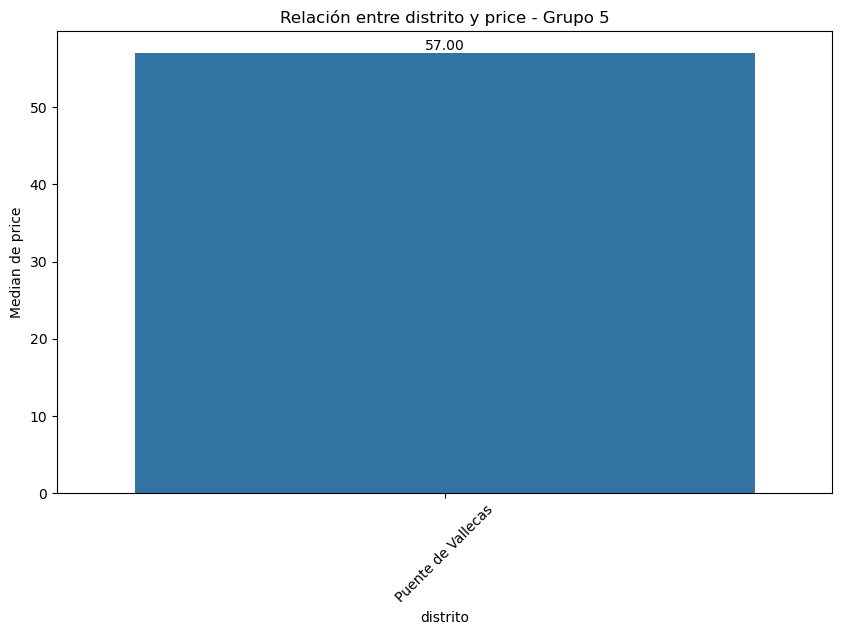

In [85]:
plot_categorical_numerical_relationship(df_home,'distrito','price', measure='median',show_values=True)

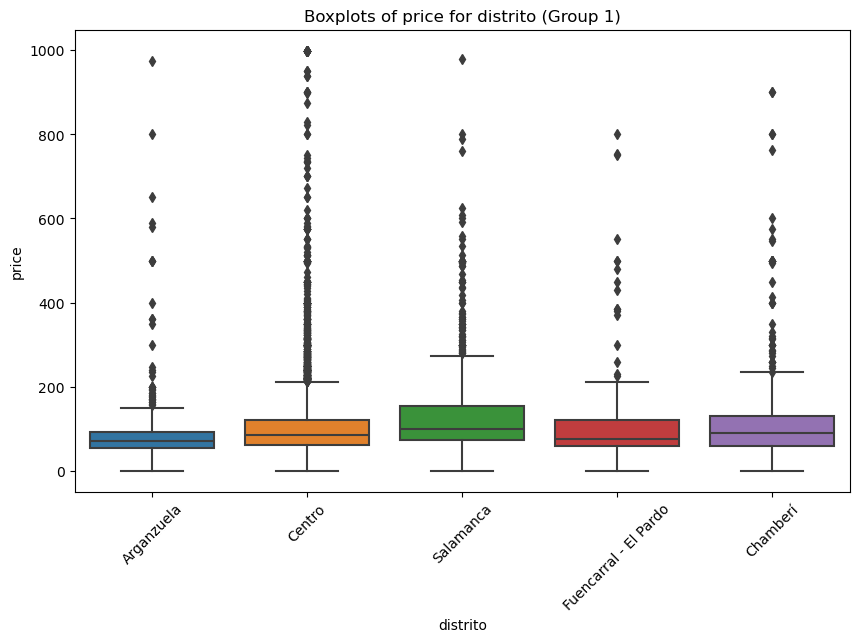

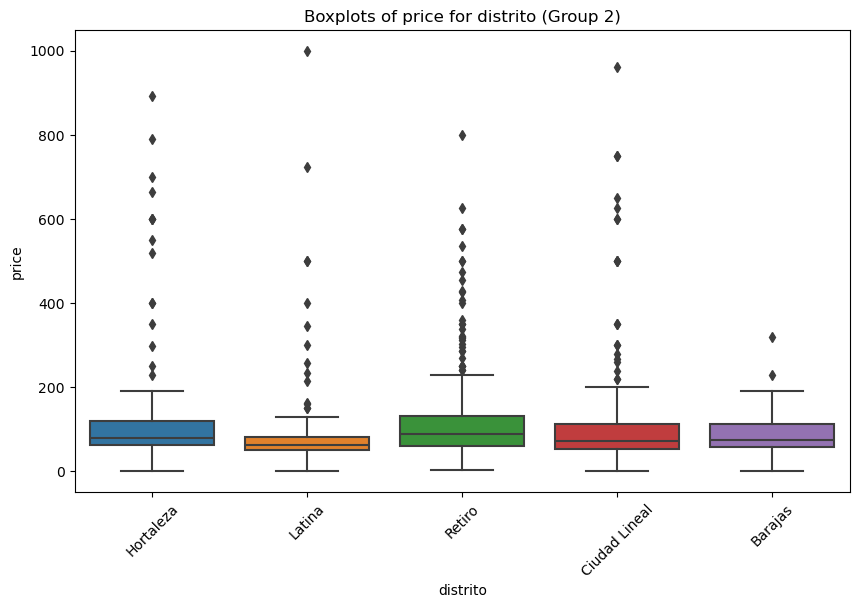

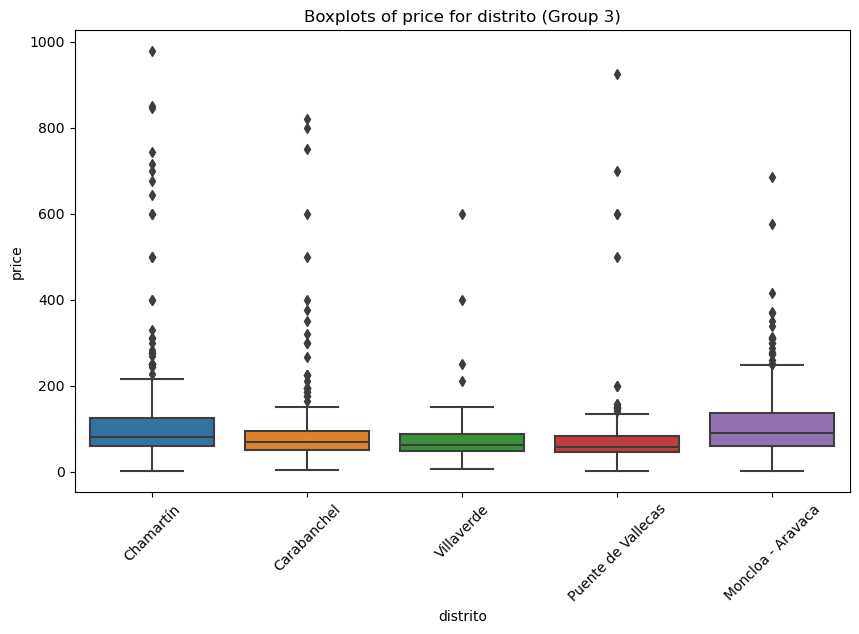

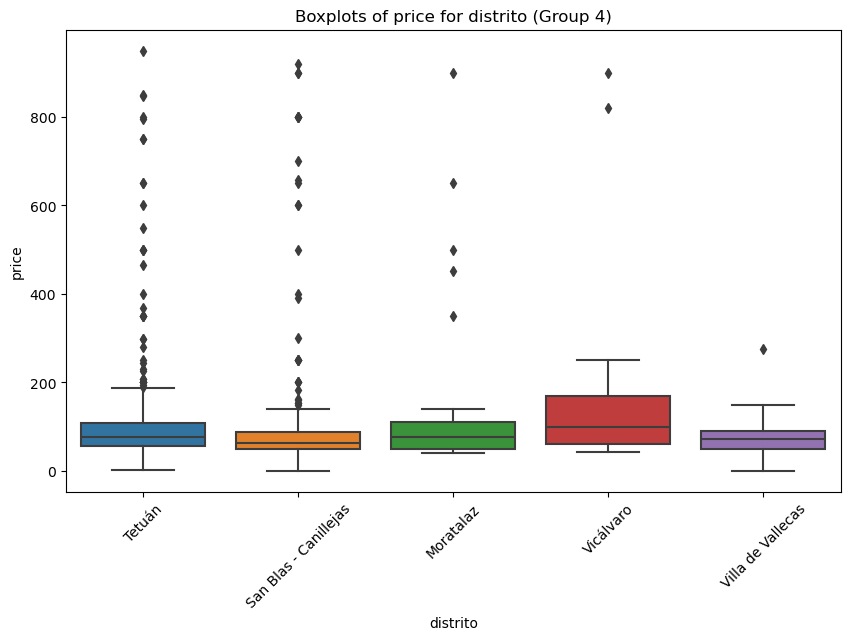

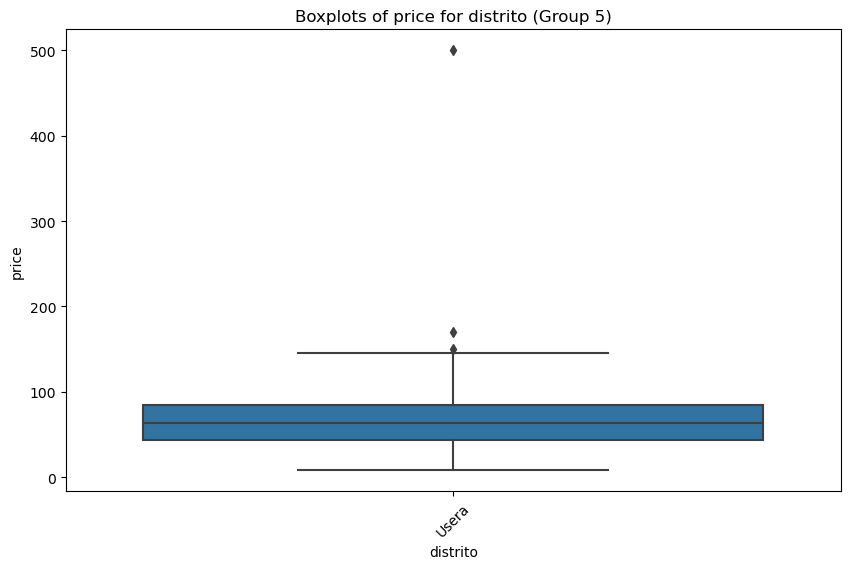

In [86]:
plot_grouped_boxplots(df_home,'distrito','price')

In [87]:
# Test de ANOVA
test_anova(df_home,'distrito','price')

Valor F: 8.051125395795623
Valor p: 7.531920356641207e-24


La prueba ANOVA da como resultado que hay diferencias significativas en al menos una de las medias.

In [88]:
test_tukey_hsd(df_home,'distrito','price')

c:\Users\Alfonso\miniconda3\Lib\site-packages\scipy\integrate\_quadpack_py.py:1272: IntegrationWarning: The integral is probably divergent, or slowly convergent.
  quad_r = quad(f, low, high, args=args, full_output=self.full_output,


                 Multiple Comparison of Means - Tukey HSD, FWER=0.05                  
        group1                group2         meandiff p-adj    lower    upper   reject
--------------------------------------------------------------------------------------
           Arganzuela               Barajas    6.5416    1.0  -54.3891  67.4724  False
           Arganzuela           Carabanchel    8.8038    1.0  -20.0229  37.6304  False
           Arganzuela                Centro   23.0982 0.0001    6.4804   39.716   True
           Arganzuela             Chamartín   33.3859 0.0009    7.3207  59.4511   True
           Arganzuela              Chamberí   30.1933 0.0002    8.3393  52.0473   True
           Arganzuela         Ciudad Lineal   26.9692 0.1814   -3.8098  57.7481  False
           Arganzuela Fuencarral - El Pardo   44.7938 0.0043     6.931  82.6565   True
           Arganzuela             Hortaleza   35.3552 0.0217     2.235  68.4754   True
           Arganzuela                Latina

#### Precio por tipo de oferta (mediana)

c:\Users\Alfonso\miniconda3\Lib\site-packages\seaborn\categorical.py:645: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  g_vals = grouped_vals.get_group(g)


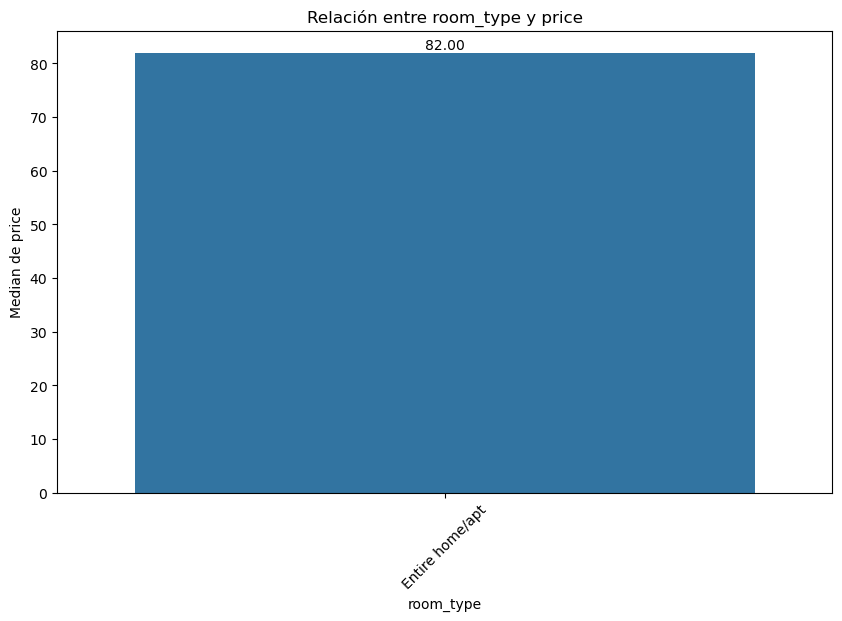

In [89]:
plot_categorical_numerical_relationship(df_home,'room_type','price', measure='median',show_values=True)

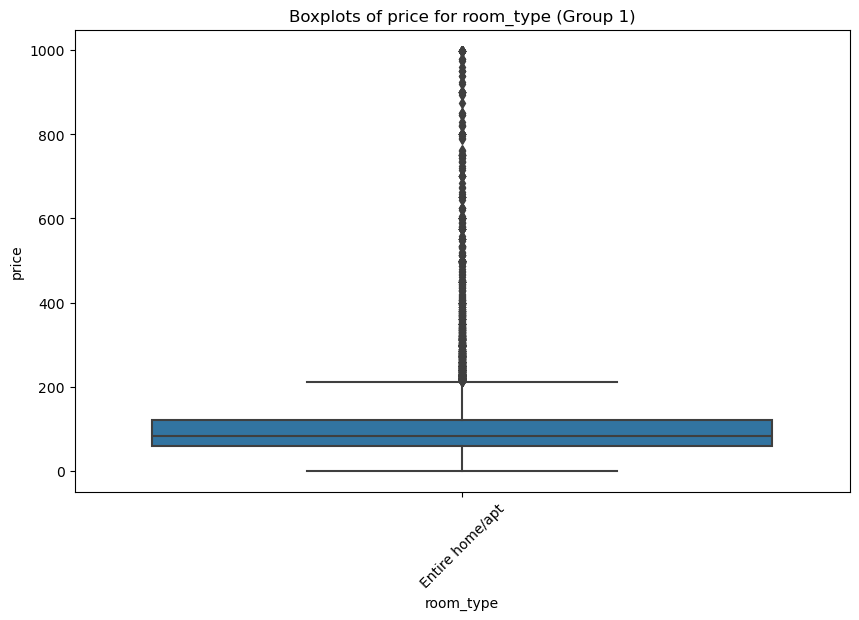

In [90]:
plot_grouped_boxplots(df_home,'room_type','price')

#### Precio por huéspedes_discretizado (mediana)

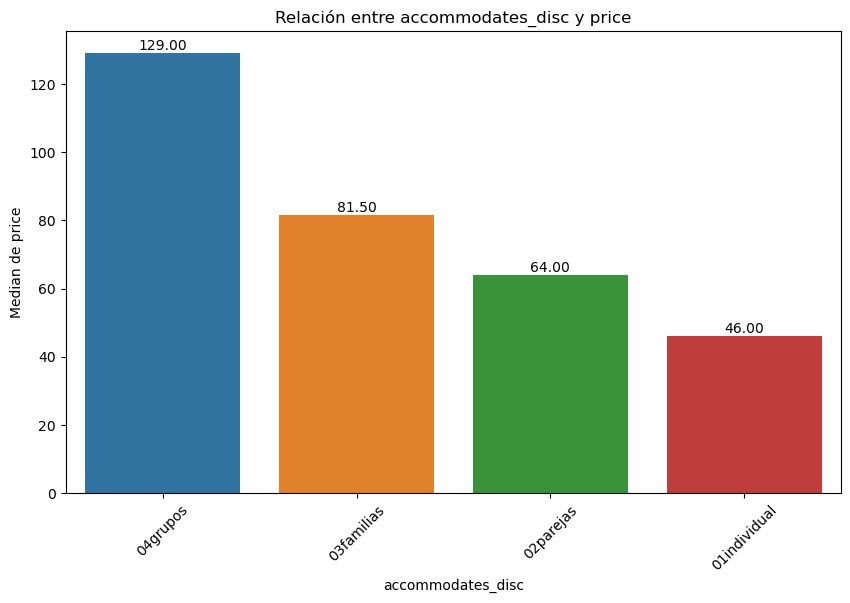

In [91]:
plot_categorical_numerical_relationship(df_home,'accommodates_disc','price', measure='median',show_values=True)

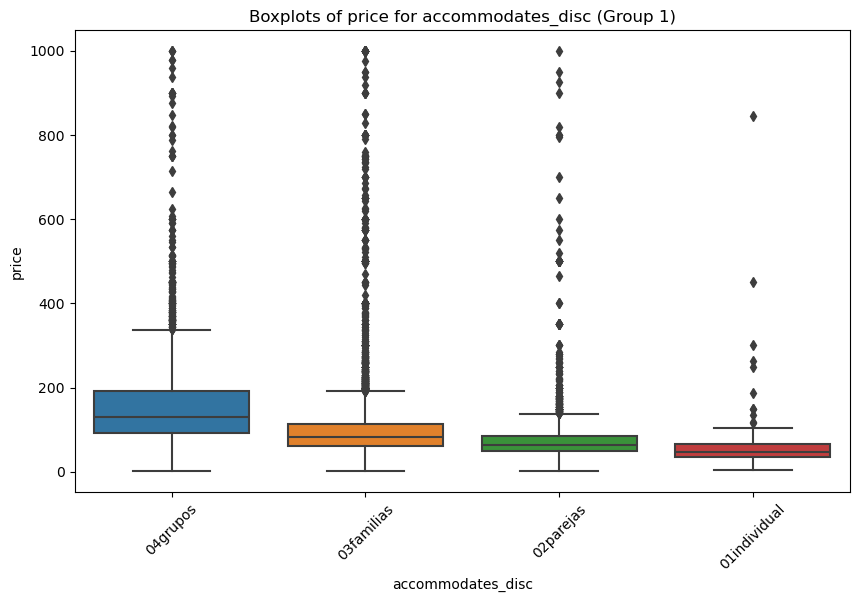

In [92]:
plot_grouped_boxplots(df_home,'accommodates_disc','price')

In [93]:
# Test ANOVA
test_anova(df_home,'accommodates','price')

Valor F: 80.09907076735581
Valor p: 6.358434296338124e-234


In [94]:
# Test de Tukey
test_tukey_hsd(df_home,'accommodates','price')

  Multiple Comparison of Means - Tukey HSD, FWER=0.05  
group1 group2 meandiff p-adj    lower    upper   reject
-------------------------------------------------------
     1      2   10.076 0.9995  -22.0703  42.2222  False
     1      3  22.4529 0.5908  -10.3797  55.2855  False
     1      4    40.83 0.0013    8.9001  72.7599   True
     1      5  65.2721    0.0   31.4425  99.1016   True
     1      6  76.8188    0.0   44.0736  109.564   True
     1      7  98.7798    0.0    58.957 138.6027   True
     1      8 115.2735    0.0   77.9923 152.5547   True
     1      9 112.3411    0.0   43.7758 180.9063   True
     1     10 159.2748    0.0  112.0961 206.4535   True
     1     11 116.8358 0.0147   11.0103 222.6612   True
     1     12  221.199    0.0  155.6263 286.7718   True
     1     13 186.8309 0.0001    59.142 314.5198   True
     1     14 192.2441    0.0   71.4027 313.0855   True
     1     15 210.3276    0.0   74.3404 346.3147   True
     1     16 217.7371    0.0  153.4724 282.0019

#### Precio por propietarios_disc (median)

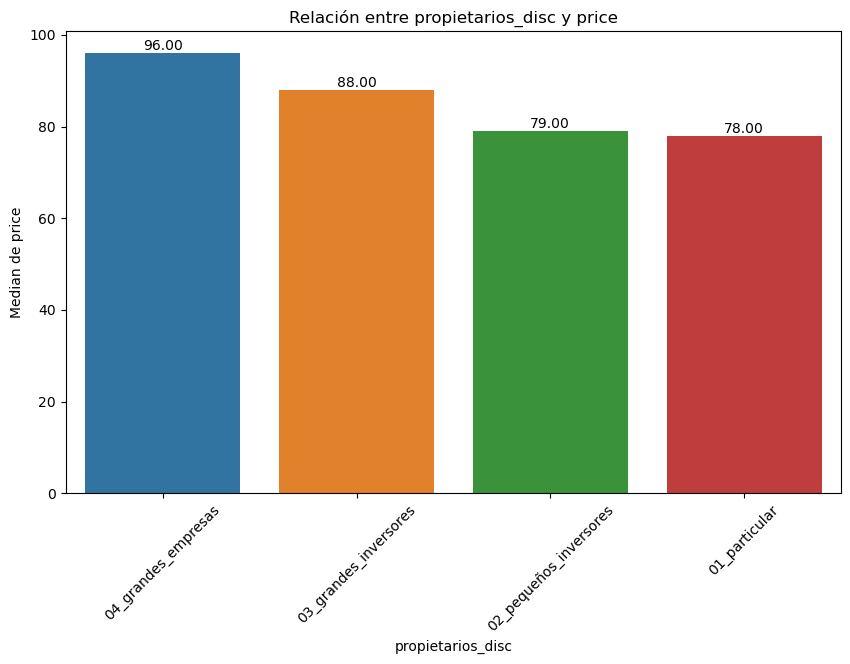

In [95]:
plot_categorical_numerical_relationship(df_home,'propietarios_disc','price', measure='median',show_values=True)

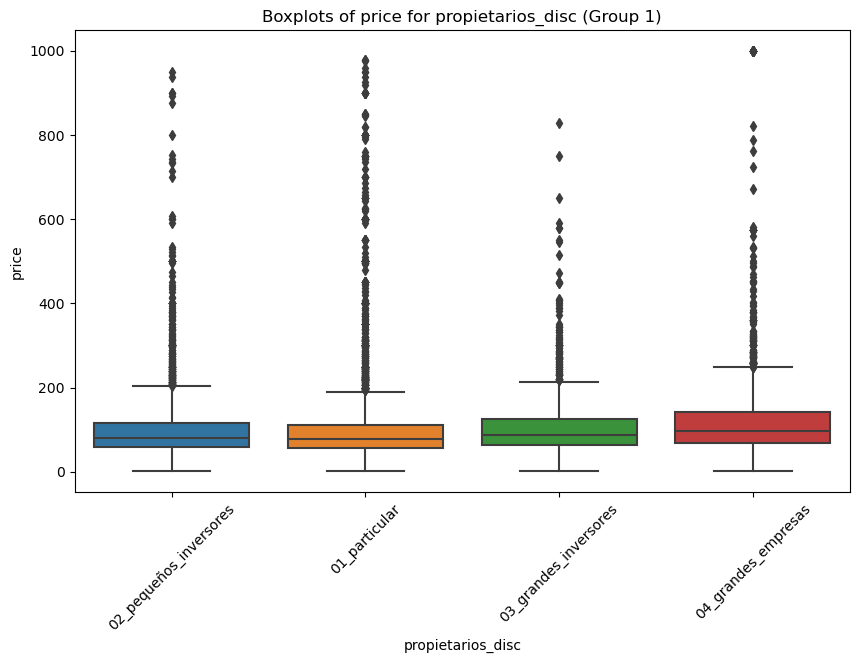

In [96]:
plot_grouped_boxplots(df_home,'propietarios_disc','price')

In [97]:
# Test ANOVA
test_anova(df_home,'propietarios_disc','price')

Valor F: 18.812736879840987
Valor p: 3.6292704251963906e-12


In [98]:
# Test de Tukey
test_tukey_hsd(df_home,'propietarios_disc','price')

                 Multiple Comparison of Means - Tukey HSD, FWER=0.05                 
        group1                 group2         meandiff p-adj   lower    upper  reject
-------------------------------------------------------------------------------------
         01_particular 02_pequeños_inversores  -7.4836  0.022 -14.2062  -0.761   True
         01_particular  03_grandes_inversores  -4.7974 0.4354 -12.9963  3.4016  False
         01_particular    04_grandes_empresas  14.1929    0.0   7.2038 21.1819   True
02_pequeños_inversores  03_grandes_inversores   2.6862 0.8666  -6.2409 11.6133  False
02_pequeños_inversores    04_grandes_empresas  21.6765    0.0   13.846  29.507   True
 03_grandes_inversores    04_grandes_empresas  18.9903    0.0   9.8608 28.1197   True
-------------------------------------------------------------------------------------


#### Oferta vs precio_m2

c:\Users\Alfonso\miniconda3\Lib\site-packages\seaborn\categorical.py:645: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  g_vals = grouped_vals.get_group(g)


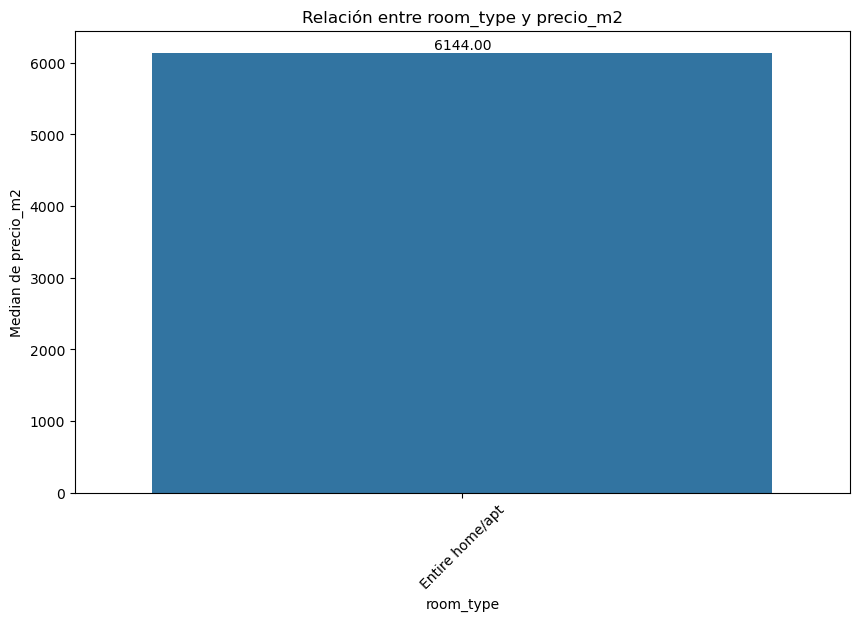

In [99]:
plot_categorical_numerical_relationship(df_home,'room_type','precio_m2', measure='median',show_values=True)

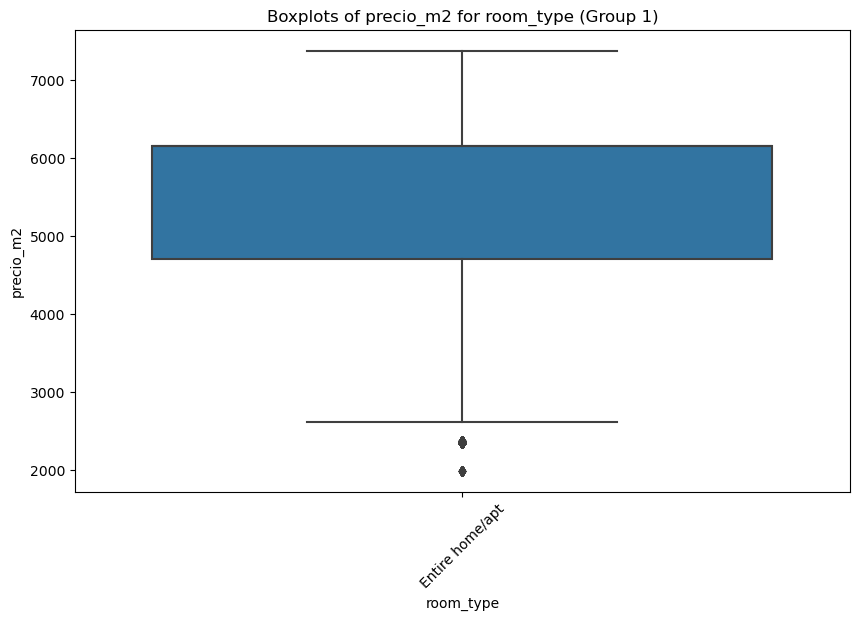

In [100]:
plot_grouped_boxplots(df_home,'room_type','precio_m2')

### Variables numéricas

#### Heatmap

In [206]:
columnas_temp = df_home.select_dtypes(include=['int', 'float']).columns
columnas_temp

Index(['id', 'host_id', 'host_listings_count', 'latitude', 'longitude',
       'accommodates', 'bedrooms', 'beds', 'price', 'minimum_nights',
       'maximum_nights', 'number_of_reviews', 'review_scores_rating',
       'calculated_host_listings_count', 'bathrooms', 'precio_m2',
       'price_accommodates', 'price_bedrooms', 'antiguedad_host', 'sup_m2_est',
       'precio_est', 'price_x_sup'],
      dtype='object')

In [203]:
columnas_numericas = [ 'latitude', 'longitude','accommodates', 'bedrooms', 'beds', 'price', 'minimum_nights',
       'number_of_reviews', 'review_scores_rating',
       'bathrooms', 'precio_m2',
       'price_accommodates', 'price_bedrooms', 'antiguedad_host','sup_m2_est','precio_est', 'price_x_sup']

In [204]:
corr_matrix = df_home[columnas_numericas].corr()
corr_matrix

,latitude,longitude,accommodates,bedrooms,beds,price,minimum_nights,number_of_reviews,review_scores_rating,bathrooms,precio_m2,price_accommodates,price_bedrooms,antiguedad_host,sup_m2_est,precio_est,price_x_sup
latitude,1.000000,0.259760,-0.013874,0.019598,0.011263,0.067318,0.030086,-0.096003,-0.015282,0.064716,0.099820,0.084178,0.067666,-0.019450,0.022174,0.076600,0.065474
longitude,0.259760,1.000000,0.002315,0.031928,0.010004,0.032895,-0.000042,-0.062798,0.002207,0.037704,-0.162178,0.034632,0.031888,-0.031457,0.026921,-0.077256,0.027578
accommodates,-0.013874,0.002315,1.000000,0.743809,0.786323,0.309784,-0.037869,0.025662,0.011889,0.581570,-0.000622,-0.173875,-0.146741,-0.026371,0.742190,0.600053,0.078021
bedrooms,0.019598,0.031928,0.743809,1.000000,0.770127,0.319040,-0.000140,-0.028519,0.021725,0.636074,-0.046520,-0.056905,-0.138706,0.009527,0.989564,0.757722,0.011924
beds,0.011263,0.010004,0.786323,0.770127,1.000000,0.288442,-0.024805,0.016064,0.016769,0.529290,-0.017665,-0.102250,-0.247161,-0.007108,0.762739,0.601522,0.044079
price,0.067318,0.032895,0.309784,0.319040,0.288442,1.000000,-0.008115,-0.118037,-0.009961,0.342065,0.062726,0.774976,0.708926,-0.012973,0.319758,0.302372,0.920692
minimum_nights,0.030086,-0.000042,-0.037869,-0.000140,-0.024805,-0.008115,1.000000,-0.041209,-0.011321,0.005086,0.002118,0.022619,0.022898,0.036739,-0.001023,-0.000590,-0.002149
number_of_reviews,-0.096003,-0.062798,0.025662,-0.028519,0.016064,-0.118037,-0.041209,1.000000,0.118302,-0.047732,0.085779,-0.133967,-0.120805,0.252102,-0.026294,0.031388,-0.122203
review_scores_rating,-0.015282,0.002207,0.011889,0.021725,0.016769,-0.009961,-0.011321,0.118302,1.000000,0.056742,0.002992,-0.015616,-0.034044,0.082389,0.022422,0.022576,-0.027953
bathrooms,0.064716,0.037704,0.581570,0.636074,0.529290,0.342065,0.005086,-0.047732,0.056742,1.000000,0.067340,0.020160,-0.020416,0.009467,0.634643,0.565078,0.118193


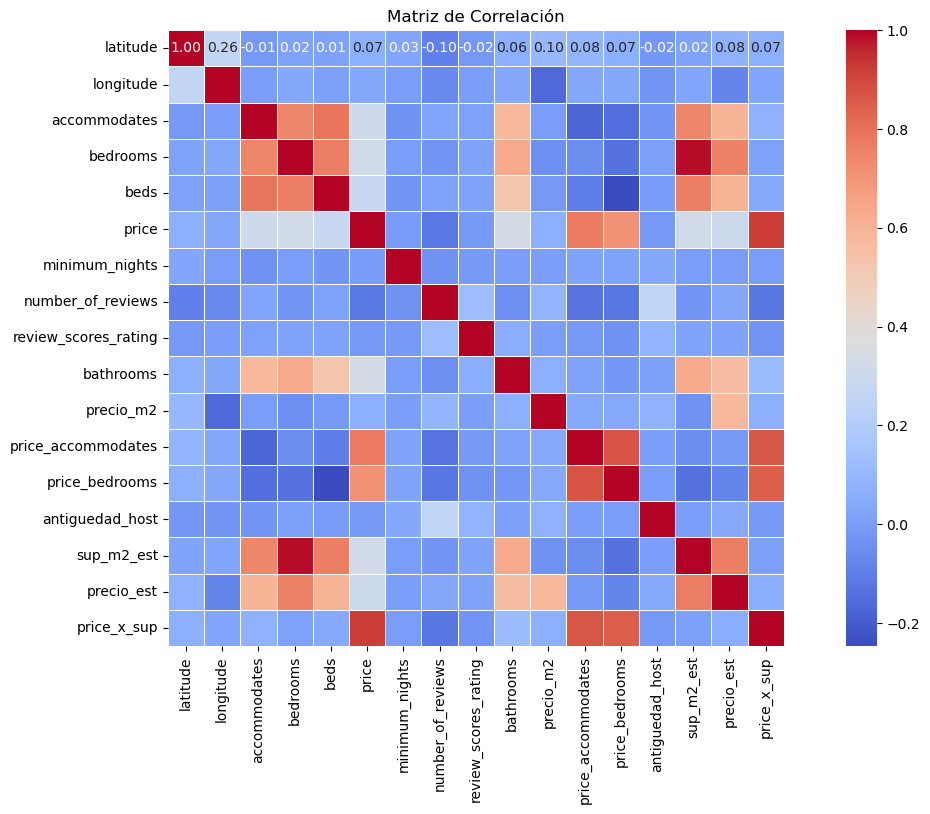

In [205]:
plt.figure(figsize=(16, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm',fmt=".2f", cbar=True, square=True, linewidths=.5)
plt.title('Matriz de Correlación')
plt.xticks(fontsize=10)  
plt.yticks(fontsize=10) 

plt.show()

- La variable price solo está relacionada con aquellas variables en las que se han utilizado para obtener las mismas.
- Las variables está relacionadas de forma positiva:
    - accommodates 
    - bedrooms
    - beds
    - sup_m2_est
    - bathrooms (en menor medida)
    - precio_est (en menor medida)

- El precio no parece tener ningún tipo de relación con ninguna variable, por lo tanto es algo subjetivo, una especie de convención acordada entre las personas en cuanto a qué darle valor y cuánto valor.

#### Precio por precio_m2

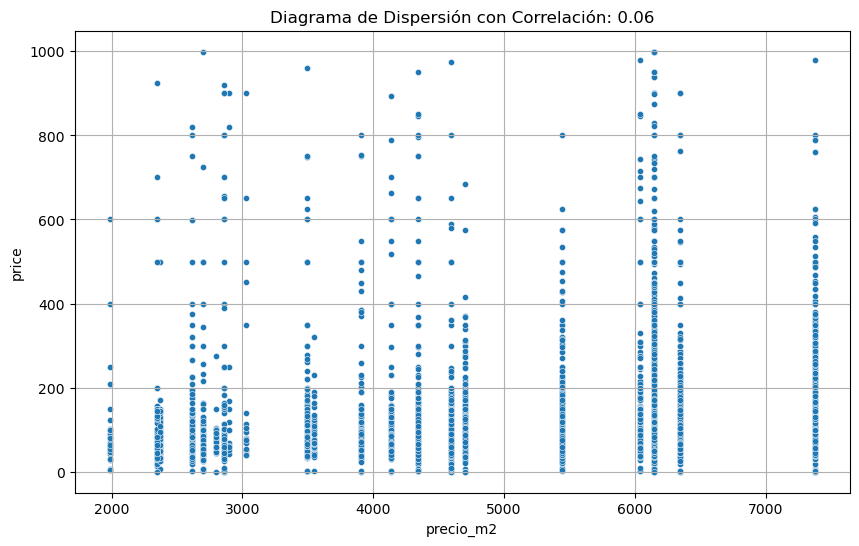

In [105]:
grafico_dispersion_con_correlacion(df_home,'precio_m2','price',20, mostrar_correlacion=True)

In [106]:
# Paso la correlación (Kendal, según el tamaño de la muestra)
correlacion_numericas(df_home,'precio_m2','price')

Correlación de Kendall: 0.124438920584773
Valor p: 3.154560279678157e-70


C:\Users\Alfonso\AppData\Local\Temp\ipykernel_11832\1990776667.py:4: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11098.
  _, p1 = shapiro(df[var_num1])
C:\Users\Alfonso\AppData\Local\Temp\ipykernel_11832\1990776667.py:5: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11098.
  _, p2 = shapiro(df[var_num2])


#### Precio vs habitaciones

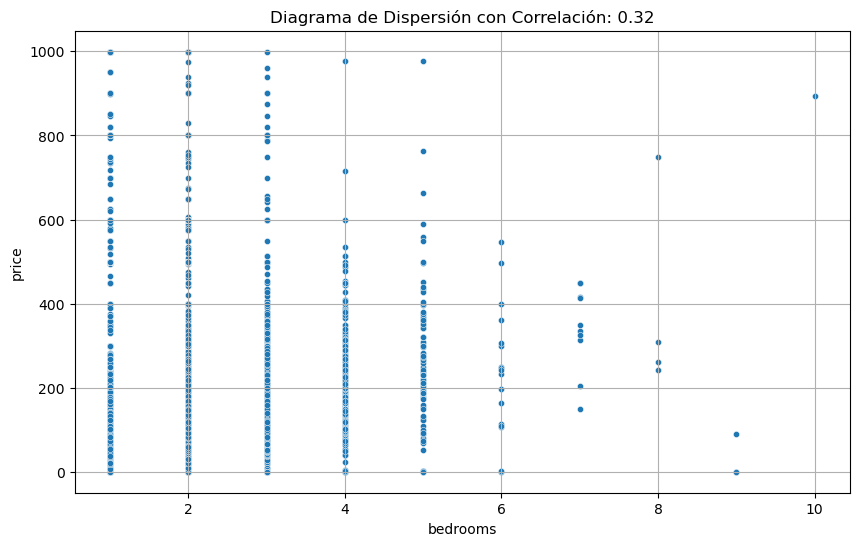

In [107]:
grafico_dispersion_con_correlacion(df_home,'bedrooms','price',20, mostrar_correlacion=True)

In [108]:
# Paso la correlación (Kendal, según el tamaño de la muestra)
correlacion_numericas(df_home,'bedrooms','price')

Correlación de Kendall: 0.34097215380187396
Valor p: 0.0


C:\Users\Alfonso\AppData\Local\Temp\ipykernel_11832\1990776667.py:4: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11098.
  _, p1 = shapiro(df[var_num1])
C:\Users\Alfonso\AppData\Local\Temp\ipykernel_11832\1990776667.py:5: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11098.
  _, p2 = shapiro(df[var_num2])


#### Precio vs camas

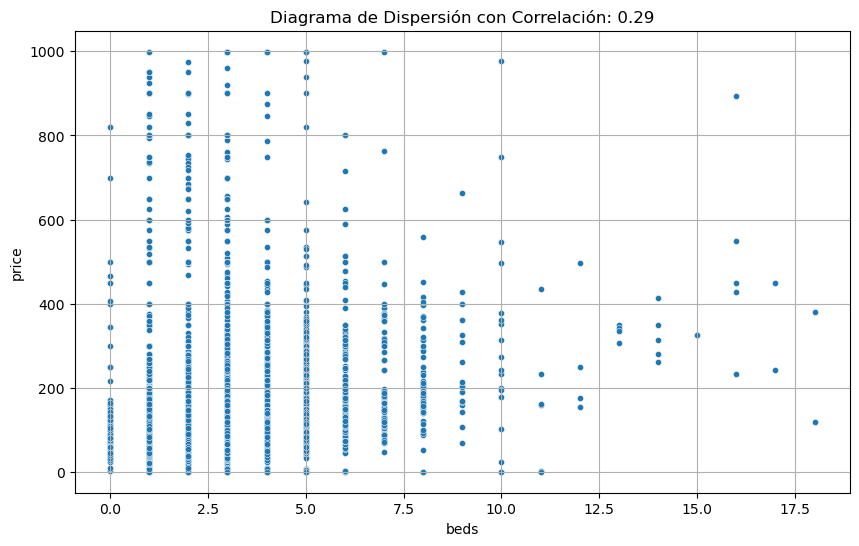

In [109]:
grafico_dispersion_con_correlacion(df_home,'beds','price',20, mostrar_correlacion=True)

In [110]:
# Paso la correlación (Kendal, según el tamaño de la muestra)
correlacion_numericas(df_home,'beds','price')

Correlación de Kendall: 0.29565452943568654
Valor p: 0.0


C:\Users\Alfonso\AppData\Local\Temp\ipykernel_11832\1990776667.py:4: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11098.
  _, p1 = shapiro(df[var_num1])
C:\Users\Alfonso\AppData\Local\Temp\ipykernel_11832\1990776667.py:5: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11098.
  _, p2 = shapiro(df[var_num2])


#### Precio vs accommodates

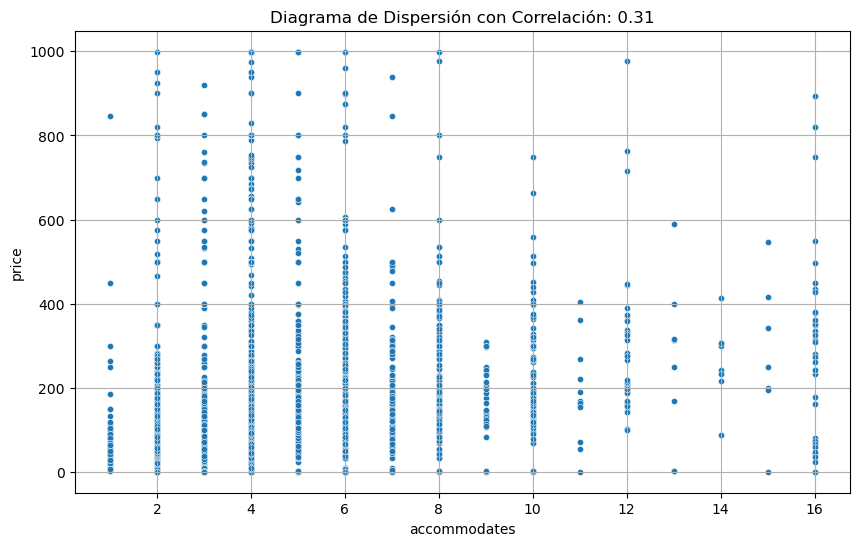

In [111]:
grafico_dispersion_con_correlacion(df_home,'accommodates','price',20, mostrar_correlacion=True)

In [112]:
# Paso la correlación (Kendal, según el tamaño de la muestra)
correlacion_numericas(df_home,'accommodates','price')

Correlación de Kendall: 0.3440981803837223
Valor p: 0.0


C:\Users\Alfonso\AppData\Local\Temp\ipykernel_11832\1990776667.py:4: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11098.
  _, p1 = shapiro(df[var_num1])
C:\Users\Alfonso\AppData\Local\Temp\ipykernel_11832\1990776667.py:5: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11098.
  _, p2 = shapiro(df[var_num2])


#### Precio vs número de reviews

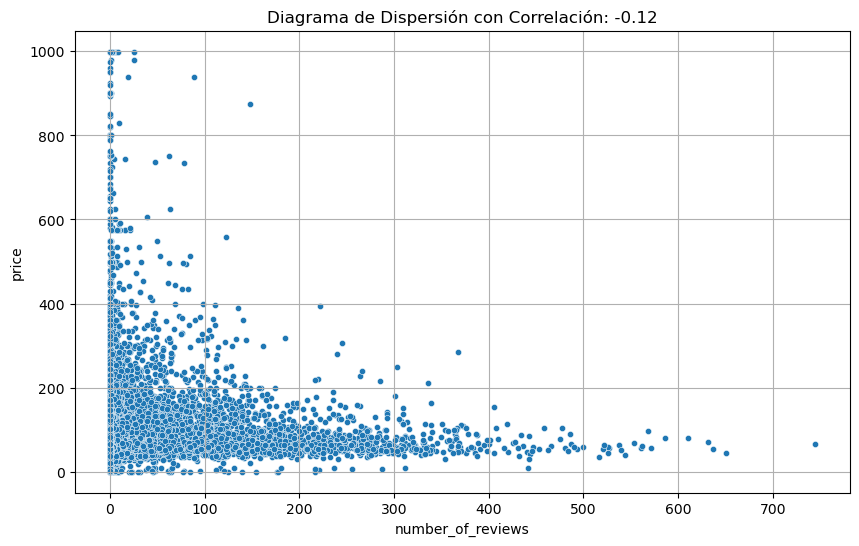

In [113]:
grafico_dispersion_con_correlacion(df_home,'number_of_reviews','price',20, mostrar_correlacion=True)

In [114]:
# Paso la correlación (Kendal, según el tamaño de la muestra)
correlacion_numericas(df_home,'number_of_reviews','price')

Correlación de Kendall: -0.0725182937079442
Valor p: 8.215914838666792e-29


C:\Users\Alfonso\AppData\Local\Temp\ipykernel_11832\1990776667.py:4: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11098.
  _, p1 = shapiro(df[var_num1])
C:\Users\Alfonso\AppData\Local\Temp\ipykernel_11832\1990776667.py:5: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11098.
  _, p2 = shapiro(df[var_num2])


#### Precio vs valoraciones


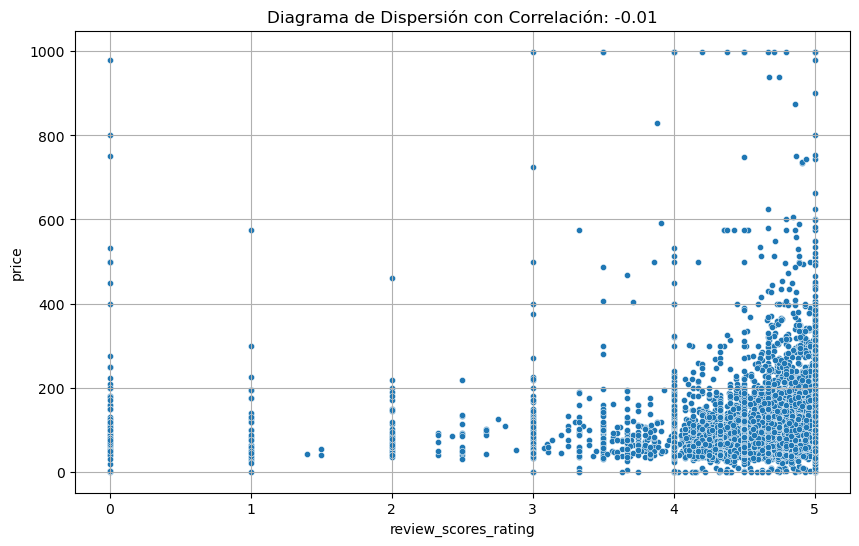

In [115]:
grafico_dispersion_con_correlacion(df_home,'review_scores_rating','price',20, mostrar_correlacion=True)

In [116]:
# Paso la correlación (Kendal, según el tamaño de la muestra)
correlacion_numericas(df_home,'review_scores_rating','price')

Correlación de Kendall: nan
Valor p: nan


C:\Users\Alfonso\AppData\Local\Temp\ipykernel_11832\1990776667.py:4: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11098.
  _, p1 = shapiro(df[var_num1])
C:\Users\Alfonso\AppData\Local\Temp\ipykernel_11832\1990776667.py:5: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11098.
  _, p2 = shapiro(df[var_num2])


#### Precio vs superficie_m2

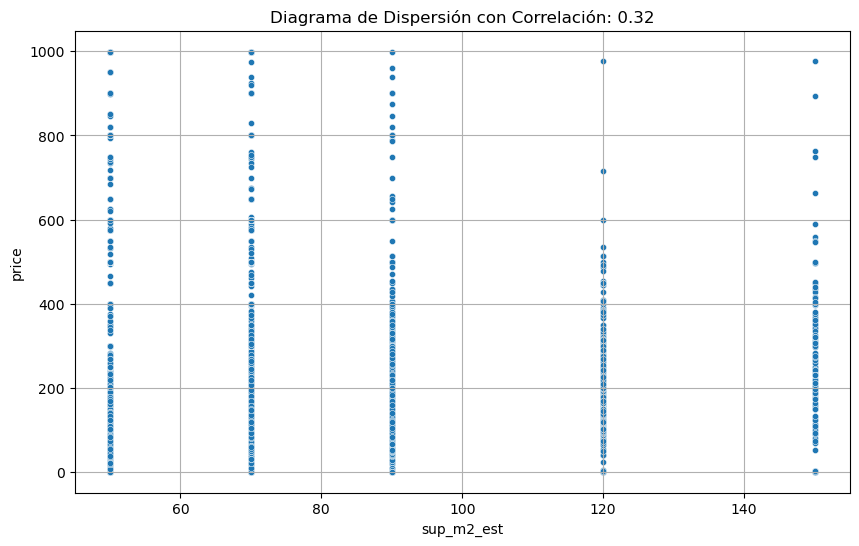

In [117]:
grafico_dispersion_con_correlacion(df_home,'sup_m2_est','price',20, mostrar_correlacion=True)

In [118]:
# Paso la correlación (Kendal, según el tamaño de la muestra)
correlacion_numericas(df_home,'sup_m2_est','price')

Correlación de Kendall: 0.3409842597511211
Valor p: 0.0


C:\Users\Alfonso\AppData\Local\Temp\ipykernel_11832\1990776667.py:4: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11098.
  _, p1 = shapiro(df[var_num1])
C:\Users\Alfonso\AppData\Local\Temp\ipykernel_11832\1990776667.py:5: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11098.
  _, p2 = shapiro(df[var_num2])


____

## Análisis bivariable filtrando por habitación privada (df_private, `Private room`)

### Variables categóricas

#### Precio discretizado por distrito

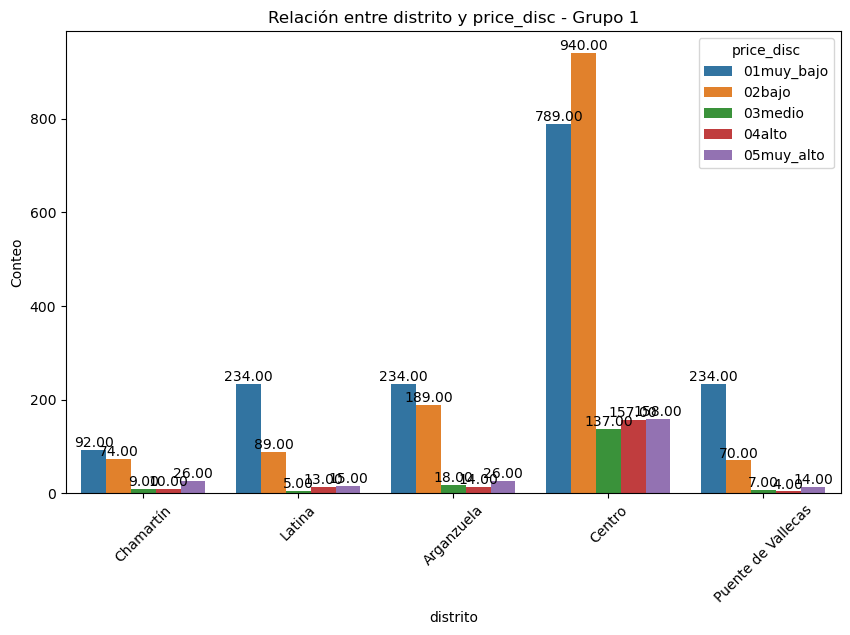

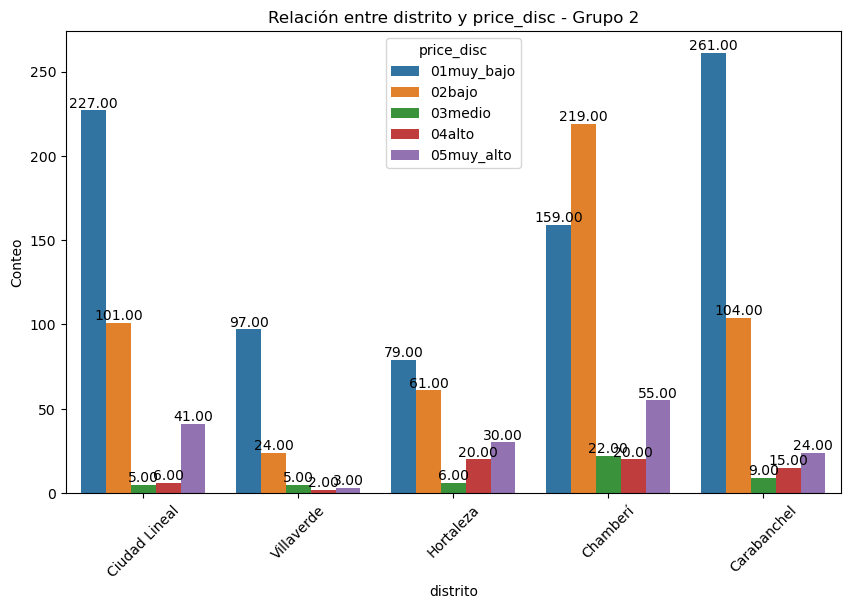

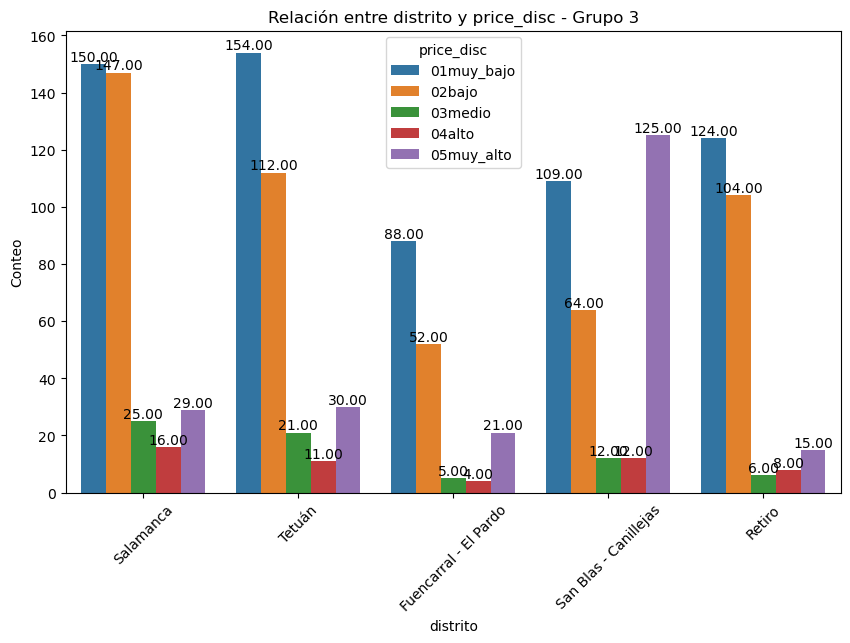

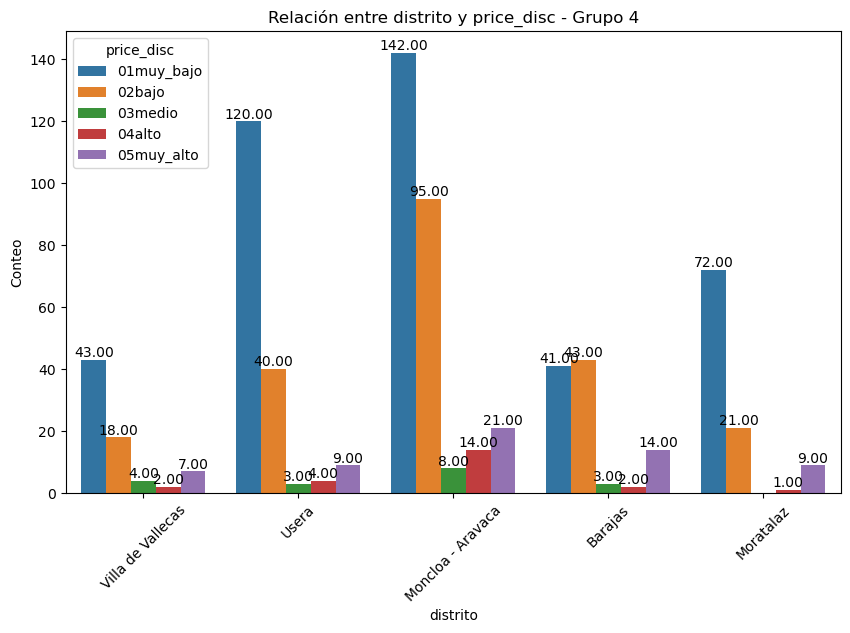

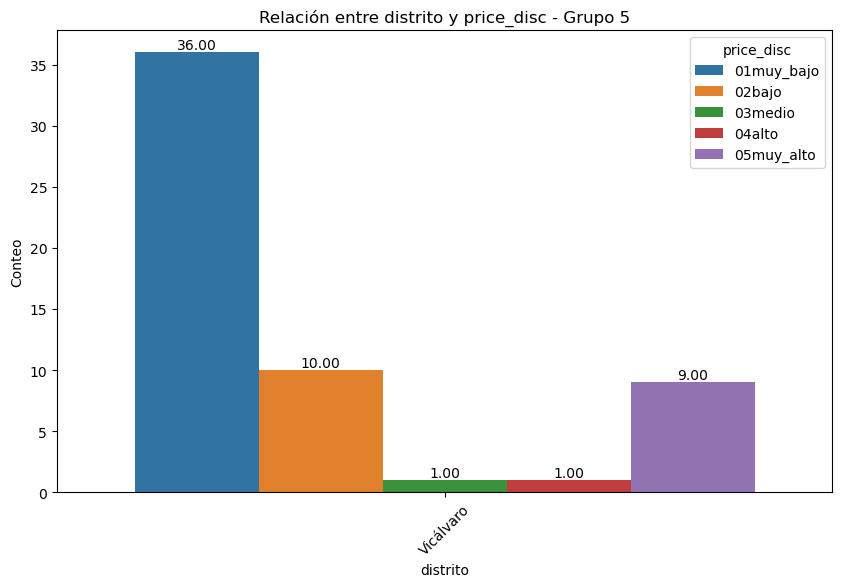

In [119]:
plot_categorical_relationship_fin(df_private,'distrito','price_disc',show_values=True)

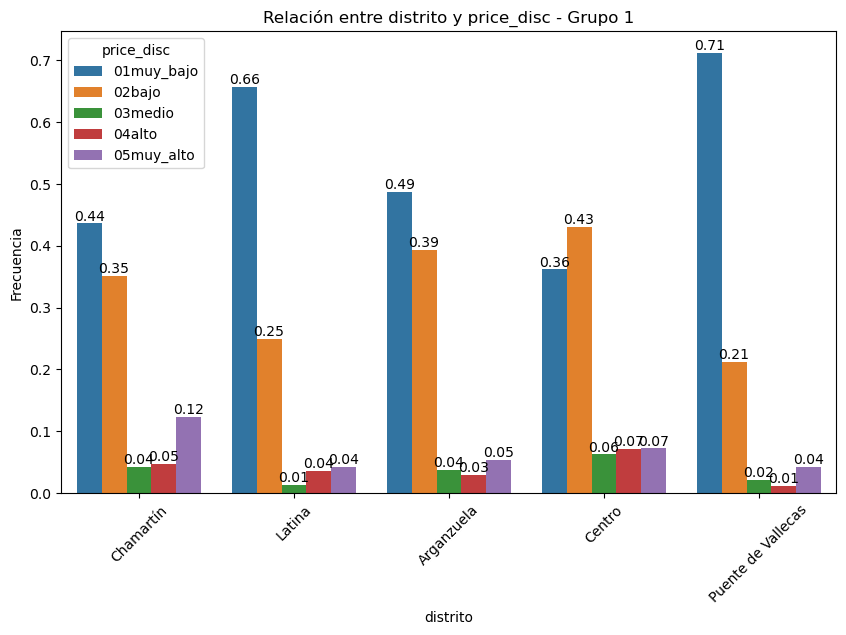

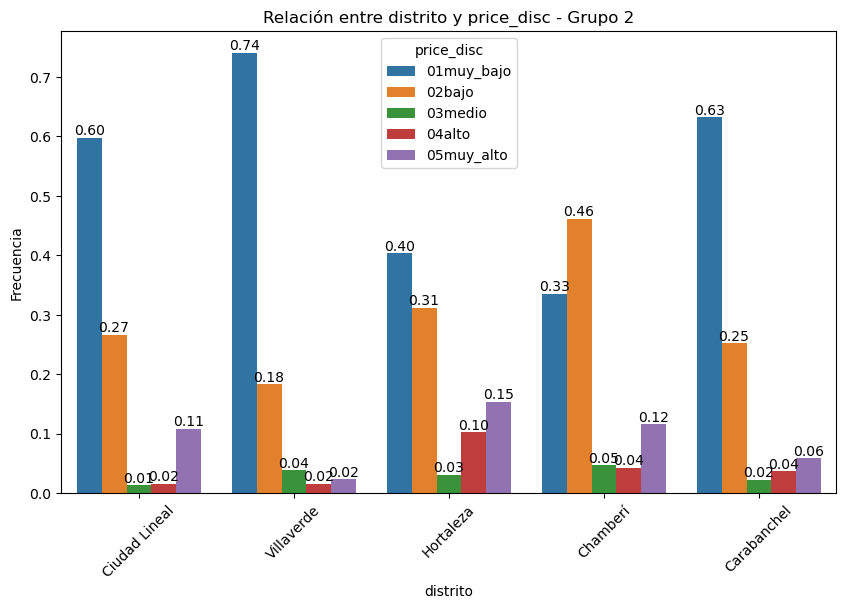

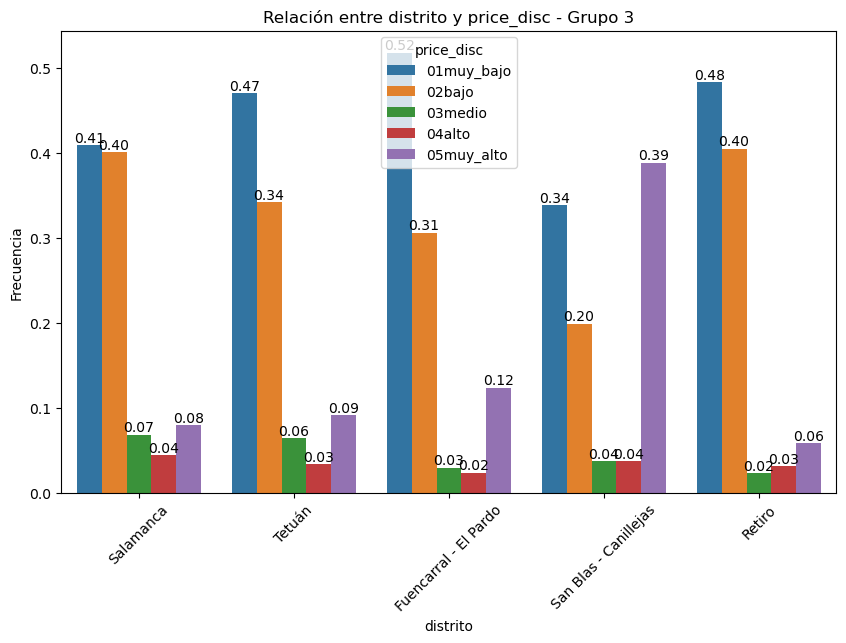

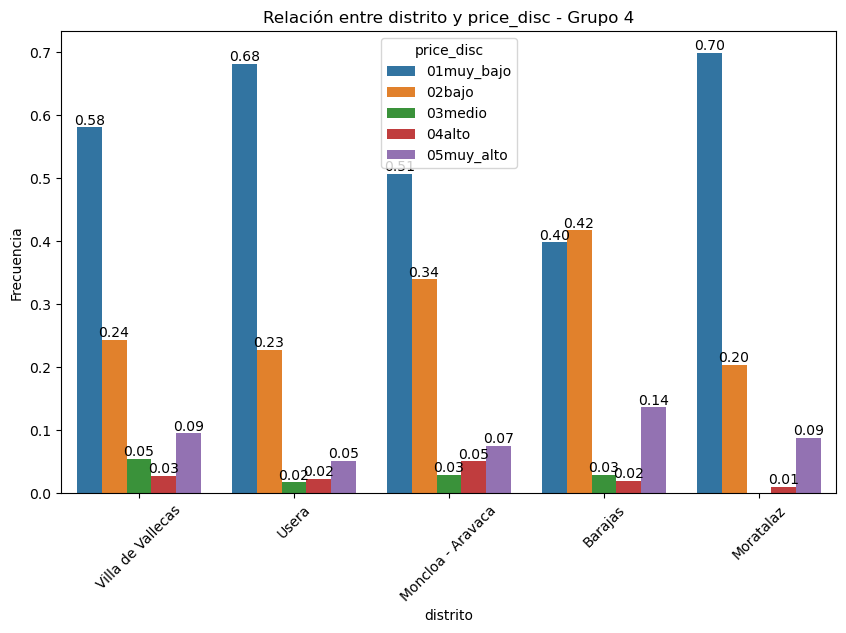

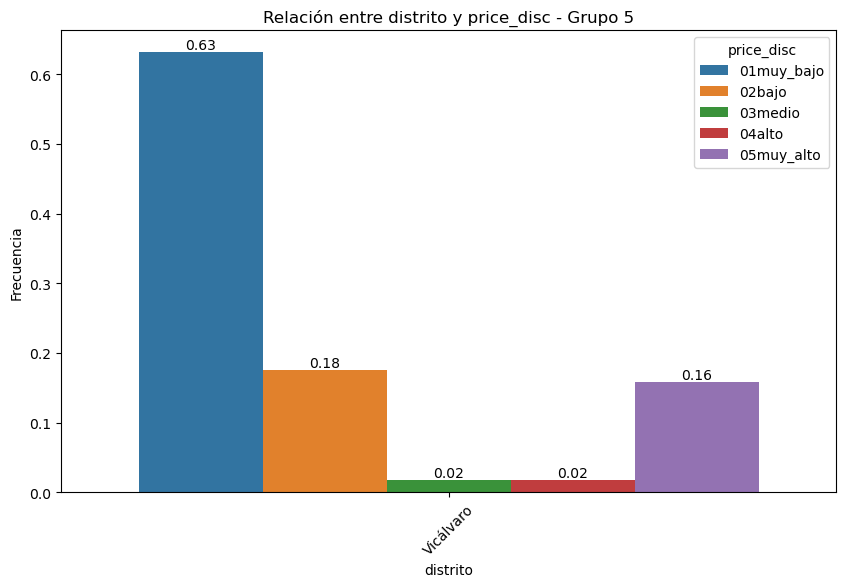

In [120]:
plot_categorical_relationship_fin(df_private,'distrito','price_disc',show_values=True,relative_freq=True)

In [121]:
correlacion_categoricas(df_private,'distrito','price_disc')

Valor Chi-Cuadrado: 949.9933589530219
P-Value: 6.7612846189545585e-149
Grados de Libertad: 80
Tabla de Frecuencias Esperadas:
 [[ 226.83152909  167.73166441   20.24235453   21.86955345   44.32489851]
 [  48.57307172   35.91759134    4.33464141    4.68308525    9.49161028]
 [ 194.76387009  144.01907984   17.38064953   18.77780785   38.05859269]
 [1028.52300406  760.54627876   91.7849797    99.1631935   200.98254398]
 [  99.50405954   73.57875507    8.8797023     9.59350474   19.44397835]
 [ 224.00202977  165.63937754   19.98985115   21.59675237   43.77198917]
 [ 179.20162382  132.51150203   15.99188092   17.27740189   35.01759134]
 [  80.1691475    59.28146143    7.15426252    7.72936401   15.66576455]
 [  92.43031123   68.34803789    8.24844384    8.91150203   18.06170501]
 [ 167.88362652  124.14235453   14.98186739   16.18619756   32.80595399]
 [ 132.04330176   97.64005413   11.7834912    12.73071719   25.80243572]
 [  48.57307172   35.91759134    4.33464141    4.68308525    9.4916102

#### Precio discretizado por propietario discretizado

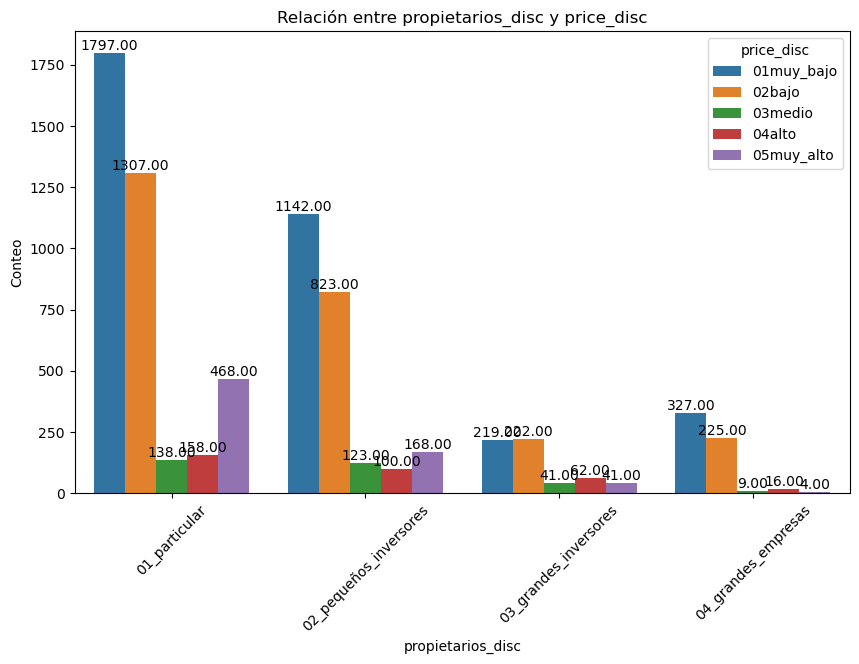

In [122]:
plot_categorical_relationship_fin(df_private,'propietarios_disc','price_disc',show_values=True)

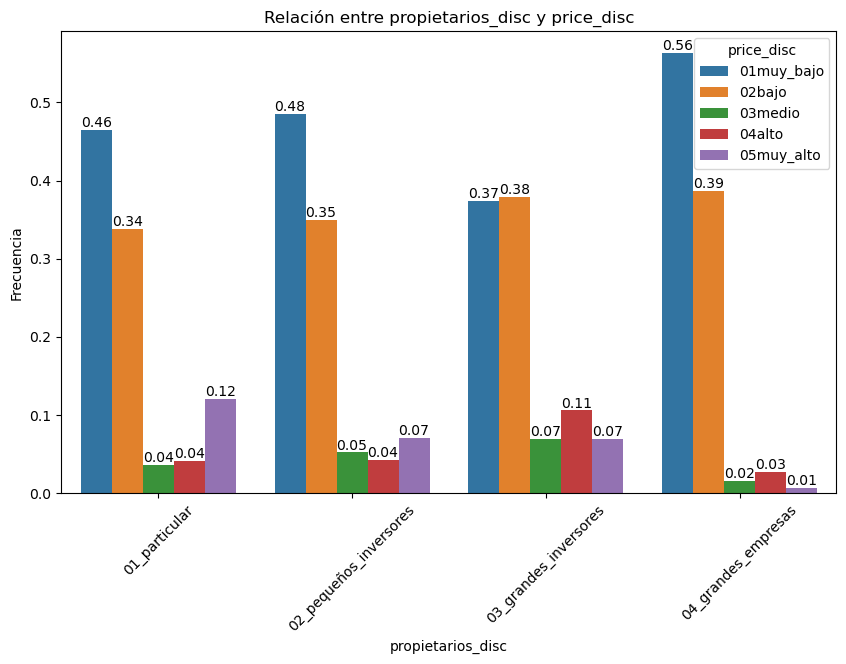

In [123]:
plot_categorical_relationship_fin(df_private,'propietarios_disc','price_disc',show_values=True,relative_freq=True)

In [124]:
correlacion_categoricas(df_private,'propietarios_disc','price_disc')

Valor Chi-Cuadrado: 207.25111212275692
P-Value: 1.0361073897715795e-37
Grados de Libertad: 12
Tabla de Frecuencias Esperadas:
 [[1824.08389716 1348.82760487  162.78051421  175.86576455  356.44221922]
 [1111.05006766  821.57131258   99.14966171  107.11989175  217.10906631]
 [ 275.87618403  203.99797023   24.61907984   26.59810555   53.90866035]
 [ 273.98985115  202.60311231   24.45074425   26.41623816   53.54005413]]


#### Precio discretizado por huéspedes discretizado

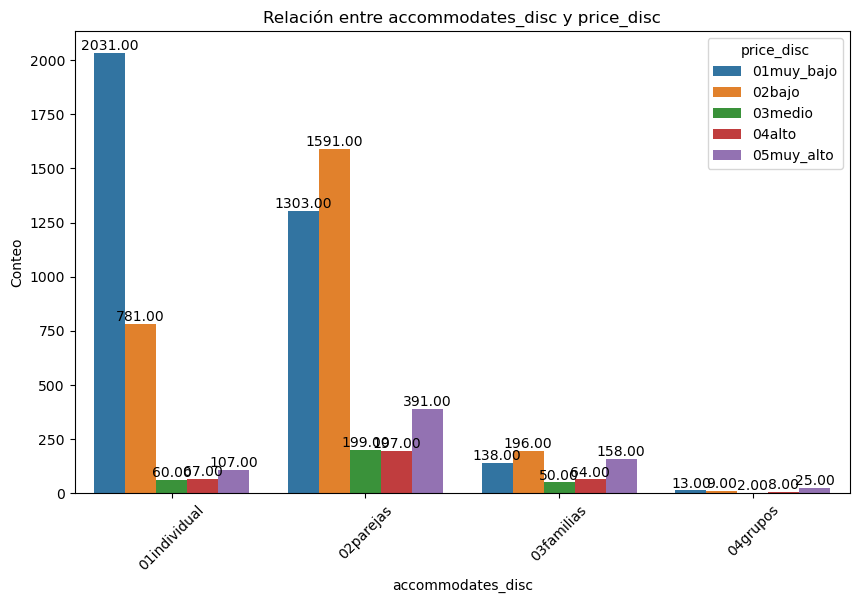

In [125]:
plot_categorical_relationship_fin(df_private,'accommodates_disc','price_disc',show_values=True)

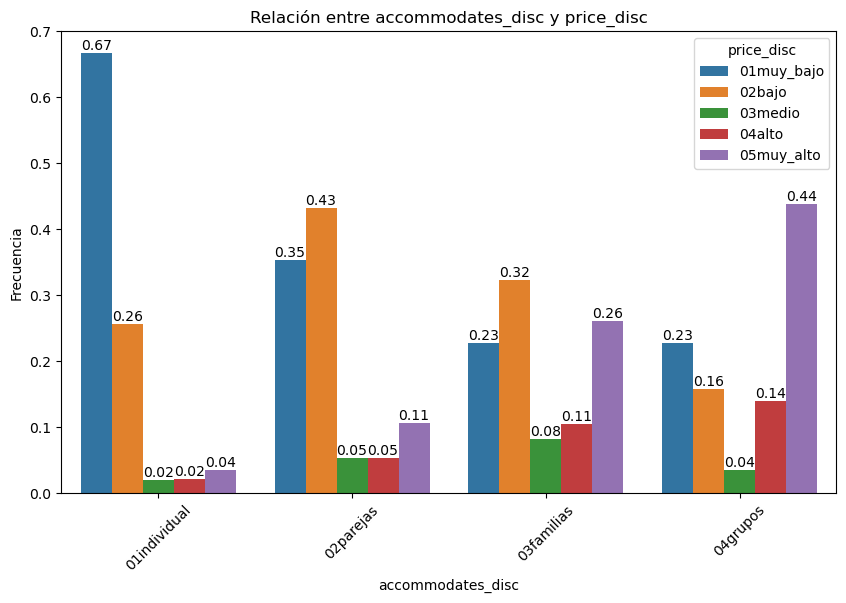

In [126]:
plot_categorical_relationship_fin(df_private,'accommodates_disc','price_disc',show_values=True,relative_freq=True)

In [127]:
correlacion_categoricas(df_private,'accommodates_disc','price_disc')

Valor Chi-Cuadrado: 1143.3157779982664
P-Value: 2.769756272420034e-237
Grados de Libertad: 12
Tabla de Frecuencias Esperadas:
 [[1436.44248985 1062.18430311  128.18755074  138.49201624  280.69364005]
 [1735.89783491 1283.61799729  154.91082544  167.36346414  339.20987821]
 [ 285.77943166  211.32097429   25.50284168   27.55290934   55.84384303]
 [  26.88024357   19.8767253     2.39878214    2.59161028    5.2526387 ]]


#### Precio discretizado por segmento de mercado

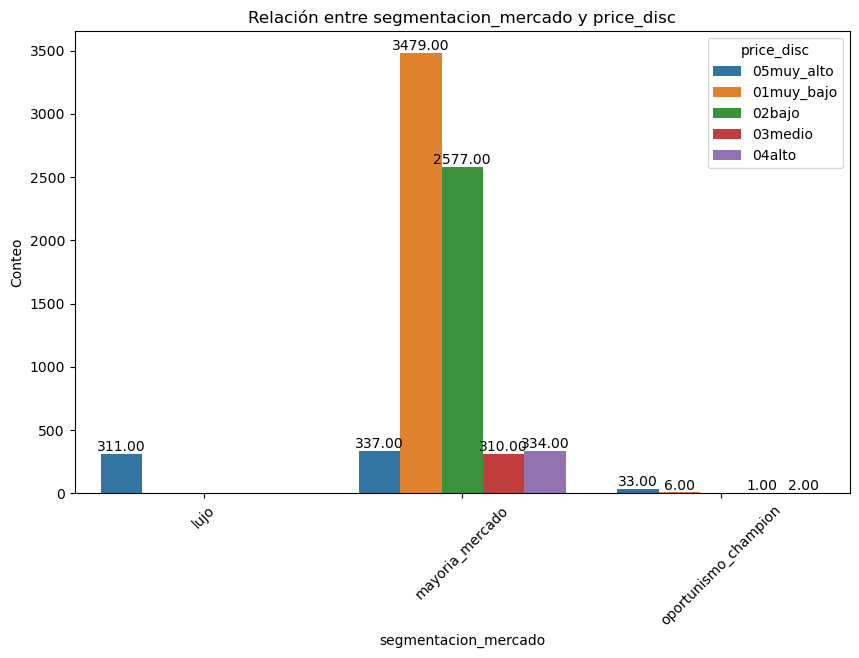

In [128]:
plot_categorical_relationship_fin(df_private,'segmentacion_mercado','price_disc',show_values=True)

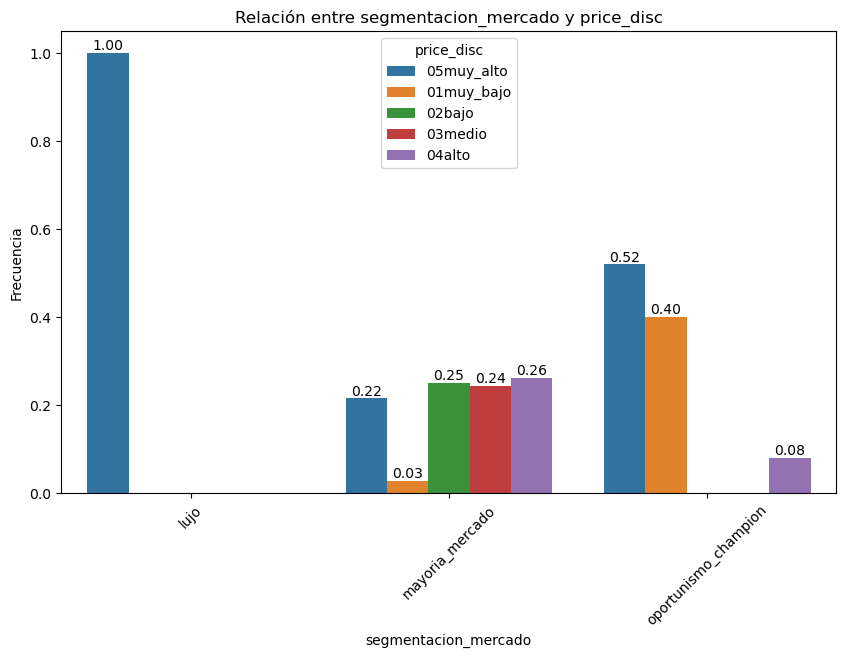

In [129]:
plot_categorical_relationship_fin(df_home,'segmentacion_mercado','price_disc',show_values=True,relative_freq=True)

In [130]:
correlacion_categoricas(df_private,'propietarios_disc','price_disc')

Valor Chi-Cuadrado: 207.25111212275692
P-Value: 1.0361073897715795e-37
Grados de Libertad: 12
Tabla de Frecuencias Esperadas:
 [[1824.08389716 1348.82760487  162.78051421  175.86576455  356.44221922]
 [1111.05006766  821.57131258   99.14966171  107.11989175  217.10906631]
 [ 275.87618403  203.99797023   24.61907984   26.59810555   53.90866035]
 [ 273.98985115  202.60311231   24.45074425   26.41623816   53.54005413]]


### Variables combinadas

#### Precio por distrito (mediana)

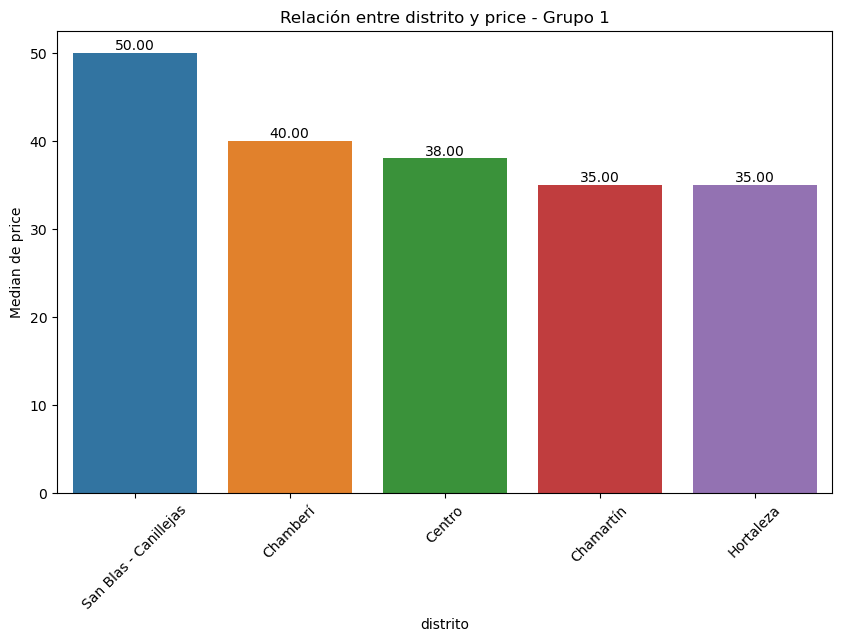

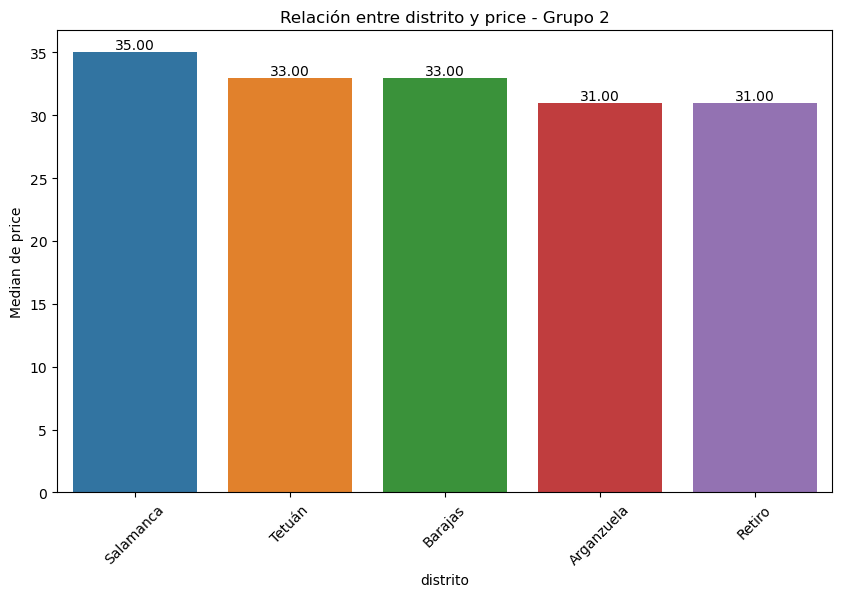

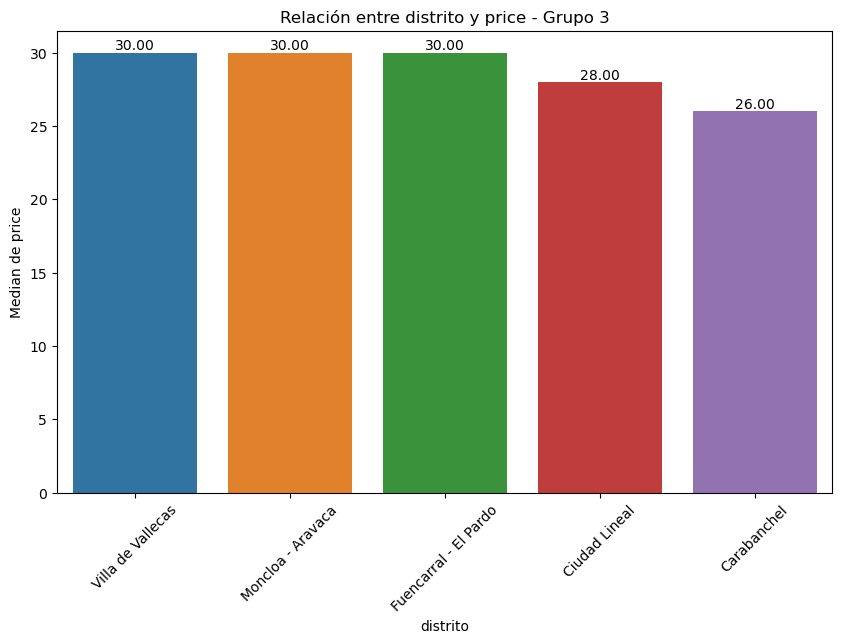

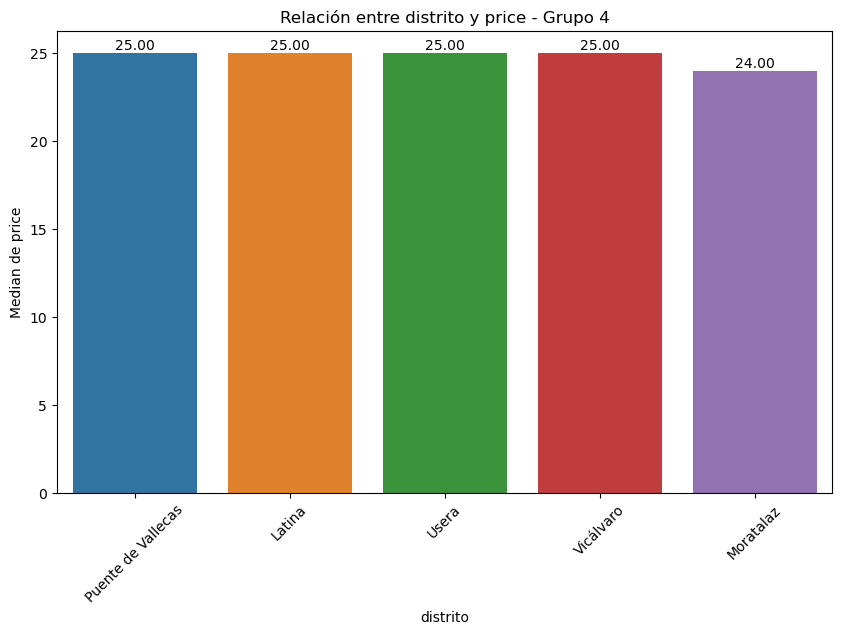

c:\Users\Alfonso\miniconda3\Lib\site-packages\seaborn\categorical.py:645: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  g_vals = grouped_vals.get_group(g)


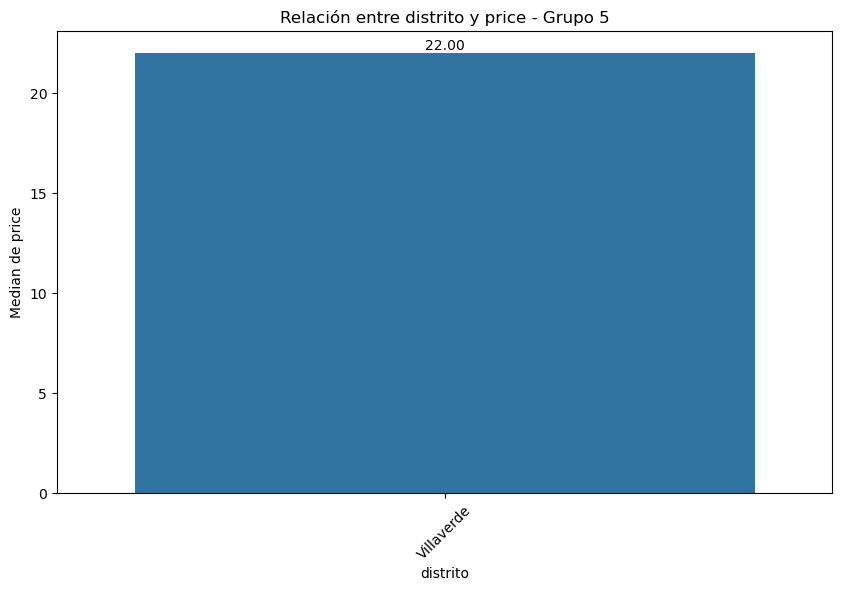

In [131]:
plot_categorical_numerical_relationship(df_private,'distrito','price', measure='median',show_values=True)

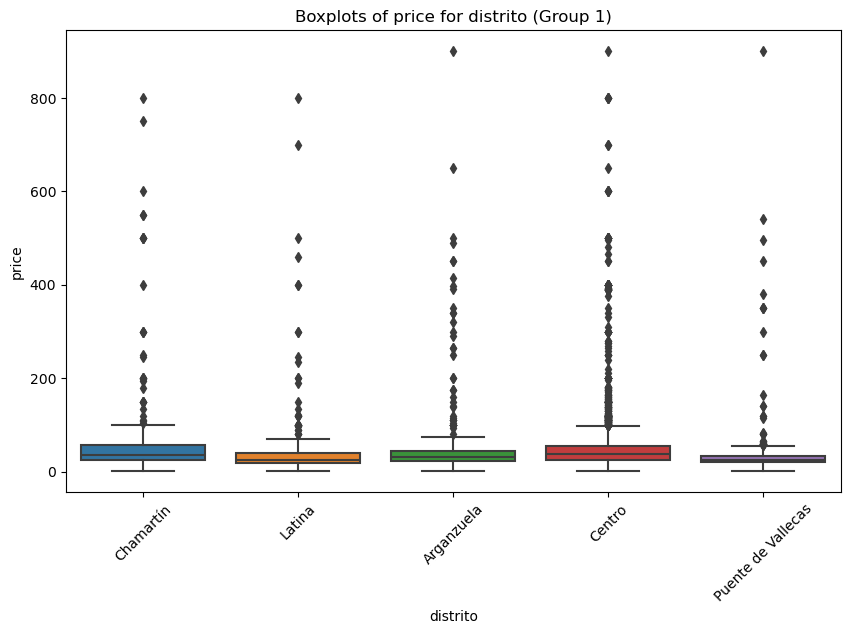

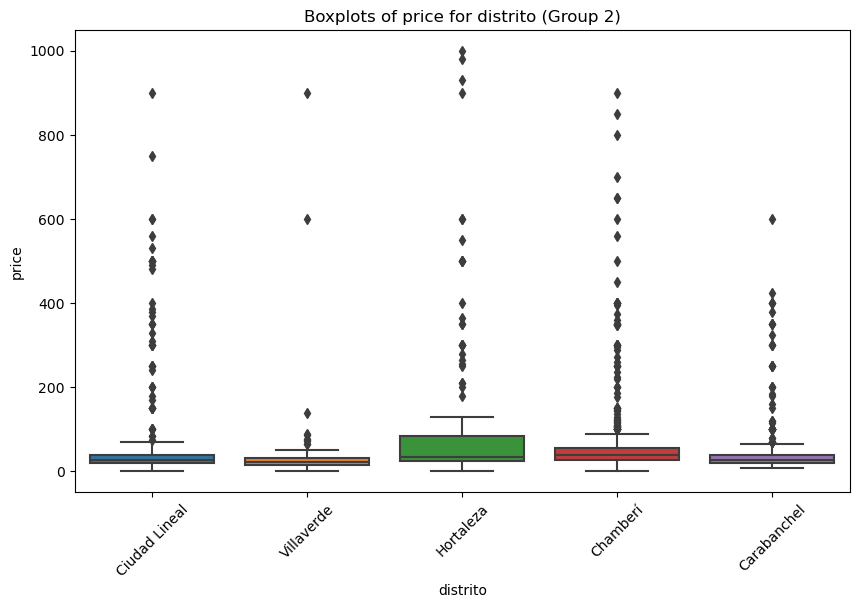

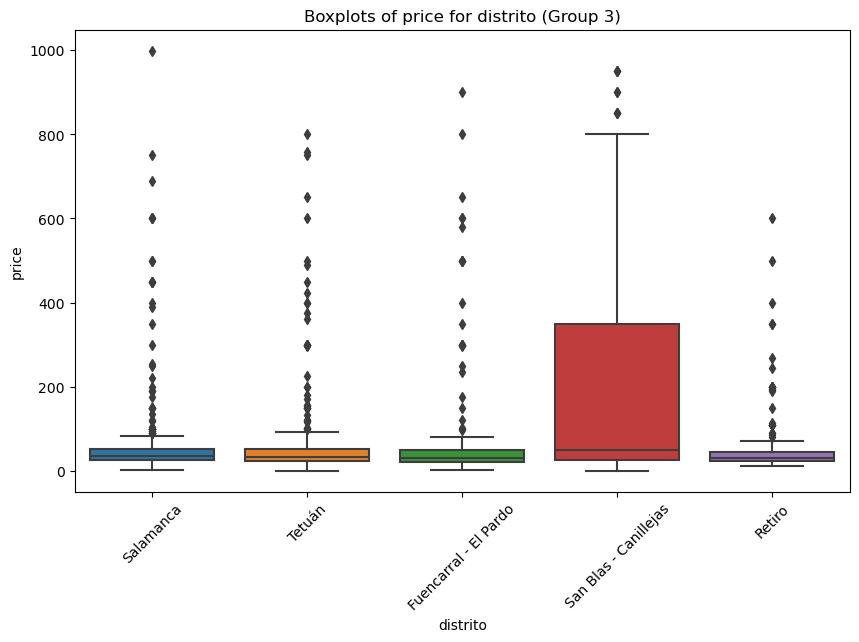

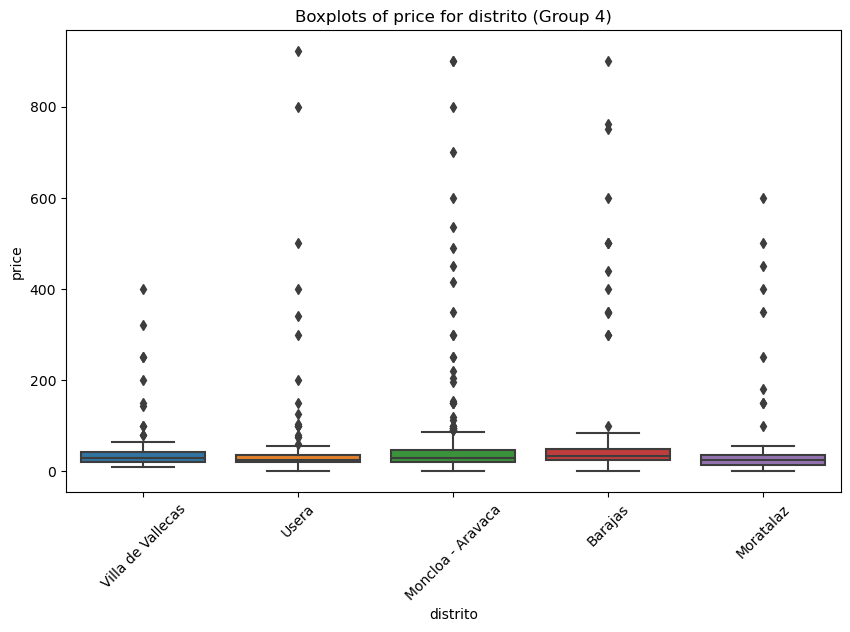

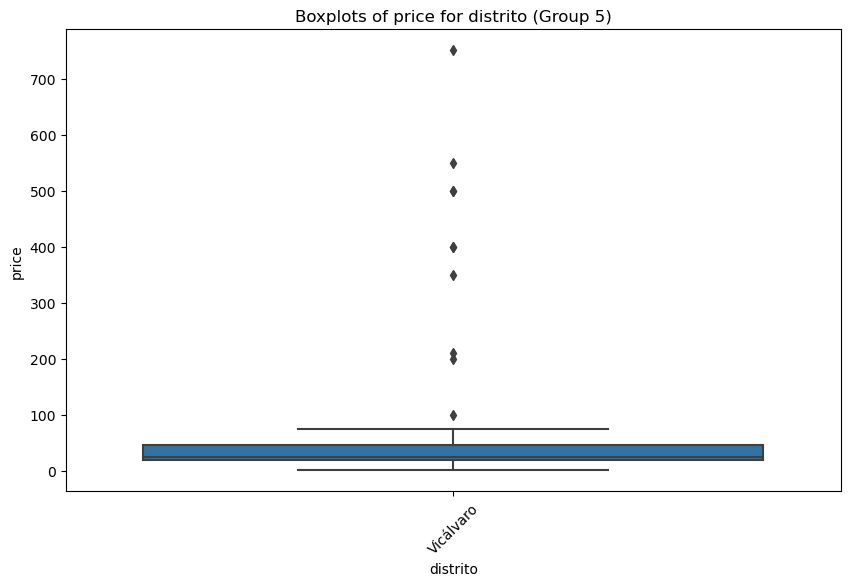

In [132]:
plot_grouped_boxplots(df_private,'distrito','price')

In [133]:
# Test de ANOVA
test_anova(df_private,'distrito','price')

Valor F: 30.451156143887072
Valor p: 2.7176854338409813e-111


La prueba ANOVA da como resultado que hay diferencias significativas en al menos una de las medias.

In [134]:
test_tukey_hsd(df_private,'distrito','price')

c:\Users\Alfonso\miniconda3\Lib\site-packages\scipy\integrate\_quadpack_py.py:1272: IntegrationWarning: The integral is probably divergent, or slowly convergent.
  quad_r = quad(f, low, high, args=args, full_output=self.full_output,


                  Multiple Comparison of Means - Tukey HSD, FWER=0.05                  
        group1                group2         meandiff p-adj    lower     upper   reject
---------------------------------------------------------------------------------------
           Arganzuela               Barajas   46.4308 0.0199    3.2104   89.6512   True
           Arganzuela           Carabanchel   -4.6255    1.0  -31.3306   22.0796  False
           Arganzuela                Centro    8.5504 0.9957  -11.5025   28.6033  False
           Arganzuela             Chamartín   23.7543 0.5452   -9.1167   56.6252  False
           Arganzuela              Chamberí   23.0619 0.1515   -2.6884   48.8123  False
           Arganzuela         Ciudad Lineal   14.2752 0.9565  -13.0466   41.5971  False
           Arganzuela Fuencarral - El Pardo   31.5813 0.1611   -3.9382   67.1008  False
           Arganzuela             Hortaleza   47.1366 0.0001   13.4027   80.8706   True
           Arganzuela           

#### Precio por tipo de oferta (mediana)

c:\Users\Alfonso\miniconda3\Lib\site-packages\seaborn\categorical.py:645: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  g_vals = grouped_vals.get_group(g)


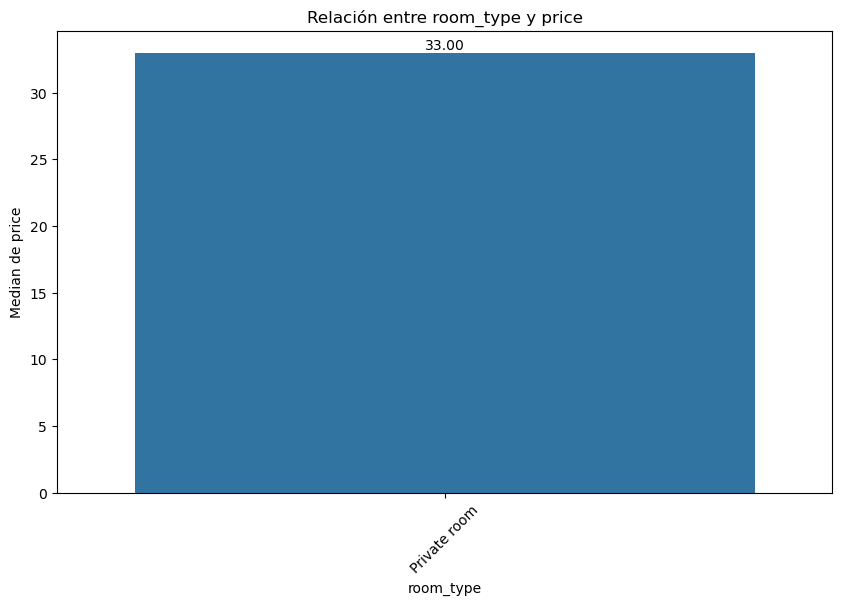

In [135]:
plot_categorical_numerical_relationship(df_private,'room_type','price', measure='median',show_values=True)

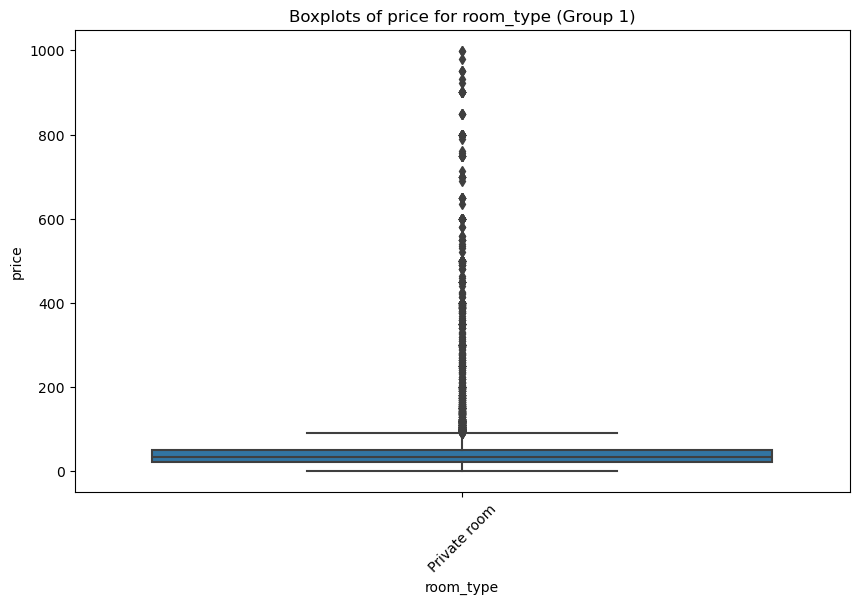

In [136]:
plot_grouped_boxplots(df_private,'room_type','price')

#### Precio por huéspedes_discretizado (mediana)

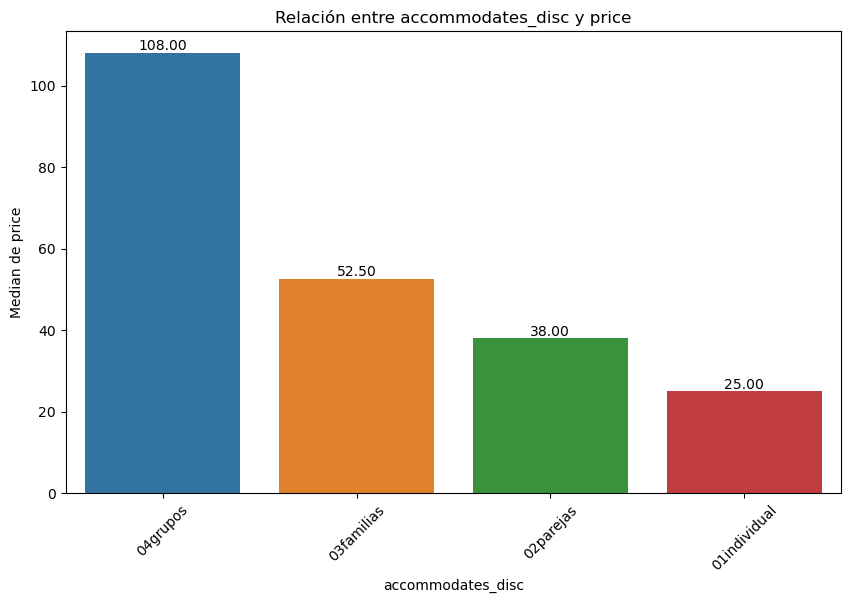

In [137]:
plot_categorical_numerical_relationship(df_private,'accommodates_disc','price', measure='median',show_values=True)

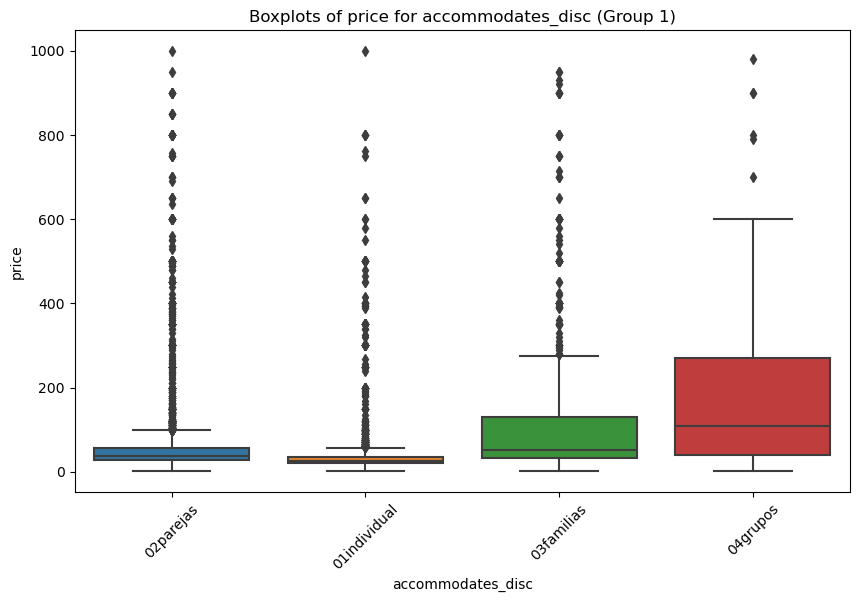

In [138]:
plot_grouped_boxplots(df_private,'accommodates_disc','price')

In [139]:
# Test ANOVA
test_anova(df_private,'accommodates','price')

Valor F: 63.77390999701678
Valor p: 2.5317092046012667e-113


In [140]:
# Test de Tukey
test_tukey_hsd(df_private,'accommodates','price')

c:\Users\Alfonso\miniconda3\Lib\site-packages\scipy\integrate\_quadpack_py.py:1272: IntegrationWarning: The integral is probably divergent, or slowly convergent.
  quad_r = quad(f, low, high, args=args, full_output=self.full_output,


  Multiple Comparison of Means - Tukey HSD, FWER=0.05   
group1 group2  meandiff p-adj    lower    upper   reject
--------------------------------------------------------
     1      2   33.3467    0.0   24.6909  42.0024   True
     1      3   76.6797    0.0   56.5004  96.8591   True
     1      4  129.2754    0.0  105.2556 153.2952   True
     1      5   86.9338 0.0005   24.1372 149.7304   True
     1      6  198.1885    0.0  135.3919 260.9851   True
     1      8  150.0604 0.0001   47.8476 252.2731   True
     1     10  203.7548    0.0   85.7876  321.722   True
     1     13  -10.6896    1.0 -364.1276 342.7484  False
     1     16   22.6437    1.0 -181.4808 226.7682  False
     2      3   43.3331    0.0   23.3297  63.3364   True
     2      4   95.9287    0.0   72.0566 119.8009   True
     2      5   53.5871 0.1724   -9.1532 116.3274  False
     2      6  164.8418    0.0  102.1015 227.5821   True
     2      8  116.7137 0.0113   14.5355 218.8919   True
     2     10  170.4081 0.0002 

#### Precio por propietarios_disc (median)

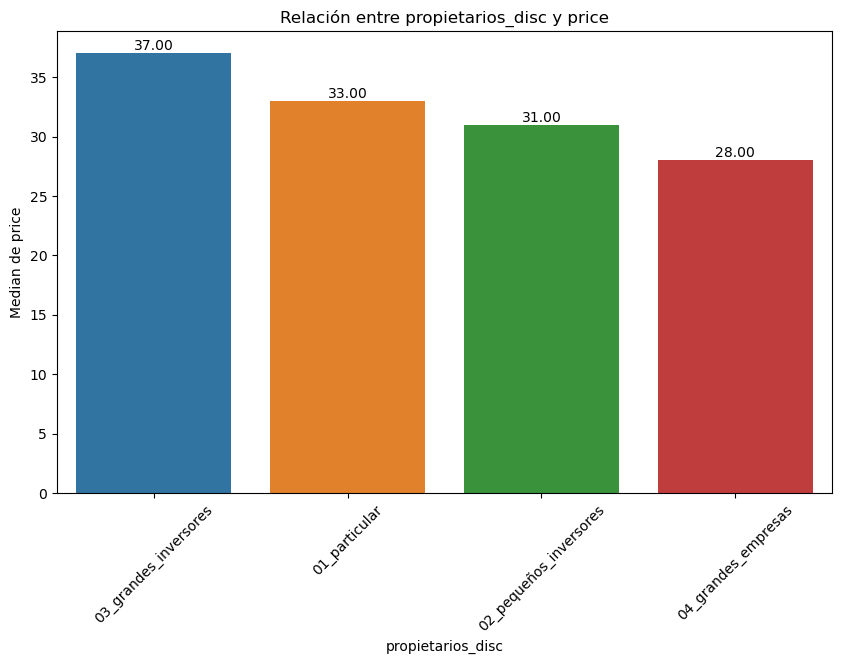

In [141]:
plot_categorical_numerical_relationship(df_private,'propietarios_disc','price', measure='median',show_values=True)

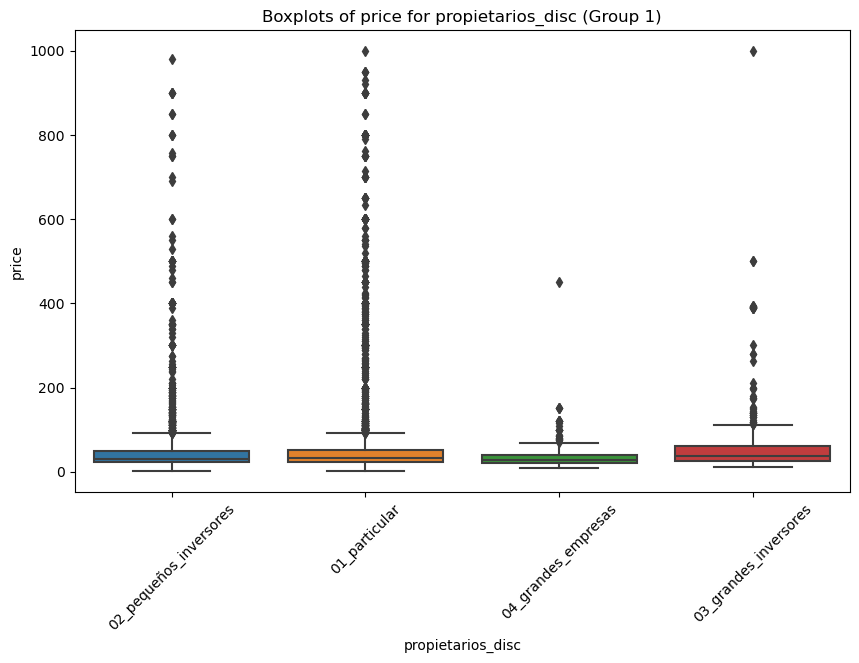

In [142]:
plot_grouped_boxplots(df_private,'propietarios_disc','price')

In [143]:
# Test ANOVA
test_anova(df_private,'propietarios_disc','price')

Valor F: 37.97080573834498
Valor p: 2.4196337164620797e-24


In [144]:
# Test de Tukey
test_tukey_hsd(df_private,'propietarios_disc','price')

                 Multiple Comparison of Means - Tukey HSD, FWER=0.05                  
        group1                 group2         meandiff p-adj   lower    upper   reject
--------------------------------------------------------------------------------------
         01_particular 02_pequeños_inversores -22.5699    0.0 -30.2923 -14.8475   True
         01_particular  03_grandes_inversores -20.0174 0.0005 -33.1259  -6.9089   True
         01_particular    04_grandes_empresas  -45.434    0.0 -58.5816 -32.2864   True
02_pequeños_inversores  03_grandes_inversores   2.5525 0.9634 -11.0974  16.2024  False
02_pequeños_inversores    04_grandes_empresas -22.8641 0.0001 -36.5516  -9.1766   True
 03_grandes_inversores    04_grandes_empresas -25.4166 0.0009  -42.724  -8.1093   True
--------------------------------------------------------------------------------------


#### Oferta vs precio_m2

c:\Users\Alfonso\miniconda3\Lib\site-packages\seaborn\categorical.py:645: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  g_vals = grouped_vals.get_group(g)


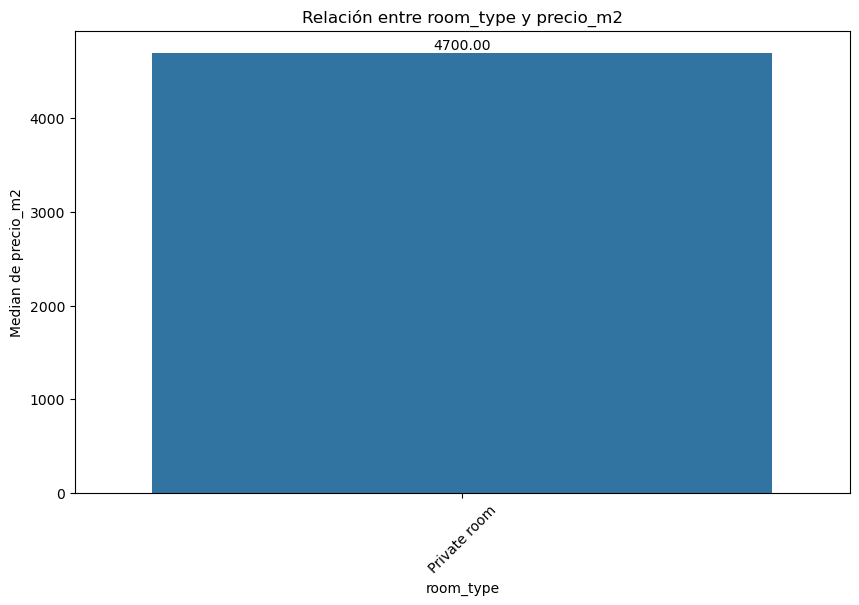

In [145]:
plot_categorical_numerical_relationship(df_private,'room_type','precio_m2', measure='median',show_values=True)

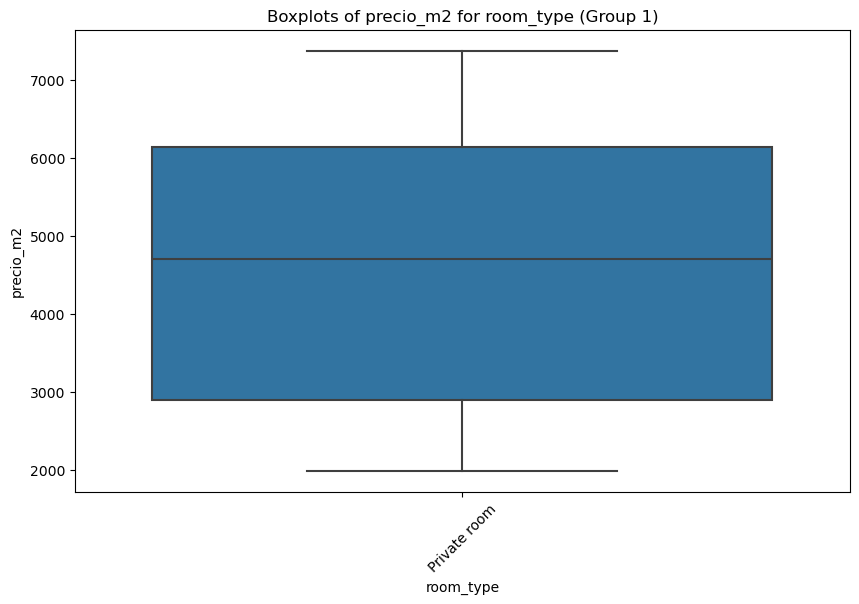

In [146]:
plot_grouped_boxplots(df_private,'room_type','precio_m2')

### Variables numéricas

##### Heatmap

In [207]:
columnas_temp = df_private.select_dtypes(include=['int', 'float']).columns
columnas_temp

Index(['id', 'host_id', 'host_listings_count', 'latitude', 'longitude',
       'accommodates', 'bedrooms', 'beds', 'price', 'minimum_nights',
       'maximum_nights', 'number_of_reviews', 'review_scores_rating',
       'calculated_host_listings_count', 'bathrooms', 'precio_m2',
       'price_accommodates', 'price_bedrooms', 'antiguedad_host'],
      dtype='object')

In [208]:
columnas_numericas = [ 'latitude', 'longitude','accommodates', 'bedrooms', 'beds', 'price', 'minimum_nights',
       'number_of_reviews', 'review_scores_rating',
       'bathrooms', 'precio_m2',
       'price_accommodates', 'price_bedrooms', 'antiguedad_host']

In [209]:
corr_matrix = df_private[columnas_numericas].corr()
corr_matrix

,latitude,longitude,accommodates,bedrooms,beds,price,minimum_nights,number_of_reviews,review_scores_rating,bathrooms,precio_m2,price_accommodates,price_bedrooms,antiguedad_host
latitude,1.000000,0.227457,0.028486,0.009324,0.033951,0.111459,-0.000043,0.012518,0.041181,0.005900,0.315431,0.106469,0.105772,0.033866
longitude,0.227457,1.000000,0.046365,0.025415,0.032308,0.162869,-0.050112,0.021438,0.001394,-0.038203,-0.193090,0.140072,0.154976,-0.030964
accommodates,0.028486,0.046365,1.000000,0.313936,0.572773,0.243221,-0.058998,0.026873,-0.072530,0.137296,0.051249,-0.021239,0.088638,-0.011851
bedrooms,0.009324,0.025415,0.313936,1.000000,0.435445,0.107060,0.004327,-0.047416,-0.051437,0.202787,-0.015910,0.022465,0.010074,-0.060290
beds,0.033951,0.032308,0.572773,0.435445,1.000000,0.173703,-0.010398,-0.023516,-0.024074,0.196813,0.009184,0.031882,-0.042601,-0.036147
price,0.111459,0.162869,0.243221,0.107060,0.173703,1.000000,-0.046330,-0.105647,-0.056774,-0.013975,-0.026442,0.871153,0.906872,-0.073797
minimum_nights,-0.000043,-0.050112,-0.058998,0.004327,-0.010398,-0.046330,1.000000,-0.029725,-0.041483,0.015284,0.018329,-0.031981,-0.041540,0.001528
number_of_reviews,0.012518,0.021438,0.026873,-0.047416,-0.023516,-0.105647,-0.029725,1.000000,0.099949,-0.023964,0.073263,-0.107631,-0.100655,0.239004
review_scores_rating,0.041181,0.001394,-0.072530,-0.051437,-0.024074,-0.056774,-0.041483,0.099949,1.000000,-0.012503,0.017289,-0.049069,-0.055024,0.075375
bathrooms,0.005900,-0.038203,0.137296,0.202787,0.196813,-0.013975,0.015284,-0.023964,-0.012503,1.000000,0.077232,-0.040748,-0.045577,0.021854


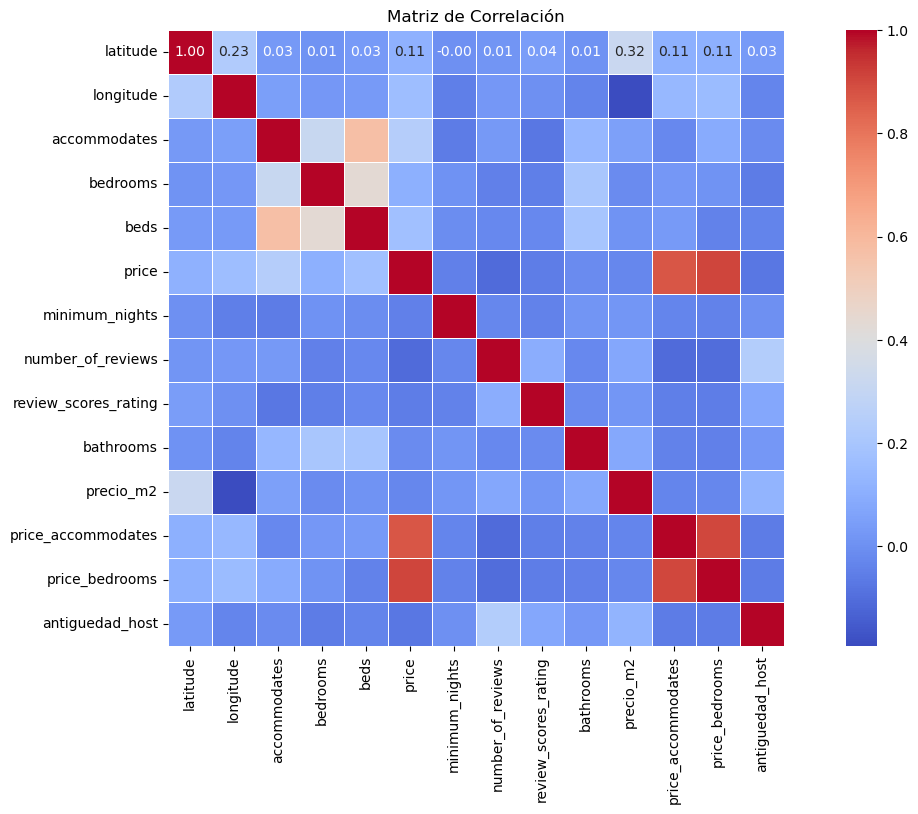

In [210]:
plt.figure(figsize=(16, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm',fmt=".2f", cbar=True, square=True, linewidths=.5)
plt.title('Matriz de Correlación')
plt.xticks(fontsize=10)  
plt.yticks(fontsize=10) 

plt.show()

- Cierta correlación entre el número de huéspedes (accommodates) y el de camas (lo lógico sería que la correlación fuera más fuerte dado que se trata de alquleres de habitaciones privadas únicamente).
- Curioso es una cierta correlación inversa entre longitude y precio_m2, que no había salido anteriormente.

#### Precio por precio_m2

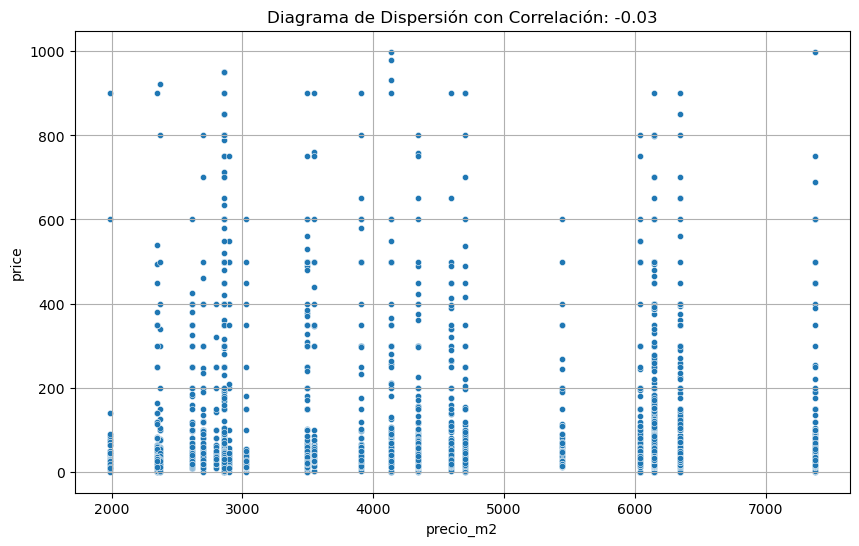

In [147]:
grafico_dispersion_con_correlacion(df_private,'precio_m2','price',20, mostrar_correlacion=True)

In [148]:
# Paso la correlación (Kendal, según el tamaño de la muestra)
correlacion_numericas(df_private,'precio_m2','price')

Correlación de Kendall: 0.1450455335818108
Valor p: 2.3475839105501444e-69


C:\Users\Alfonso\AppData\Local\Temp\ipykernel_11832\1990776667.py:4: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 7390.
  _, p1 = shapiro(df[var_num1])
C:\Users\Alfonso\AppData\Local\Temp\ipykernel_11832\1990776667.py:5: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 7390.
  _, p2 = shapiro(df[var_num2])


#### Precio vs habitaciones

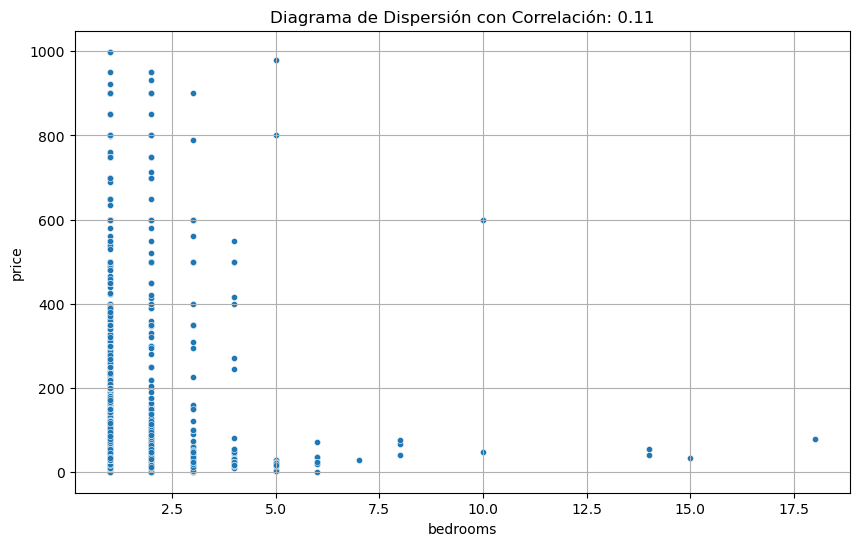

In [149]:
grafico_dispersion_con_correlacion(df_private,'bedrooms','price',20, mostrar_correlacion=True)

In [150]:
# Paso la correlación (Kendal, según el tamaño de la muestra)
correlacion_numericas(df_private,'bedrooms','price')

Correlación de Kendall: 0.06469241871174225
Valor p: 1.1062035596888343e-11


C:\Users\Alfonso\AppData\Local\Temp\ipykernel_11832\1990776667.py:4: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 7390.
  _, p1 = shapiro(df[var_num1])
C:\Users\Alfonso\AppData\Local\Temp\ipykernel_11832\1990776667.py:5: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 7390.
  _, p2 = shapiro(df[var_num2])


#### Precio vs camas

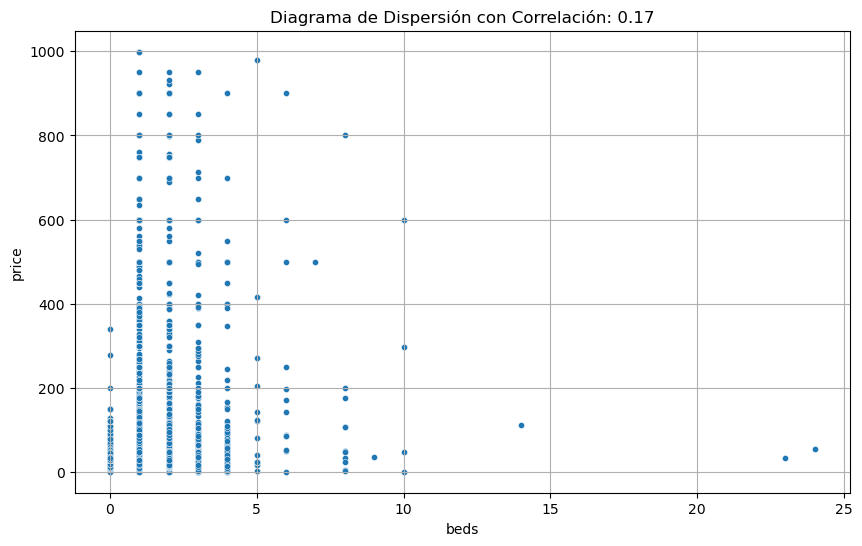

In [151]:
grafico_dispersion_con_correlacion(df_private,'beds','price',20, mostrar_correlacion=True)

In [152]:
# Paso la correlación (Kendal, según el tamaño de la muestra)
correlacion_numericas(df_private,'beds','price')

Correlación de Kendall: 0.15111965137296468
Valor p: 1.6094092180076432e-59


C:\Users\Alfonso\AppData\Local\Temp\ipykernel_11832\1990776667.py:4: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 7390.
  _, p1 = shapiro(df[var_num1])
C:\Users\Alfonso\AppData\Local\Temp\ipykernel_11832\1990776667.py:5: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 7390.
  _, p2 = shapiro(df[var_num2])


#### Precio vs accommodates

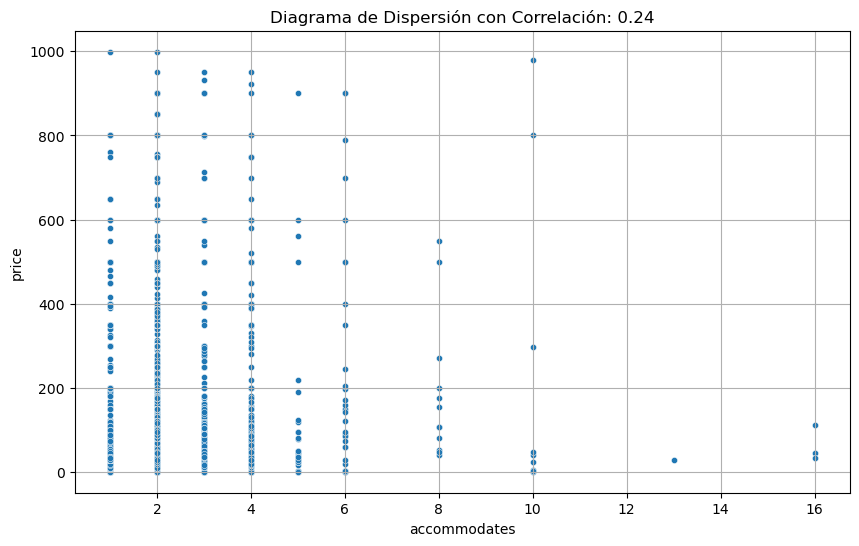

In [153]:
grafico_dispersion_con_correlacion(df_private,'accommodates','price',20, mostrar_correlacion=True)

In [154]:
# Paso la correlación (Kendal, según el tamaño de la muestra)
correlacion_numericas(df_private,'accommodates','price')

Correlación de Kendall: 0.3053149643197945
Valor p: 2.066853538555857e-238


C:\Users\Alfonso\AppData\Local\Temp\ipykernel_11832\1990776667.py:4: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 7390.
  _, p1 = shapiro(df[var_num1])
C:\Users\Alfonso\AppData\Local\Temp\ipykernel_11832\1990776667.py:5: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 7390.
  _, p2 = shapiro(df[var_num2])


#### Precio vs número de reviews

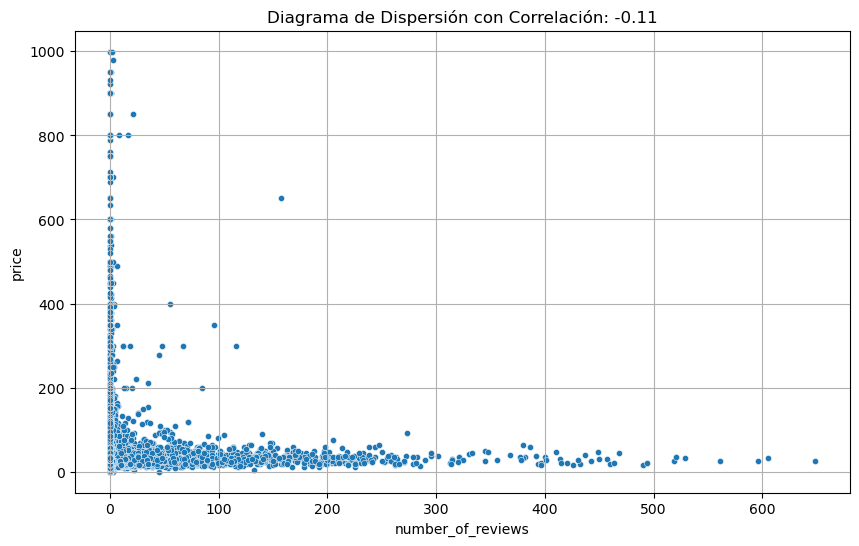

In [155]:
grafico_dispersion_con_correlacion(df_private,'number_of_reviews','price',20, mostrar_correlacion=True)

In [156]:
# Paso la correlación (Kendal, según el tamaño de la muestra)
correlacion_numericas(df_private,'number_of_reviews','price')

Correlación de Kendall: -0.12074909175326835
Valor p: 1.0012606026558254e-47


C:\Users\Alfonso\AppData\Local\Temp\ipykernel_11832\1990776667.py:4: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 7390.
  _, p1 = shapiro(df[var_num1])
C:\Users\Alfonso\AppData\Local\Temp\ipykernel_11832\1990776667.py:5: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 7390.
  _, p2 = shapiro(df[var_num2])


#### Precio vs valoraciones


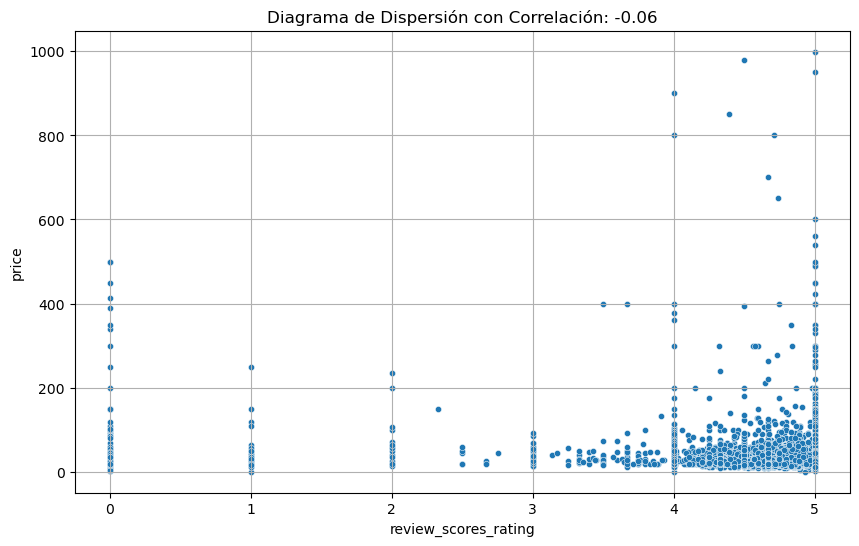

In [157]:
grafico_dispersion_con_correlacion(df_private,'review_scores_rating','price',20, mostrar_correlacion=True)

In [158]:
# Paso la correlación (Kendal, según el tamaño de la muestra)
correlacion_numericas(df_private,'review_scores_rating','price')

Correlación de Kendall: nan
Valor p: nan


C:\Users\Alfonso\AppData\Local\Temp\ipykernel_11832\1990776667.py:4: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 7390.
  _, p1 = shapiro(df[var_num1])
C:\Users\Alfonso\AppData\Local\Temp\ipykernel_11832\1990776667.py:5: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 7390.
  _, p2 = shapiro(df[var_num2])


___

## Análisis bivariable filtrando por habitación compartida (df_shared, `Shared room`)

### Variables categóricas

#### Precio discretizado por distrito

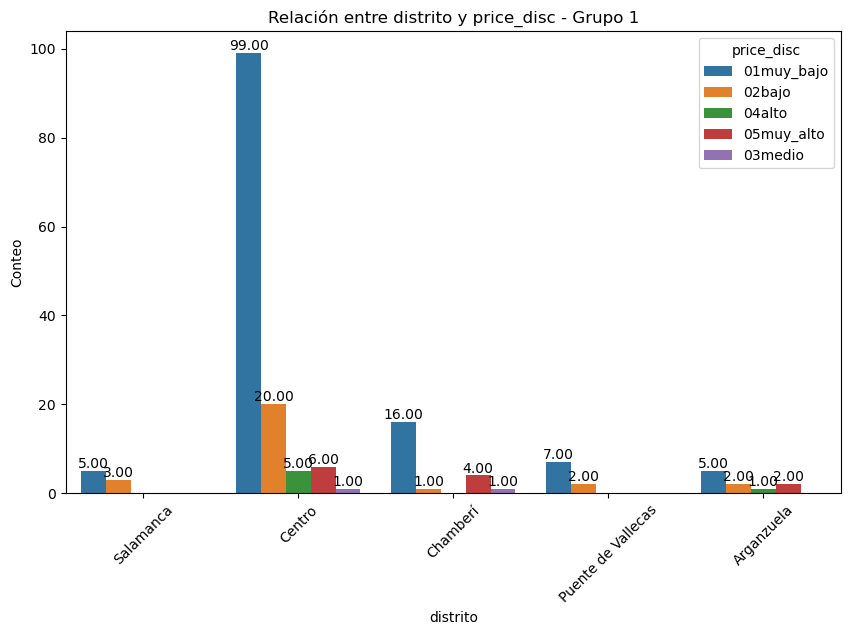

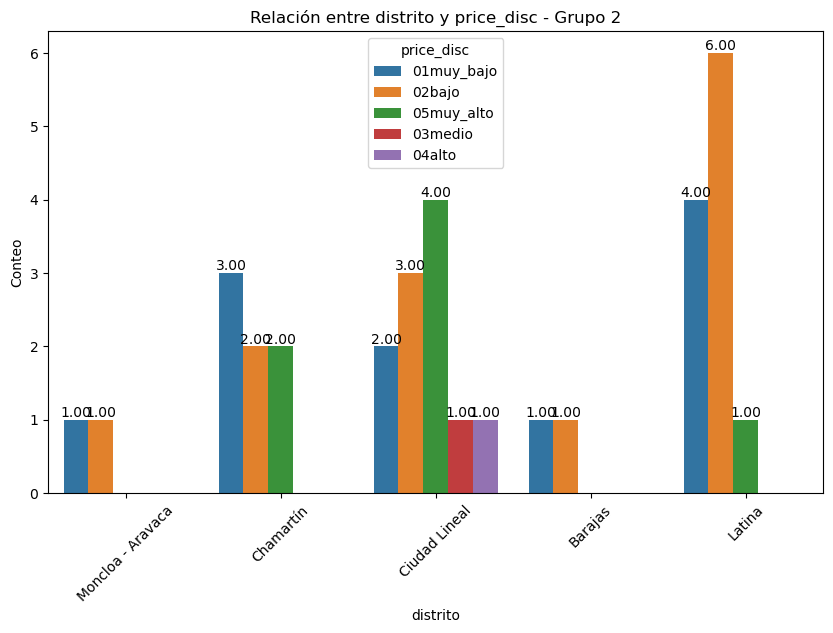

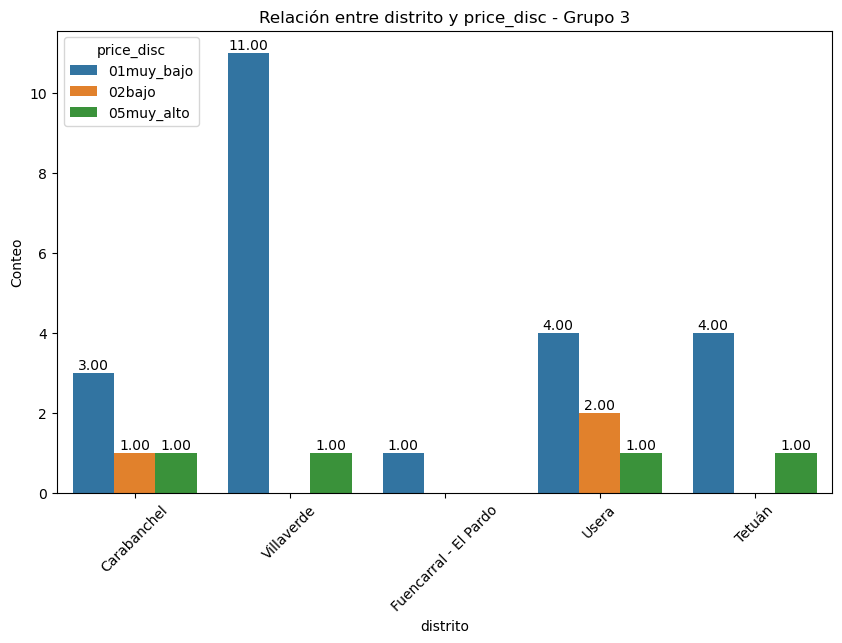

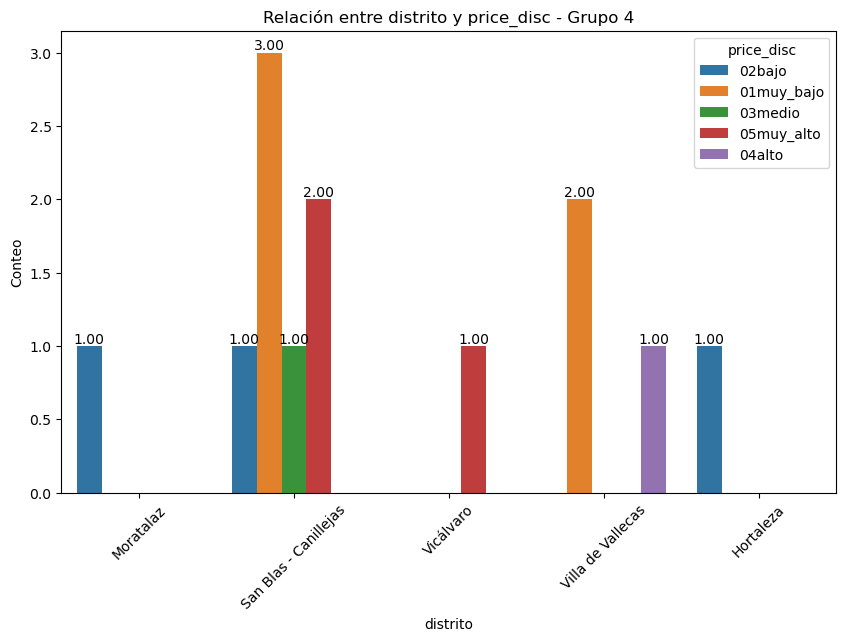

c:\Users\Alfonso\miniconda3\Lib\site-packages\seaborn\categorical.py:645: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  g_vals = grouped_vals.get_group(g)
c:\Users\Alfonso\miniconda3\Lib\site-packages\seaborn\categorical.py:645: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  g_vals = grouped_vals.get_group(g)


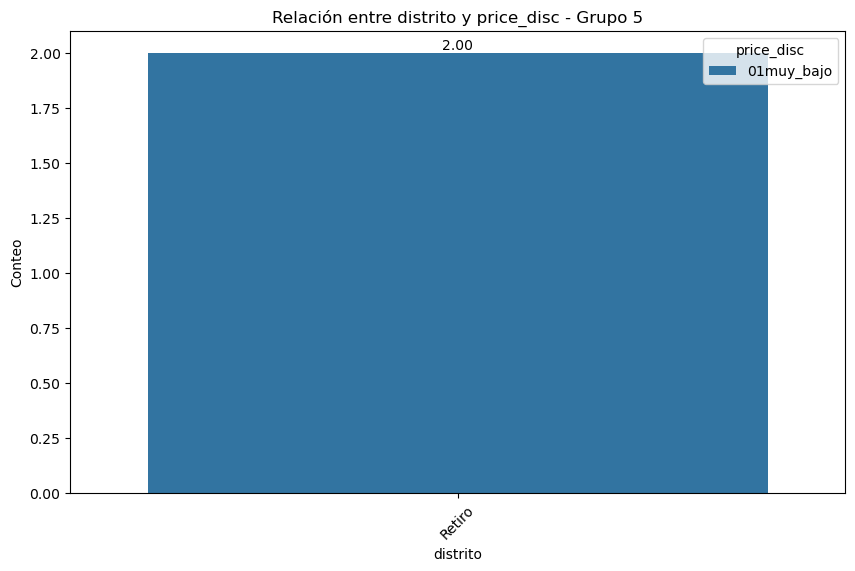

In [159]:
plot_categorical_relationship_fin(df_shared,'distrito','price_disc',show_values=True)

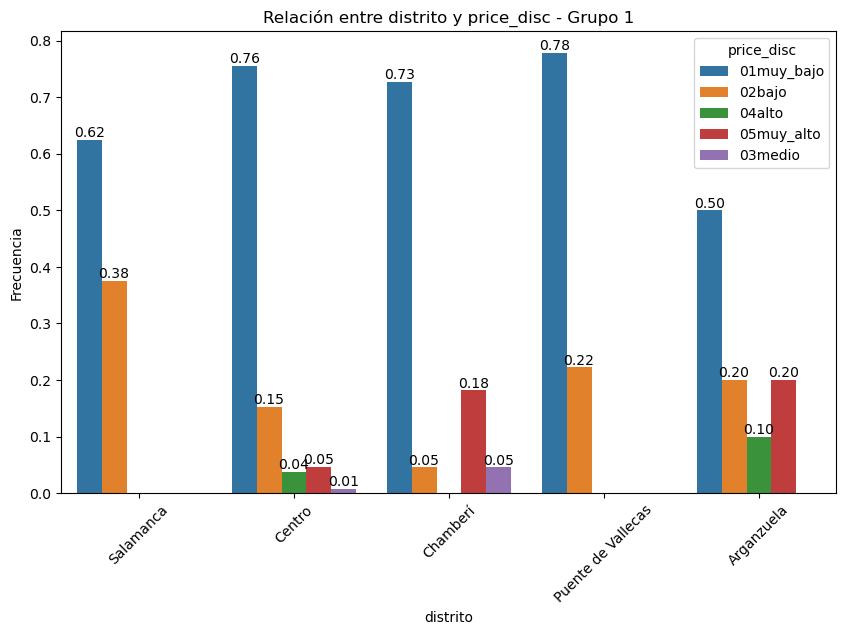

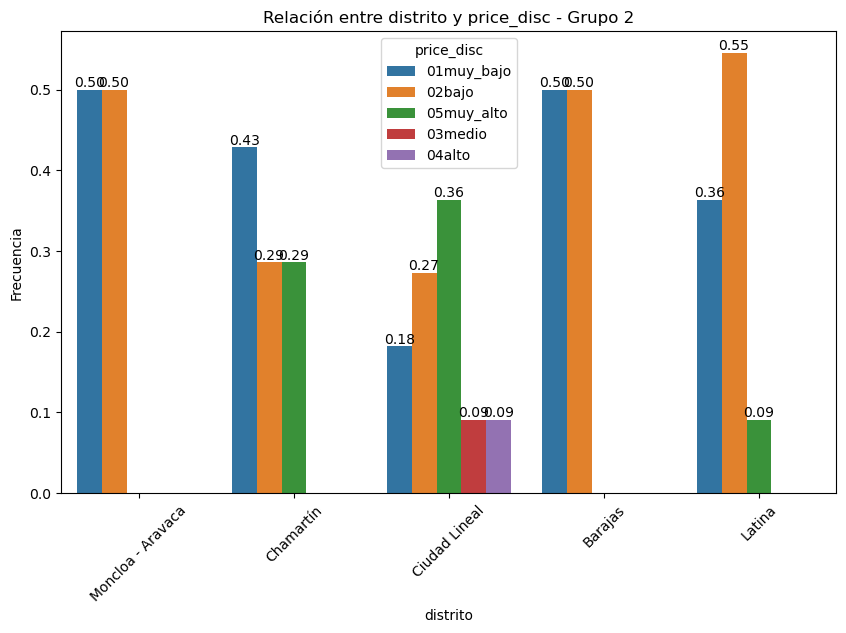

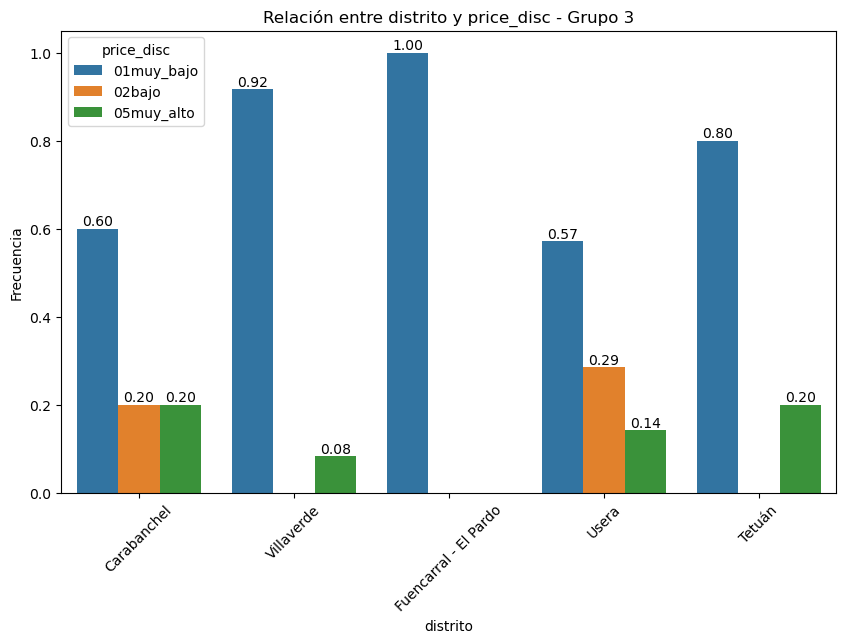

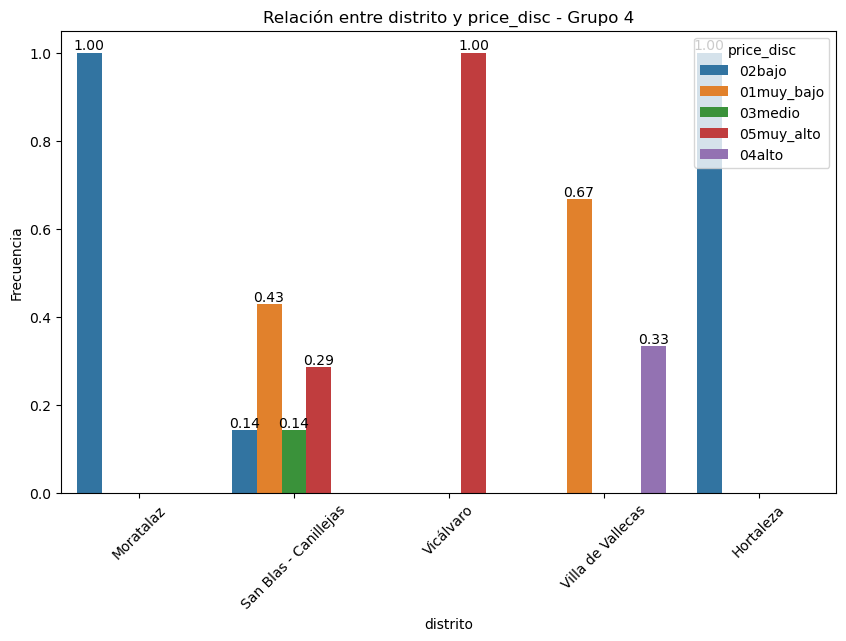

c:\Users\Alfonso\miniconda3\Lib\site-packages\seaborn\categorical.py:645: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  g_vals = grouped_vals.get_group(g)
c:\Users\Alfonso\miniconda3\Lib\site-packages\seaborn\categorical.py:645: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  g_vals = grouped_vals.get_group(g)


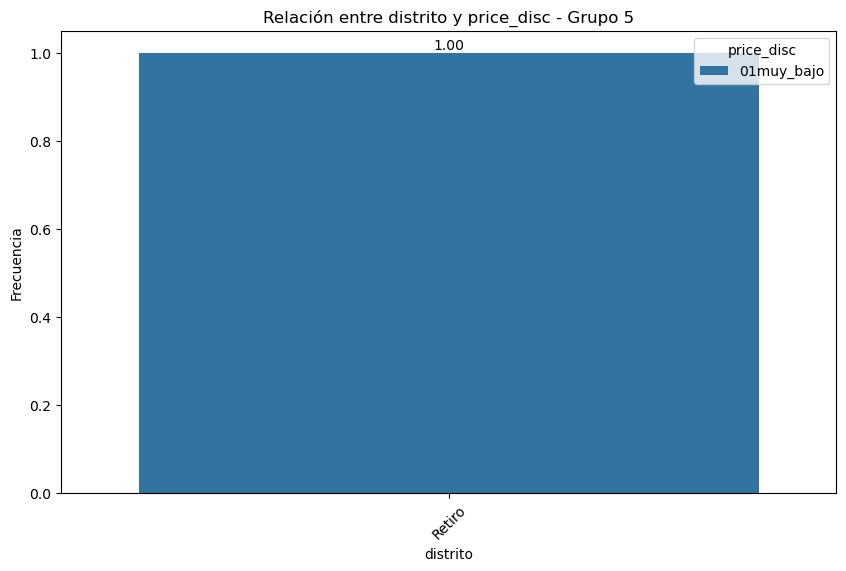

In [160]:
plot_categorical_relationship_fin(df_shared,'distrito','price_disc',show_values=True,relative_freq=True)

In [161]:
correlacion_categoricas(df_shared,'distrito','price_disc')

Valor Chi-Cuadrado: 101.03313193741988
P-Value: 0.05617747619658718
Grados de Libertad: 80
Tabla de Frecuencias Esperadas:
 [[6.70542636e+00 1.82170543e+00 1.55038760e-01 3.10077519e-01
  1.00775194e+00]
 [1.34108527e+00 3.64341085e-01 3.10077519e-02 6.20155039e-02
  2.01550388e-01]
 [3.35271318e+00 9.10852713e-01 7.75193798e-02 1.55038760e-01
  5.03875969e-01]
 [8.78410853e+01 2.38643411e+01 2.03100775e+00 4.06201550e+00
  1.32015504e+01]
 [4.69379845e+00 1.27519380e+00 1.08527132e-01 2.17054264e-01
  7.05426357e-01]
 [1.47519380e+01 4.00775194e+00 3.41085271e-01 6.82170543e-01
  2.21705426e+00]
 [7.37596899e+00 2.00387597e+00 1.70542636e-01 3.41085271e-01
  1.10852713e+00]
 [6.70542636e-01 1.82170543e-01 1.55038760e-02 3.10077519e-02
  1.00775194e-01]
 [6.70542636e-01 1.82170543e-01 1.55038760e-02 3.10077519e-02
  1.00775194e-01]
 [7.37596899e+00 2.00387597e+00 1.70542636e-01 3.41085271e-01
  1.10852713e+00]
 [1.34108527e+00 3.64341085e-01 3.10077519e-02 6.20155039e-02
  2.01550388e-

#### Precio discretizado por propietario discretizado

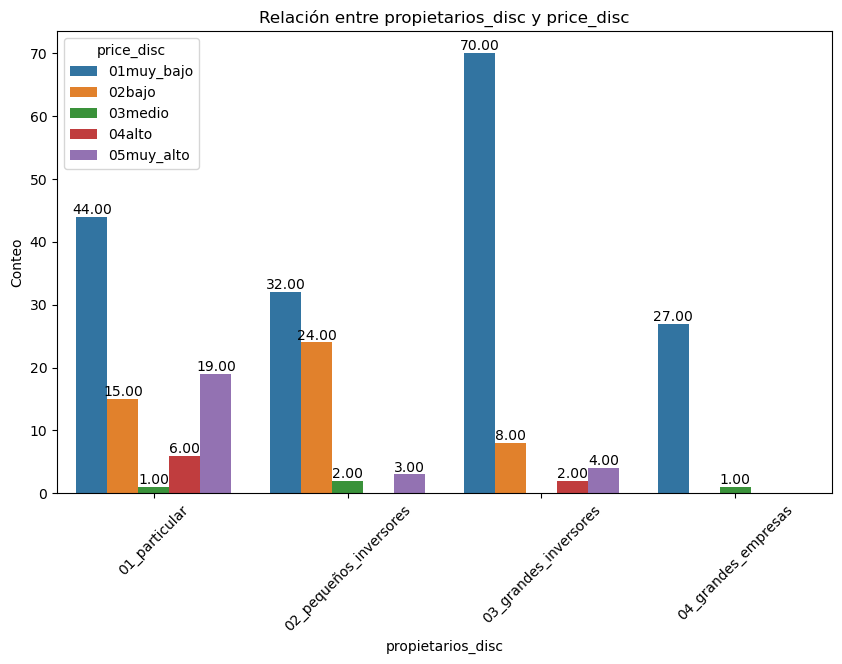

In [162]:
plot_categorical_relationship_fin(df_shared,'propietarios_disc','price_disc',show_values=True)

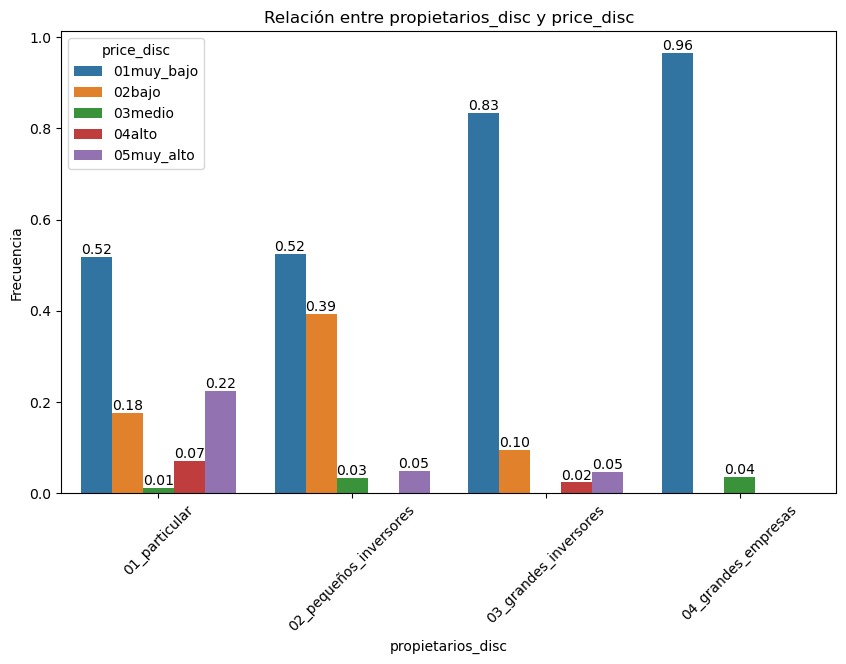

In [163]:
plot_categorical_relationship_fin(df_shared,'propietarios_disc','price_disc',show_values=True,relative_freq=True)

In [164]:
correlacion_categoricas(df_shared,'propietarios_disc','price_disc')

Valor Chi-Cuadrado: 65.35555650431404
P-Value: 2.3432051183865445e-09
Grados de Libertad: 12
Tabla de Frecuencias Esperadas:
 [[56.99612403 15.48449612  1.31782946  2.63565891  8.56589147]
 [40.90310078 11.1124031   0.94573643  1.89147287  6.14728682]
 [56.3255814  15.30232558  1.30232558  2.60465116  8.46511628]
 [18.7751938   5.10077519  0.43410853  0.86821705  2.82170543]]


#### Precio discretizado por huéspedes discretizado

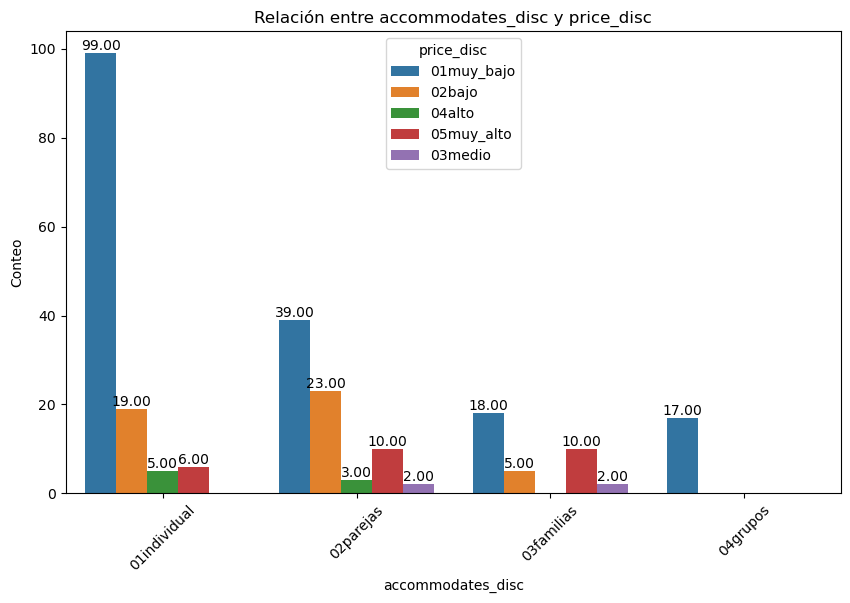

In [165]:
plot_categorical_relationship_fin(df_shared,'accommodates_disc','price_disc',show_values=True)

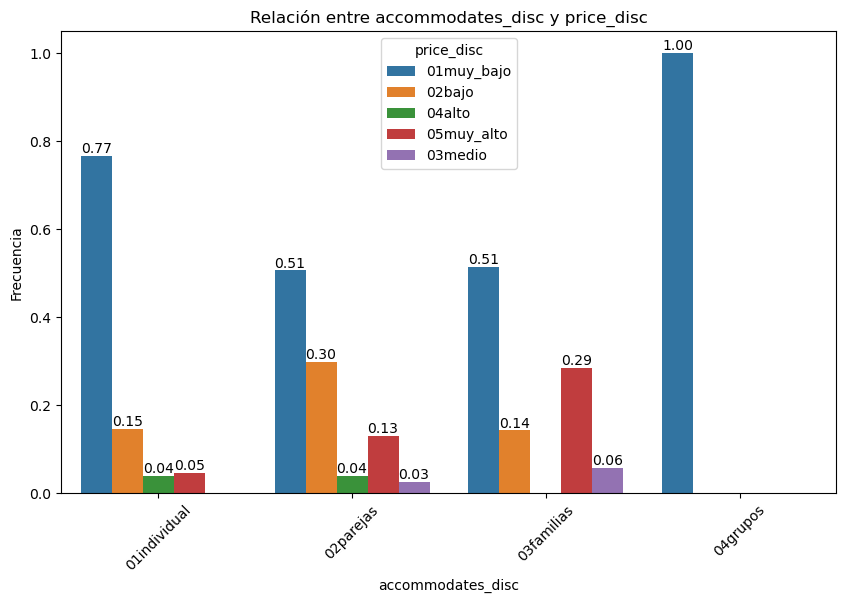

In [166]:
plot_categorical_relationship_fin(df_shared,'accommodates_disc','price_disc',show_values=True,relative_freq=True)

In [167]:
correlacion_categoricas(df_shared,'accommodates_disc','price_disc')

Valor Chi-Cuadrado: 45.66786180244549
P-Value: 7.91439195989248e-06
Grados de Libertad: 12
Tabla de Frecuencias Esperadas:
 [[86.5        23.5         2.          4.         13.        ]
 [51.63178295 14.02713178  1.19379845  2.3875969   7.75968992]
 [23.46899225  6.37596899  0.54263566  1.08527132  3.52713178]
 [11.39922481  3.09689922  0.26356589  0.52713178  1.71317829]]


#### Precio discretizado por segmento de mercado

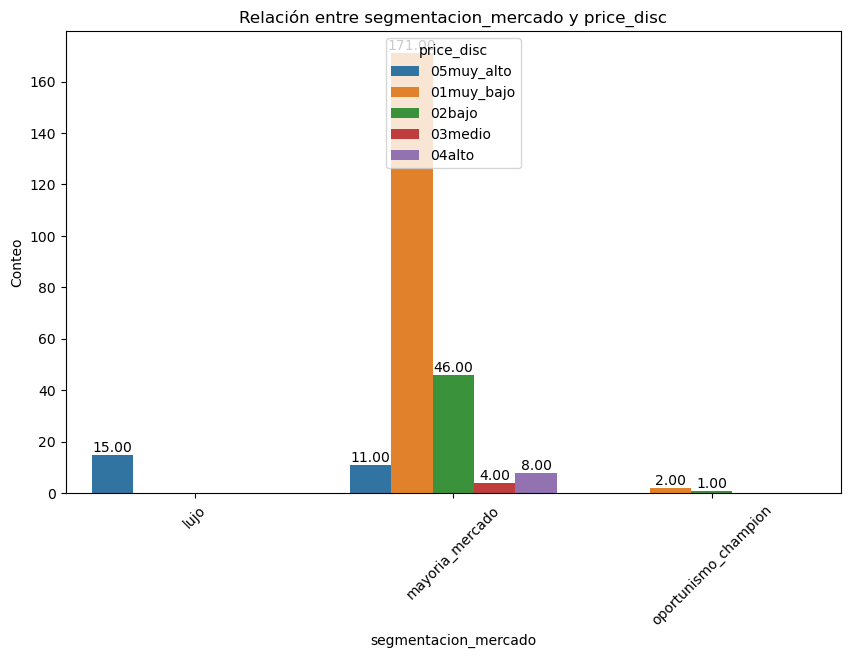

In [168]:
plot_categorical_relationship_fin(df_shared,'segmentacion_mercado','price_disc',show_values=True)

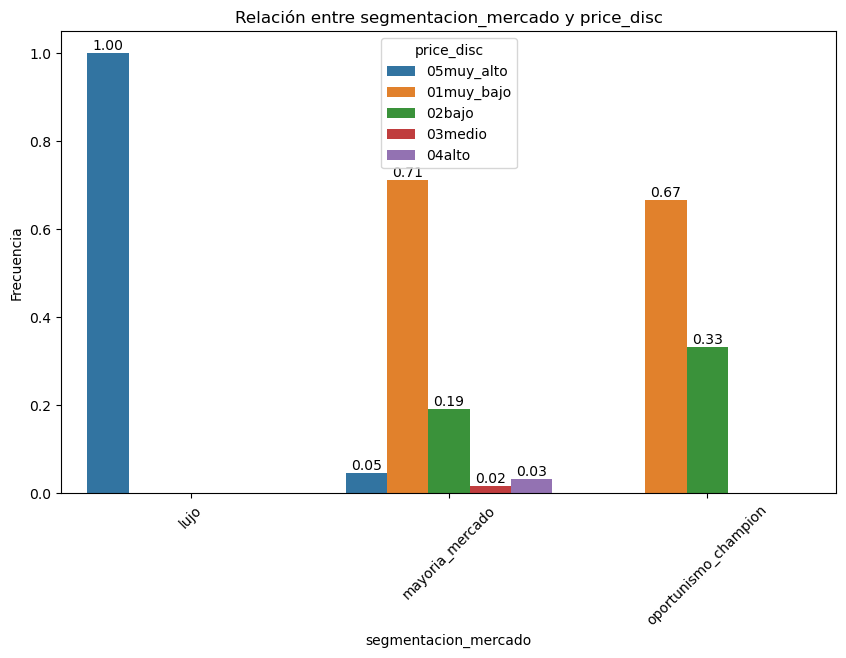

In [169]:
plot_categorical_relationship_fin(df_shared,'segmentacion_mercado','price_disc',show_values=True,relative_freq=True)

In [170]:
correlacion_categoricas(df_shared,'propietarios_disc','price_disc')

Valor Chi-Cuadrado: 65.35555650431404
P-Value: 2.3432051183865445e-09
Grados de Libertad: 12
Tabla de Frecuencias Esperadas:
 [[56.99612403 15.48449612  1.31782946  2.63565891  8.56589147]
 [40.90310078 11.1124031   0.94573643  1.89147287  6.14728682]
 [56.3255814  15.30232558  1.30232558  2.60465116  8.46511628]
 [18.7751938   5.10077519  0.43410853  0.86821705  2.82170543]]


### Variables combinadas

#### Precio por distrito (mediana)

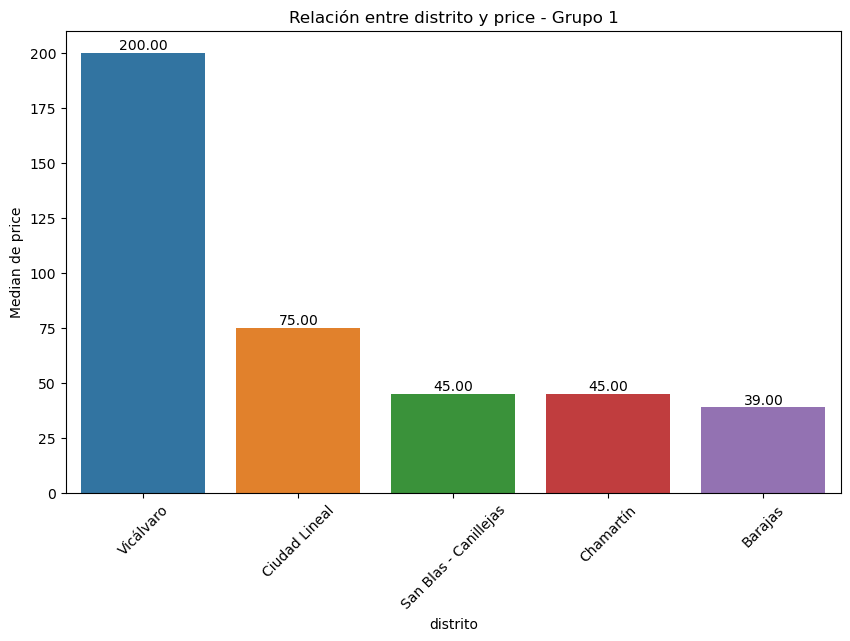

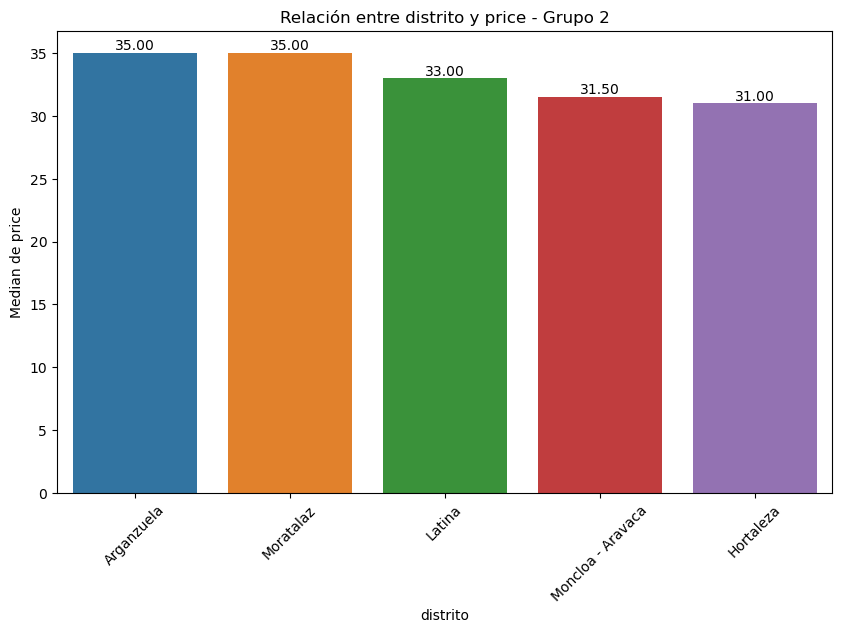

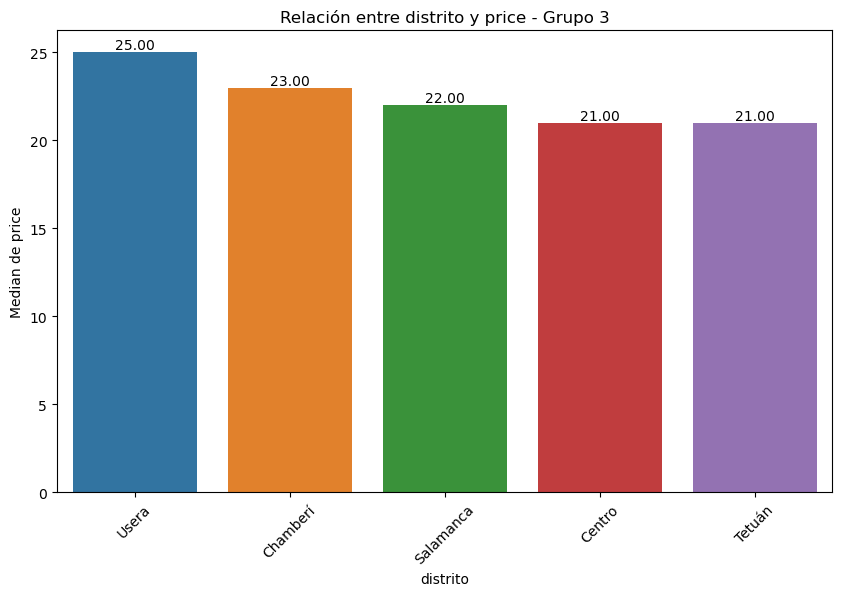

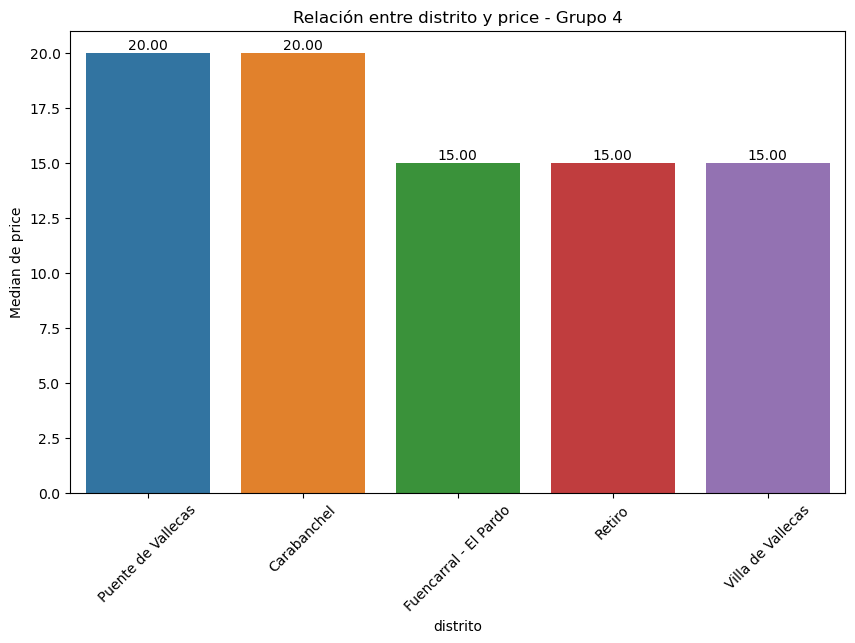

c:\Users\Alfonso\miniconda3\Lib\site-packages\seaborn\categorical.py:645: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  g_vals = grouped_vals.get_group(g)


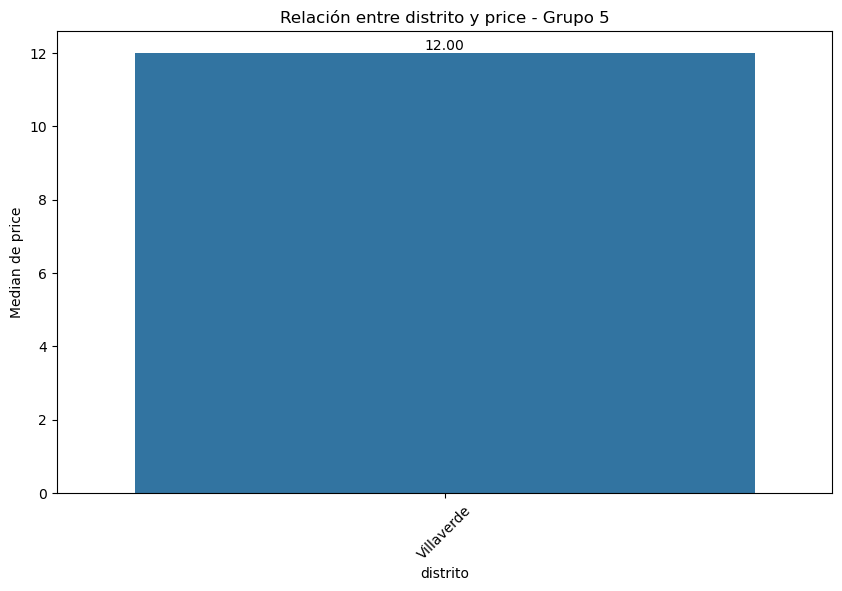

In [171]:
plot_categorical_numerical_relationship(df_shared,'distrito','price', measure='median',show_values=True)

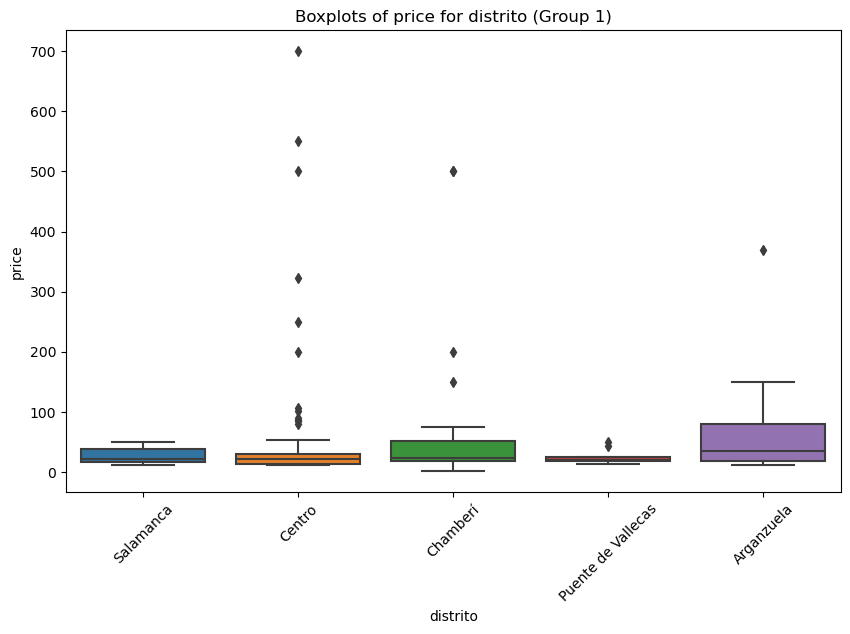

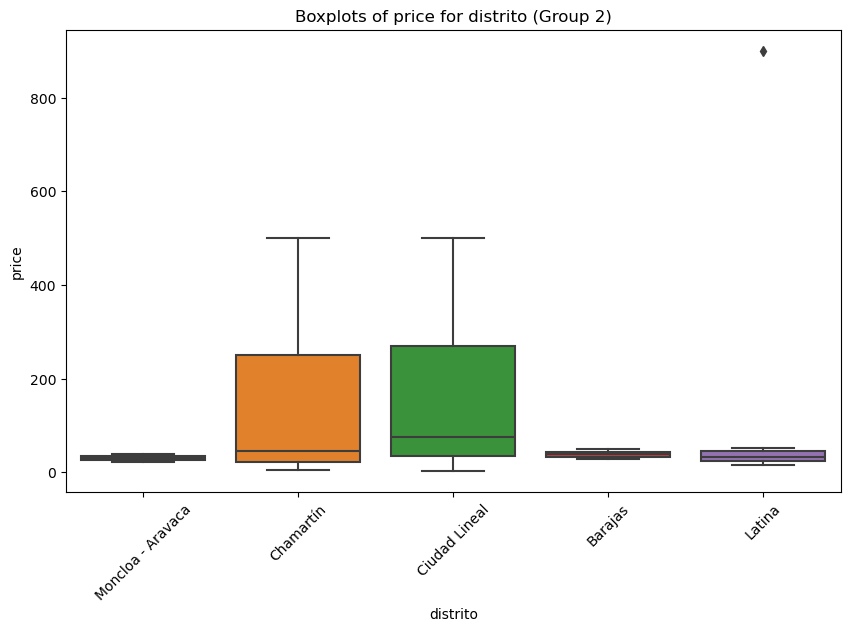

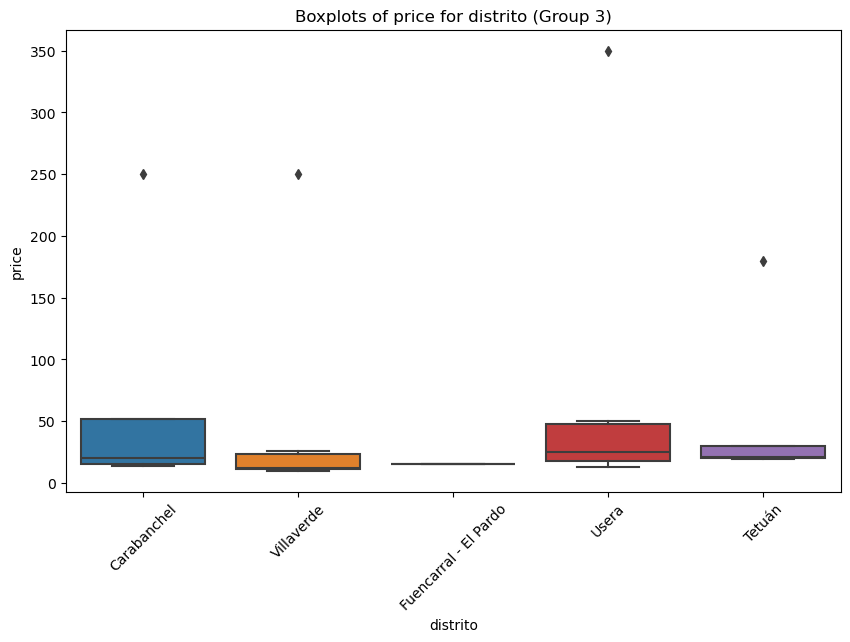

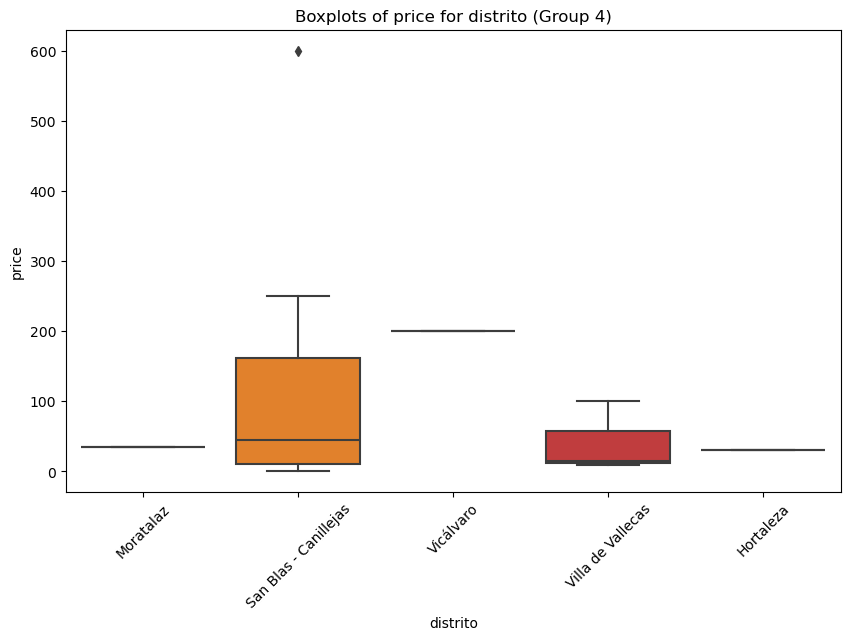

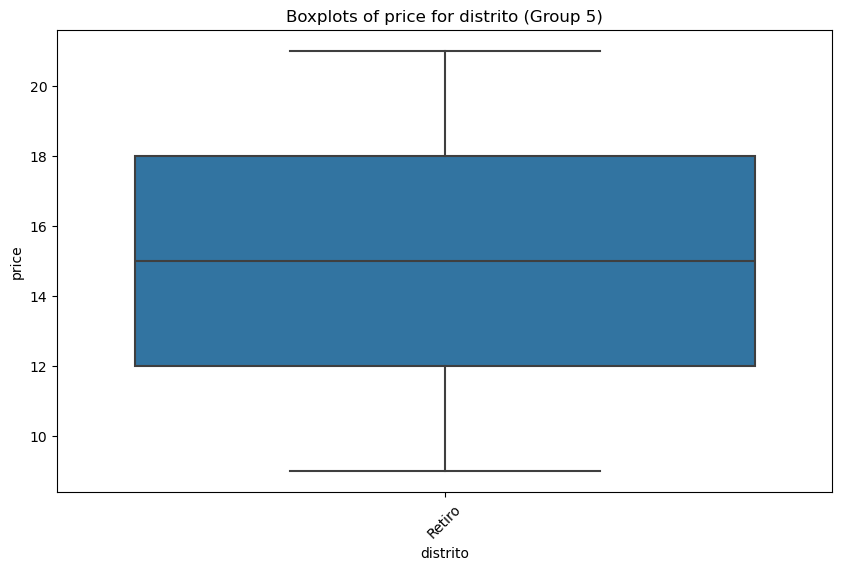

In [172]:
plot_grouped_boxplots(df_shared,'distrito','price')

In [173]:
# Test de ANOVA
test_anova(df_shared,'distrito','price')

Valor F: 1.2213751205275756
Valor p: 0.23727435833710517


La prueba ANOVA da como resultado que hay diferencias significativas en al menos una de las medias.

In [174]:
test_tukey_hsd(df_shared,'distrito','price')

                 Multiple Comparison of Means - Tukey HSD, FWER=0.05                  
        group1                group2         meandiff p-adj    lower    upper   reject
--------------------------------------------------------------------------------------
           Arganzuela               Barajas     -40.5    1.0 -377.5047 296.5047  False
           Arganzuela           Carabanchel      -9.3    1.0 -247.5983 228.9983  False
           Arganzuela                Centro  -35.6603    1.0 -178.3965 107.0759  False
           Arganzuela             Chamartín   76.8183 0.9994 -137.5871 291.2237  False
           Arganzuela              Chamberí    2.2955    1.0 -163.6342 168.2251  False
           Arganzuela         Ciudad Lineal   78.3182 0.9963 -111.7781 268.4145  False
           Arganzuela Fuencarral - El Pardo     -64.5    1.0 -520.8065 391.8065  False
           Arganzuela             Hortaleza     -48.5    1.0 -504.8065 407.8065  False
           Arganzuela                Latina

#### Precio por tipo de oferta (mediana)

c:\Users\Alfonso\miniconda3\Lib\site-packages\seaborn\categorical.py:645: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  g_vals = grouped_vals.get_group(g)


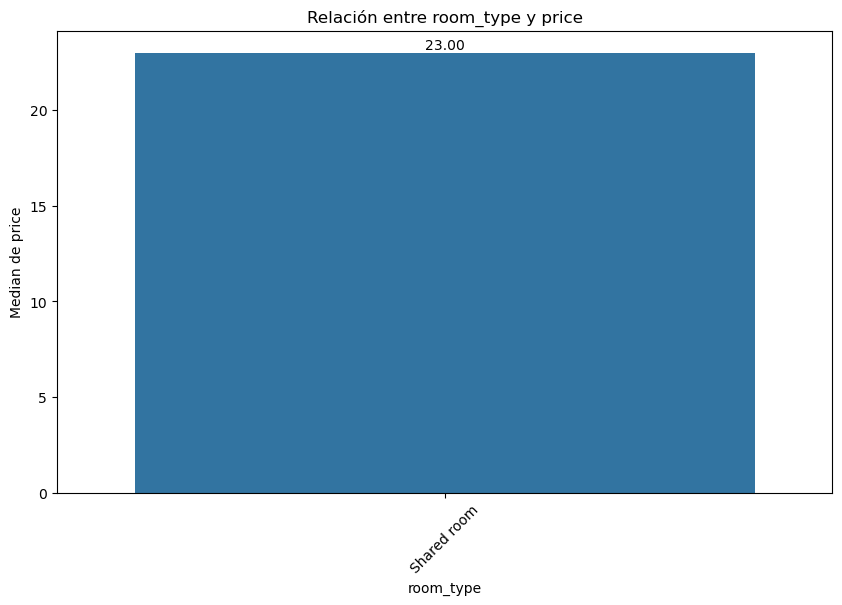

In [175]:
plot_categorical_numerical_relationship(df_shared,'room_type','price', measure='median',show_values=True)

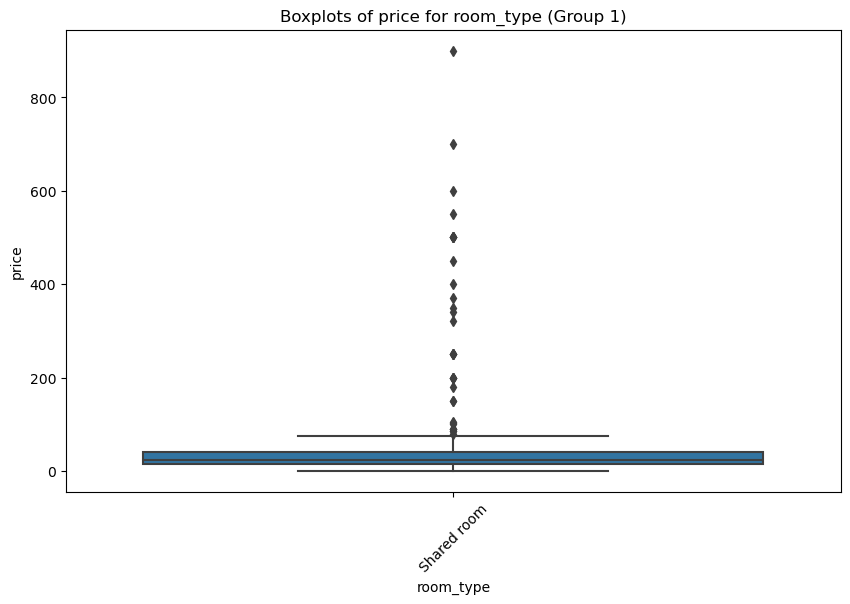

In [176]:
plot_grouped_boxplots(df_shared,'room_type','price')

#### Precio por huéspedes_discretizado (mediana)

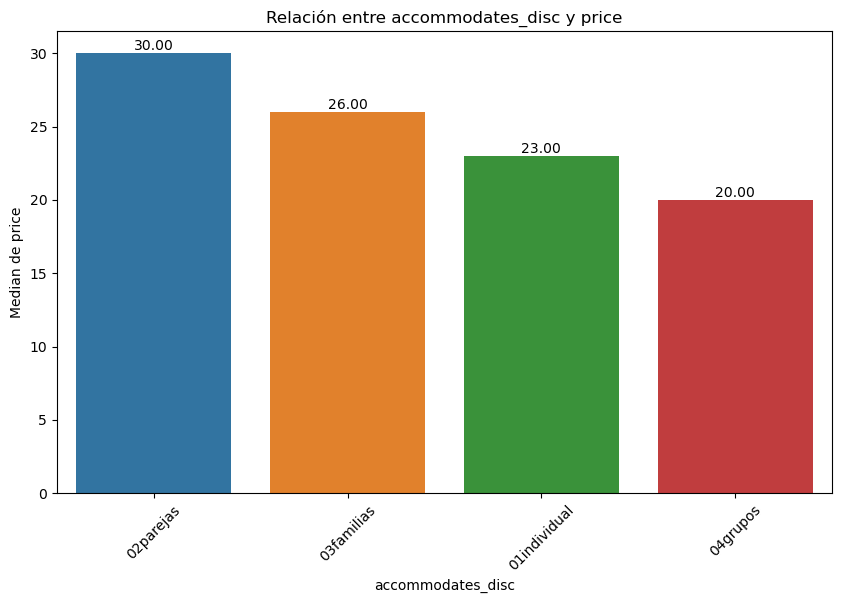

In [177]:
plot_categorical_numerical_relationship(df_shared,'accommodates_disc','price', measure='median',show_values=True)

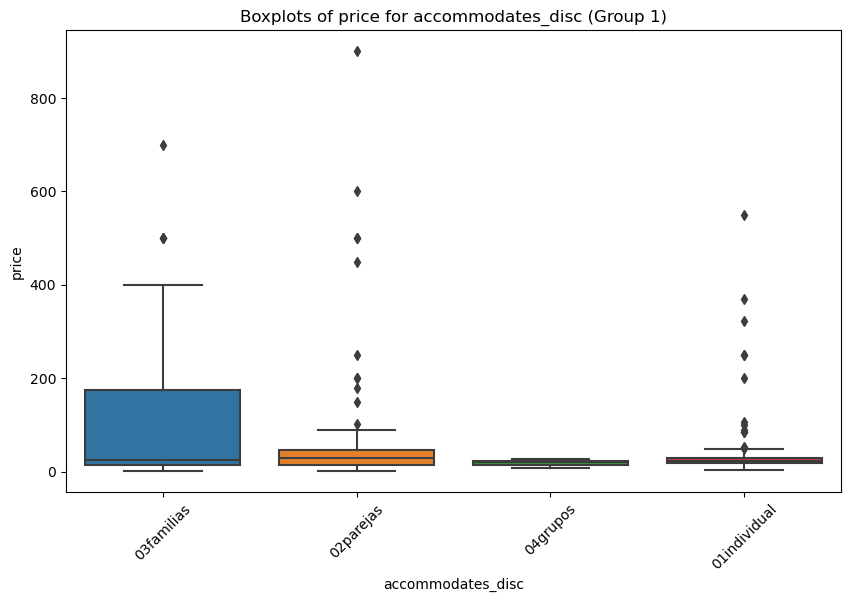

In [178]:
plot_grouped_boxplots(df_shared,'accommodates_disc','price')

In [179]:
# Test ANOVA
test_anova(df_shared,'accommodates','price')

Valor F: 4.075468306813391
Valor p: 0.00029653794320904075


In [180]:
# Test de Tukey
test_tukey_hsd(df_shared,'accommodates','price')

  Multiple Comparison of Means - Tukey HSD, FWER=0.05   
group1 group2  meandiff p-adj    lower    upper   reject
--------------------------------------------------------
     1      2   37.7857 0.3273  -13.6043  89.1756  False
     1      3   33.0779 0.9857  -79.0098 145.1655  False
     1      4   85.2604 0.0764   -4.5264 175.0473  False
     1      5  205.8354 0.0009   56.8028 354.8681   True
     1      6  -25.1169 0.9993 -163.6044 113.3706  False
     1      8  -17.4027 0.9999 -155.8902 121.0848  False
     1     10  -17.1646    1.0 -225.5736 191.2444  False
     2      3   -4.7078    1.0 -119.7308 110.3152  False
     2      4   47.4748 0.7774  -45.9507 140.9002  False
     2      5  168.0498 0.0178   16.7971 319.3025   True
     2      6  -62.9026 0.8722 -203.7764  77.9712  False
     2      8  -55.1883 0.9321 -196.0621  85.6855  False
     2     10  -54.9502  0.993 -264.9525 155.0521  False
     3      4   52.1826 0.9402  -84.3862 188.7513  False
     3      5  172.7576 0.0737 

#### Precio por propietarios_disc (median)

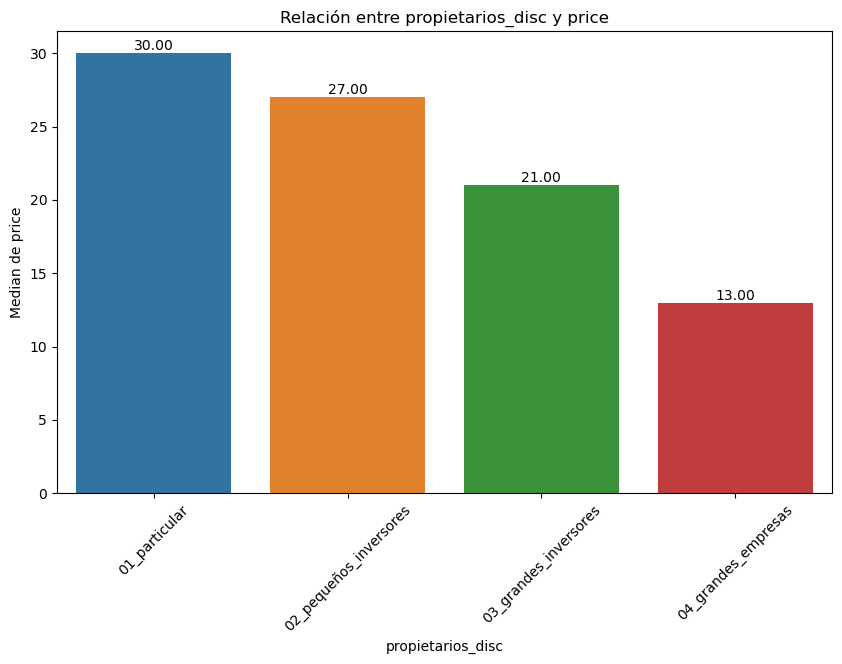

In [181]:
plot_categorical_numerical_relationship(df_shared,'propietarios_disc','price', measure='median',show_values=True)

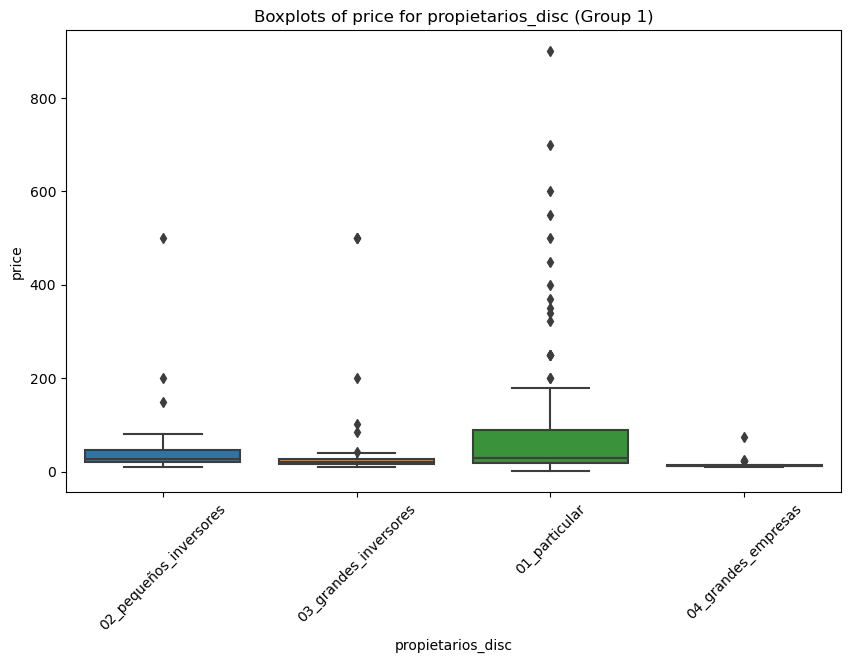

In [182]:
plot_grouped_boxplots(df_shared,'propietarios_disc','price')

In [183]:
# Test ANOVA
test_anova(df_shared,'propietarios_disc','price')

Valor F: 7.02703193674093
Valor p: 0.00014770157343678032


In [184]:
# Test de Tukey
test_tukey_hsd(df_shared,'propietarios_disc','price')

                  Multiple Comparison of Means - Tukey HSD, FWER=0.05                  
        group1                 group2         meandiff p-adj    lower    upper   reject
---------------------------------------------------------------------------------------
         01_particular 02_pequeños_inversores -63.7134 0.0076 -114.6903 -12.7365   True
         01_particular  03_grandes_inversores -65.8334 0.0018  -112.571 -19.0959   True
         01_particular    04_grandes_empresas -91.8692 0.0022 -158.0637 -25.6746   True
02_pequeños_inversores  03_grandes_inversores    -2.12 0.9996  -53.2236  48.9835  False
02_pequeños_inversores    04_grandes_empresas -28.1557 0.7201  -97.5019  41.1905  False
 03_grandes_inversores    04_grandes_empresas -26.0357 0.7404  -92.3279  40.2564  False
---------------------------------------------------------------------------------------


#### Oferta vs precio_m2

c:\Users\Alfonso\miniconda3\Lib\site-packages\seaborn\categorical.py:645: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  g_vals = grouped_vals.get_group(g)


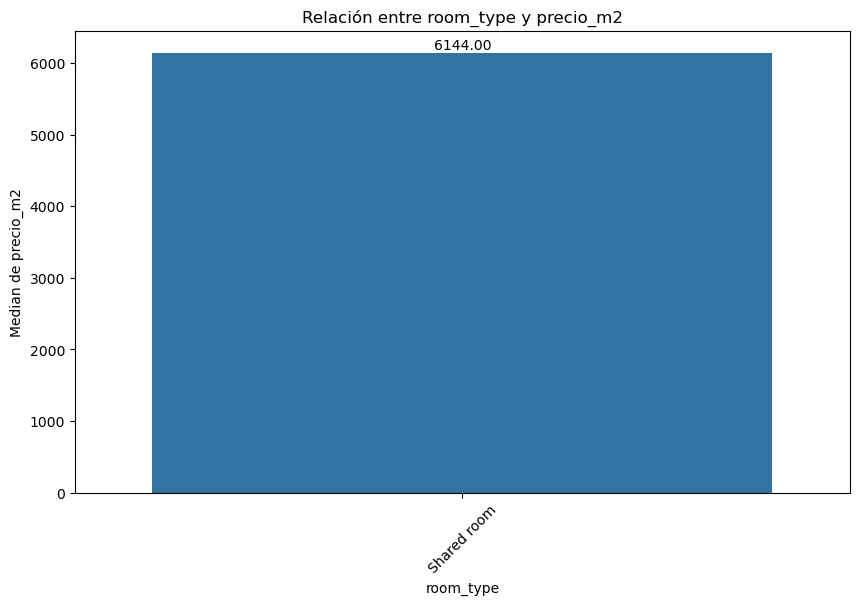

In [185]:
plot_categorical_numerical_relationship(df_shared,'room_type','precio_m2', measure='median',show_values=True)

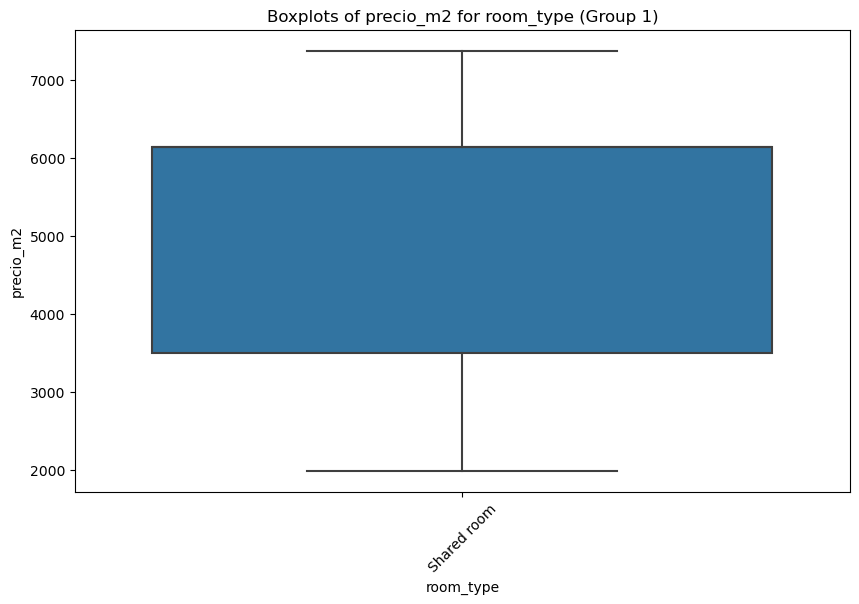

In [186]:
plot_grouped_boxplots(df_shared,'room_type','precio_m2')

### Variables numéricas

In [211]:
columnas_temp = df_shared.select_dtypes(include=['int', 'float']).columns
columnas_temp

Index(['id', 'host_id', 'host_listings_count', 'latitude', 'longitude',
       'accommodates', 'bedrooms', 'beds', 'price', 'minimum_nights',
       'maximum_nights', 'number_of_reviews', 'review_scores_rating',
       'calculated_host_listings_count', 'bathrooms', 'precio_m2',
       'price_accommodates', 'price_bedrooms', 'antiguedad_host'],
      dtype='object')

In [218]:
columnas_numericas = [ 'latitude', 'longitude','accommodates', 'beds', 'price', 'minimum_nights',
       'number_of_reviews', 'review_scores_rating',
       'bathrooms', 'precio_m2',
       'price_accommodates', 'price_bedrooms', 'antiguedad_host']

In [219]:
corr_matrix = df_shared[columnas_numericas].corr()
corr_matrix

,latitude,longitude,accommodates,beds,price,minimum_nights,number_of_reviews,review_scores_rating,bathrooms,precio_m2,price_accommodates,price_bedrooms,antiguedad_host
latitude,1.000000,0.203276,0.045883,0.063604,0.091272,0.046186,0.021260,0.097220,0.059982,0.523748,0.037408,0.052044,0.123931
longitude,0.203276,1.000000,-0.044551,-0.167598,0.086045,0.076148,-0.029263,0.035463,-0.115420,-0.204570,0.067665,0.102947,-0.009928
accommodates,0.045883,-0.044551,1.000000,0.376937,0.083065,0.029968,0.083417,-0.009646,0.011334,0.113890,-0.121137,-0.037668,0.117751
beds,0.063604,-0.167598,0.376937,1.000000,-0.142226,-0.017873,0.010397,0.109198,0.431196,0.353278,-0.213865,-0.245856,0.142813
price,0.091272,0.086045,0.083065,-0.142226,1.000000,0.079072,-0.104369,-0.029474,-0.169175,-0.093052,0.848879,0.882918,-0.012033
minimum_nights,0.046186,0.076148,0.029968,-0.017873,0.079072,1.000000,-0.040787,-0.259216,-0.047073,-0.025839,0.012843,0.003343,0.037530
number_of_reviews,0.021260,-0.029263,0.083417,0.010397,-0.104369,-0.040787,1.000000,0.073303,-0.050587,0.071166,-0.090972,-0.091034,0.129039
review_scores_rating,0.097220,0.035463,-0.009646,0.109198,-0.029474,-0.259216,0.073303,1.000000,0.006777,0.119551,-0.044226,-0.027403,0.126431
bathrooms,0.059982,-0.115420,0.011334,0.431196,-0.169175,-0.047073,-0.050587,0.006777,1.000000,0.240590,-0.166456,-0.178537,-0.045829
precio_m2,0.523748,-0.204570,0.113890,0.353278,-0.093052,-0.025839,0.071166,0.119551,0.240590,1.000000,-0.089205,-0.165372,0.229531


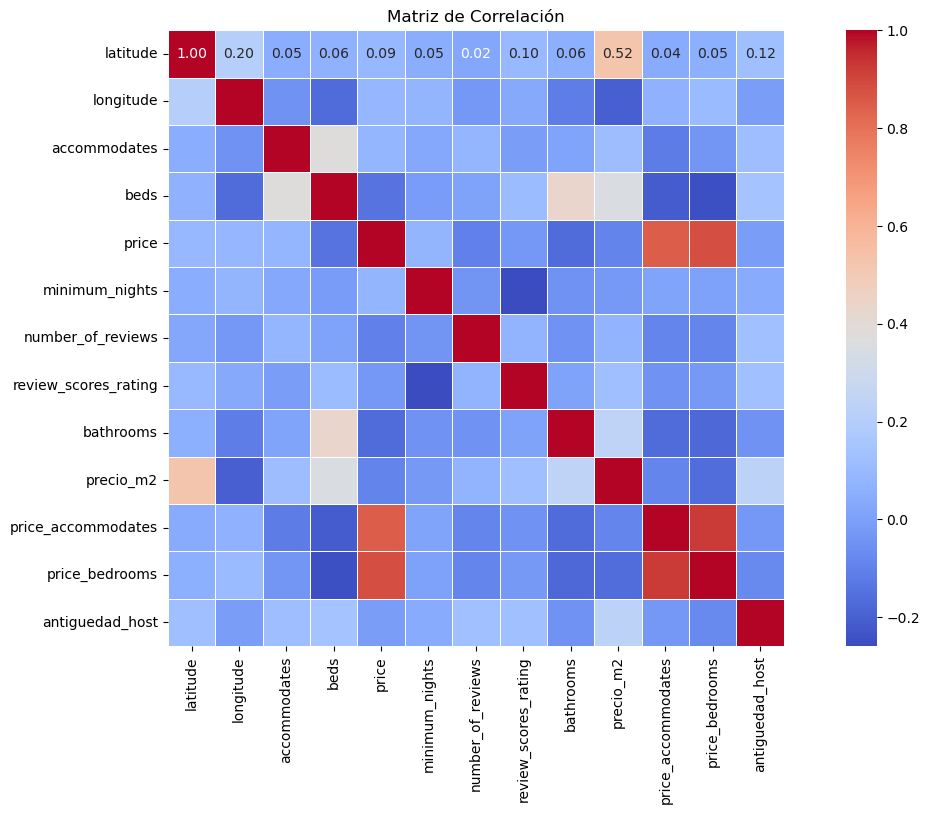

In [220]:
plt.figure(figsize=(16, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm',fmt=".2f", cbar=True, square=True, linewidths=.5)
plt.title('Matriz de Correlación')
plt.xticks(fontsize=10)  
plt.yticks(fontsize=10) 

plt.show()

- De nuevo curioso que existe una relación positiva entre precio_m2 y latitud e inversa entre precio_m2 y longitud
- Del resto de las variables, quitando las que están relacionadas entre sí por dependencia a la hora de sacar unas de otras, el resto no tiene mucha correlación entre sí.

#### Precio por precio_m2

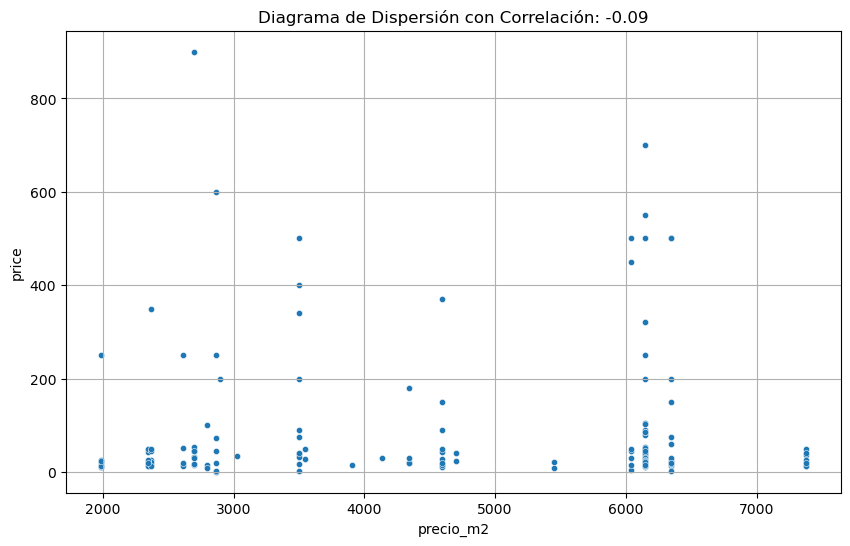

In [187]:
grafico_dispersion_con_correlacion(df_shared,'precio_m2','price',20, mostrar_correlacion=True)

In [188]:
# Paso la correlación (Kendal, según el tamaño de la muestra)
correlacion_numericas(df_shared,'precio_m2','price')

Correlación no paramétrica (Spearman): -0.045862590478061994


#### Precio vs habitaciones

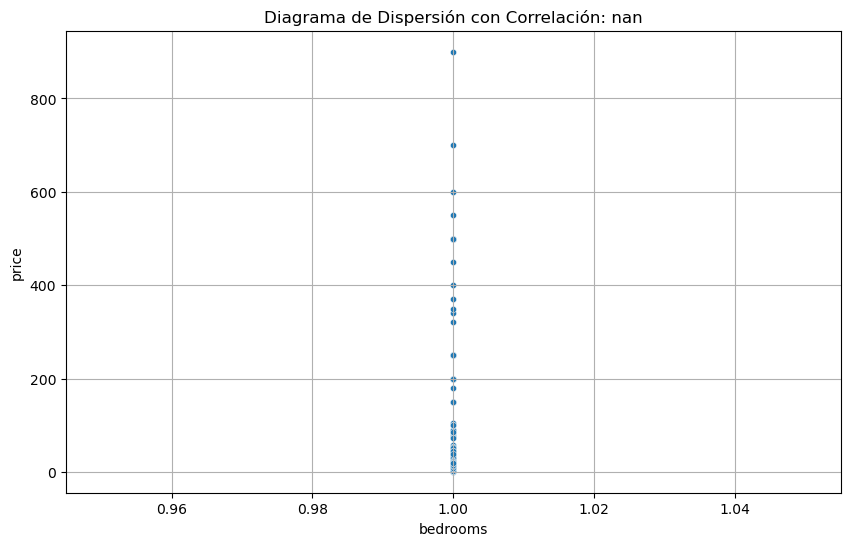

In [189]:
grafico_dispersion_con_correlacion(df_shared,'bedrooms','price',20, mostrar_correlacion=True)

In [190]:
# Paso la correlación (Kendal, según el tamaño de la muestra)
correlacion_numericas(df_shared,'bedrooms','price')

Correlación no paramétrica (Spearman): nan


C:\Users\Alfonso\AppData\Local\Temp\ipykernel_11832\1990776667.py:4: UserWarning: scipy.stats.shapiro: Input data has range zero. The results may not be accurate.
  _, p1 = shapiro(df[var_num1])
C:\Users\Alfonso\AppData\Local\Temp\ipykernel_11832\1990776667.py:14: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p_value = spearmanr(df[var_num1], df[var_num2])


#### Precio vs camas

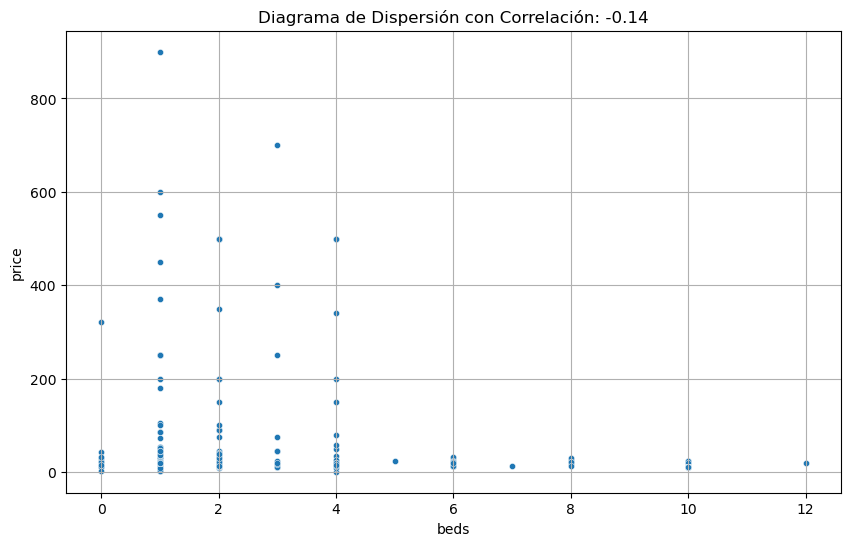

In [191]:
grafico_dispersion_con_correlacion(df_shared,'beds','price',20, mostrar_correlacion=True)

In [192]:
# Paso la correlación (Kendal, según el tamaño de la muestra)
correlacion_numericas(df_shared,'beds','price')

Correlación no paramétrica (Spearman): -0.2897577422713776


#### Precio vs accommodates

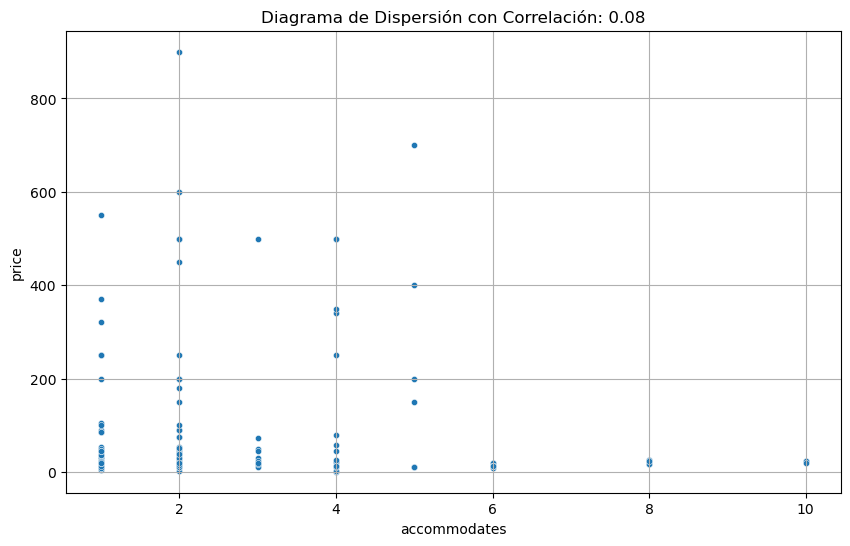

In [193]:
grafico_dispersion_con_correlacion(df_shared,'accommodates','price',20, mostrar_correlacion=True)

In [194]:
# Paso la correlación (Kendal, según el tamaño de la muestra)
correlacion_numericas(df_shared,'accommodates','price')

Correlación no paramétrica (Spearman): 0.03695300754328574


#### Precio vs número de reviews

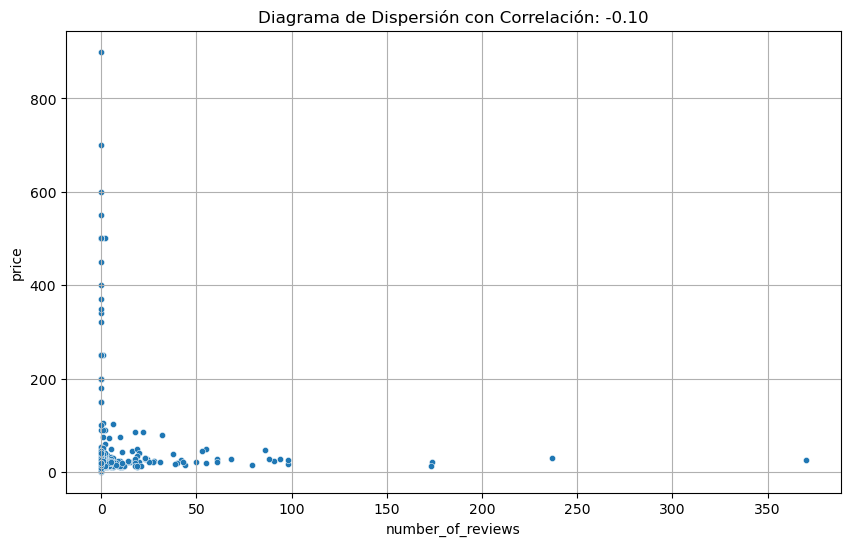

In [195]:
grafico_dispersion_con_correlacion(df_shared,'number_of_reviews','price',20, mostrar_correlacion=True)

In [196]:
# Paso la correlación (Kendal, según el tamaño de la muestra)
correlacion_numericas(df_shared,'number_of_reviews','price')

Correlación no paramétrica (Spearman): -0.2200444367230719


#### Precio vs valoraciones


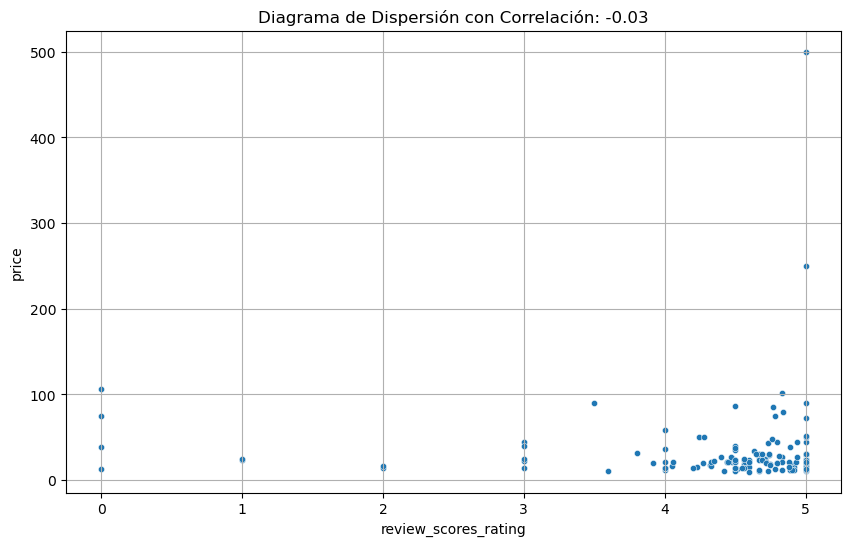

In [197]:
grafico_dispersion_con_correlacion(df_shared,'review_scores_rating','price',20, mostrar_correlacion=True)

In [198]:
# Paso la correlación (Kendal, según el tamaño de la muestra)
correlacion_numericas(df_shared,'review_scores_rating','price')

Correlación no paramétrica (Spearman): nan


_____

### Precio alquiler vs precio estimado del inmueble 

(2,)


c:\Users\Alfonso\miniconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


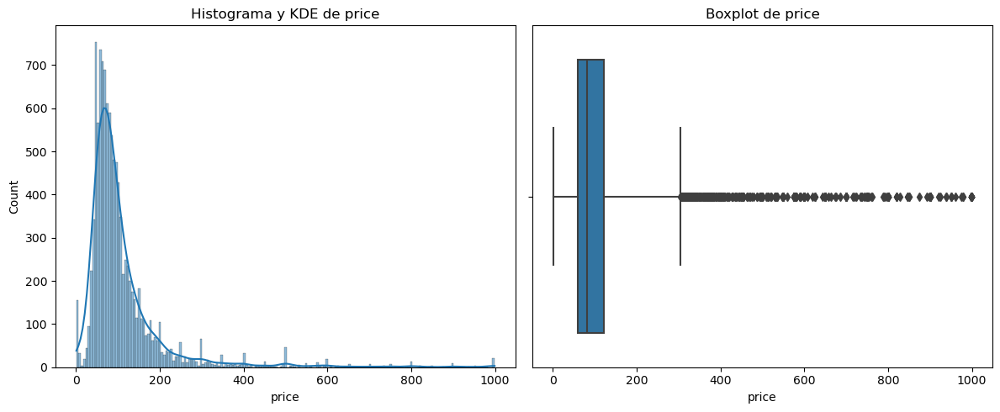

In [199]:
# Variable numérica precio
plot_combined_graphs(df_home,['price'],whisker_width=3)

(2,)


c:\Users\Alfonso\miniconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


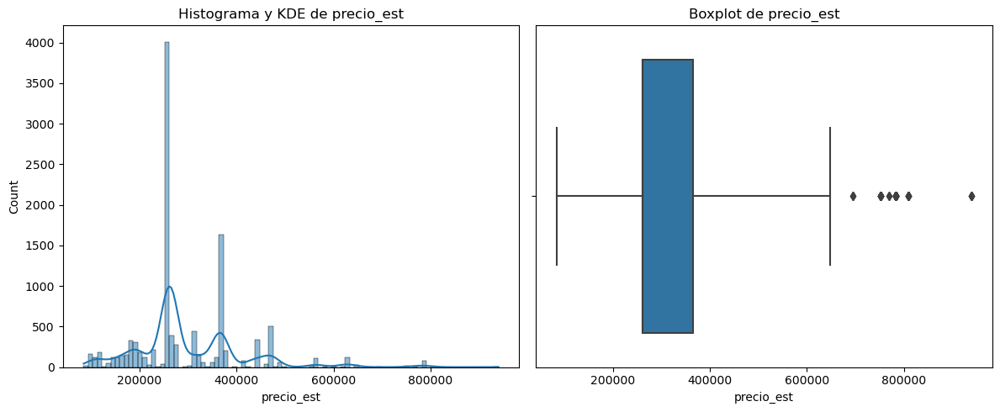

In [200]:
plot_combined_graphs(df_home,['precio_est'],whisker_width=3)

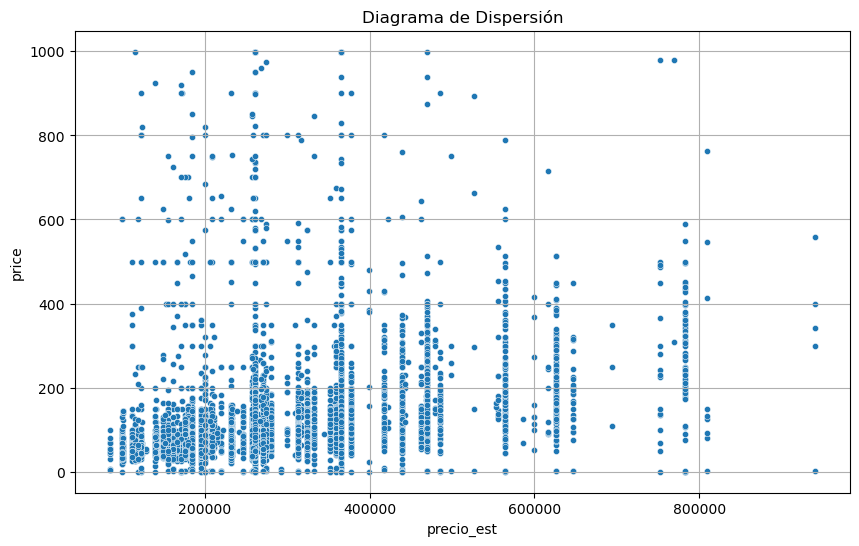

In [201]:
grafico_dispersion_con_correlacion(df_home,"precio_est",'price',20)

In [202]:
determinar_correlacion(df_home,'price','precio_est')

NameError: name 'determinar_correlacion' is not defined

Comentarios:  
- Parece existir una cierta relación entre mayor precio del inmueble y mayor precio de alquiler, si bien no es muy elevada.
- Se puede observar que para un mismo precio estimado de compra del inmueble el precio de los alquileres es muy dispar.

### Precio medio por distrito

In [ ]:
df_home.groupby('distrito')[["price"]].median().round(2)

,price
distrito,
Arganzuela,72.0
Barajas,75.0
Carabanchel,69.0
Centro,85.0
Chamartín,81.5
Chamberí,90.5
Ciudad Lineal,72.0
Fuencarral - El Pardo,75.0
Hortaleza,80.0


C:\Users\Alfonso\AppData\Local\Temp\ipykernel_8212\2830003077.py:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.text(temp.precio_est.iloc[distrito],temp.price[distrito],temp.index[distrito])


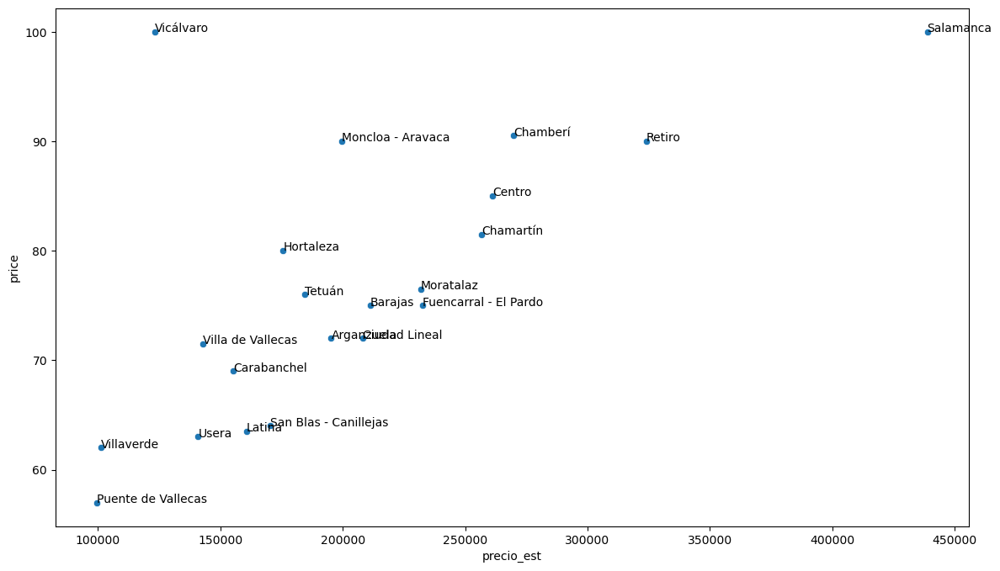

In [ ]:
temp = df_home.groupby('distrito')[["price","precio_est"]].median().round(2)
plt.figure(figsize=(14,8))
sns.scatterplot(x='precio_est',y= 'price',data = temp)
# pongo etiquetas
for distrito in range(0,temp.shape[0]):
    plt.text(temp.precio_est.iloc[distrito],temp.price[distrito],temp.index[distrito])

Comentarios:
- Como se ha visto anteriormente exiten diferentes precios de alquiler para un mismo precio de compra del inmuble.

In [ ]:
df_home.columns

Index(['id', 'host_id', 'host_is_superhost', 'name', 'host_name', 'amenities',
       'host_listings_count', 'neighbourhood_cleansed',
       'neighbourhood_group_cleansed', 'latitude', 'longitude',
       'property_type', 'room_type', 'accommodates', 'bedrooms', 'beds',
       'price', 'minimum_nights', 'maximum_nights', 'number_of_reviews',
       'review_scores_rating', 'calculated_host_listings_count', 'bathrooms',
       'distrito', 'precio_m2', 'price_disc', 'accommodates_disc',
       'propietarios_disc', 'price_accommodates', 'price_bedrooms', 'champion',
       'segmentacion_mercado', 'sup_m2_est', 'precio_est', 'price_x_sup'],
      dtype='object')

In [ ]:
# Reviso los datos de Vicálvaro dado que es raro
df_home.loc[df_home.distrito == "Vicálvaro",['price','name','number_of_reviews','review_scores_rating']].sort_values('price')

,price,name,number_of_reviews,review_scores_rating
448,43.0,Disinfected - Octavio's modern loft! 2 bathrooms,165,4.68
9296,53.0,"Luminoso apartamento - loft, moderno y acogedor",64,4.56
12704,60.0,Loft con parking a 10 minutos de aeropuerto ifema,8,5.00
3527,61.0,Modern loft with parking 10min from IFEMA by car,248,4.50
1272,70.0,Minimalist loft in Residential Area,31,4.78
16999,99.0,EdSam BLACK&GREY MADRID,10,4.50
9391,100.0,Perfect family flat / Faunia/ Swimming pool,70,4.81
9566,120.0,"IMPRESIONANTE LOFT, MADRID, JUNTO AL RECINTO I...",1,5.00
3858,150.0,MInimalist home Madrid,16,4.93
1615,169.0,Spectacular Apartment in Madrid,0,NaN


In [ ]:
df_home.loc[df_home.distrito == "Moncloa - Aravaca",['price','name','number_of_reviews','review_scores_rating']].sort_values('price')

,price,name,number_of_reviews,review_scores_rating
10711,1.000,Flat in Ciudad Universitaria. Stadium transfer.,0,NaN
10795,1.000,FINAL CHAMPIONS LEAGUE RENT A MOTOR HOME,0,NaN
7662,1.139,Loft Princess,9,4.22
11643,1.143,"Perfect location, relaxing green area, near me...",22,4.55
3290,8.000,Madrid Rent 5,8,4.75
...,...,...,...,...
9049,369.000,Princesa IX (10 PAX),13,4.54
3706,371.000,Delux Plaza de España-Principe Pio,73,4.69
8027,416.000,Amazing apt in front of Plaza de España,42,4.62
5583,575.000,Fantastic Studio in Princesa Street by Allô Ho...,8,4.50


#### Factor Champion

OBSERVACIONES: Tenemos de nuevo el problema del acontecimiento puntual de la final de la Champion. Voy a averiguar hasta qué punto está influyendo haciendo un análisis sin los datos de este acontecimiento.

In [ ]:
# Transformo toda la columna a minúsculas por lo que el problema del formato estaría solucionado
df_home.loc[:,'name'] = df_home['name'].str.lower()

In [ ]:
df_home.name.head(5)

2    apartmento arganzuela- madrid rio
3               gran via studio madrid
5    apartamento arganzuela planetario
6          great vacational apartments
8      beautiful loft in madrid center
Name: name, dtype: object

In [ ]:
# Las columnas sin datos se rellenan con "sin_datos" y luego se crea una nueva columna con boleanos
df_home.loc[:,'name'] = df_home['name'].fillna('sin_datos')
df_home.loc[:,"champion"] = df_home["name"].apply(lambda x: "champions" in x or "champion" in x)

In [ ]:
df_home.champion.value_counts(normalize=True)

champion
False    0.989548
True     0.010452
Name: proportion, dtype: float64

In [ ]:
# Muestro la dimensión actual del df
df_home.shape

(11098, 35)

In [ ]:
# Voy a replicar el estudio bivariable del precio del alquiler y precio de compra sin la influencia del factor "champion"
df_sin_champion = df_home[df_home['champion'] == False]
df_sin_champion.shape

(10982, 35)

In [ ]:
df_sin_champion.groupby('distrito')[["price","precio_est"]].median().round(2).sort_values('distrito')

,price,precio_est
distrito,,
Arganzuela,72.0,195287.5
Barajas,75.0,211165.5
Carabanchel,69.0,155414.0
Centro,85.0,261120.0
Chamartín,81.0,256657.5
Chamberí,91.0,269747.5
Ciudad Lineal,71.0,208071.5
Fuencarral - El Pardo,74.5,232585.5
Hortaleza,79.5,175652.5


In [ ]:
df_home.groupby('distrito')[["price","precio_est"]].median().round(2).sort_values('distrito')

,price,precio_est
distrito,,
Arganzuela,72.0,195287.5
Barajas,75.0,211165.5
Carabanchel,69.0,155414.0
Centro,85.0,261120.0
Chamartín,81.5,256657.5
Chamberí,90.5,269747.5
Ciudad Lineal,72.0,208071.5
Fuencarral - El Pardo,75.0,232585.5
Hortaleza,80.0,175652.5


In [ ]:
df_sin_champion.groupby('distrito')[["price","precio_est"]].median().round(2).sort_values('distrito')/df_home.groupby('distrito')[["price","precio_est"]].median().round(2).sort_values('distrito')

,price,precio_est
distrito,,
Arganzuela,1.000000,1.000000
Barajas,1.000000,1.000000
Carabanchel,1.000000,1.000000
Centro,1.000000,1.000000
Chamartín,0.993865,1.000000
Chamberí,1.005525,1.000000
Ciudad Lineal,0.986111,1.000000
Fuencarral - El Pardo,0.993333,1.000000
Hortaleza,0.993750,1.000000


Comentarios:
- A pesar de que el 'efecto champion' puede haber hecho que los precios se hayan incrementado, ésto se ha producido en un número muy residual de oferta, por lo que lo dejo así.

### precio alquiler según precio compra vs barrio

In [ ]:
df_home.columns

Index(['id', 'host_id', 'host_is_superhost', 'name', 'host_name', 'amenities',
       'host_listings_count', 'neighbourhood_cleansed',
       'neighbourhood_group_cleansed', 'latitude', 'longitude',
       'property_type', 'room_type', 'accommodates', 'bedrooms', 'beds',
       'price', 'minimum_nights', 'maximum_nights', 'number_of_reviews',
       'review_scores_rating', 'calculated_host_listings_count', 'bathrooms',
       'distrito', 'precio_m2', 'price_disc', 'accommodates_disc',
       'propietarios_disc', 'price_accommodates', 'price_bedrooms', 'champion',
       'segmentacion_mercado', 'sup_m2_est', 'precio_est', 'price_x_sup'],
      dtype='object')

In [ ]:
df_home.groupby('neighbourhood_cleansed')[['price','precio_est']].median().sort_values('price')

,price,precio_est
neighbourhood_cleansed,,
Rosas,13.25,170348.50
Zofío,40.00,100640.00
Pavones,40.00,231795.00
Almendrales,44.00,100640.00
Portazgo,48.00,99620.00
...,...,...
Recoletos,131.00,438753.00
El Plantío,131.00,599250.00
Valdemarín,132.00,199750.00


In [ ]:
temp = df_home.groupby('neighbourhood_cleansed')[['price','precio_est']].median().sort_values('price')
temp.shape

(127, 2)

C:\Users\Alfonso\AppData\Local\Temp\ipykernel_8212\2822398019.py:4: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.text(temp.precio_est.iloc[barrio],temp.price[barrio],temp.index[barrio])


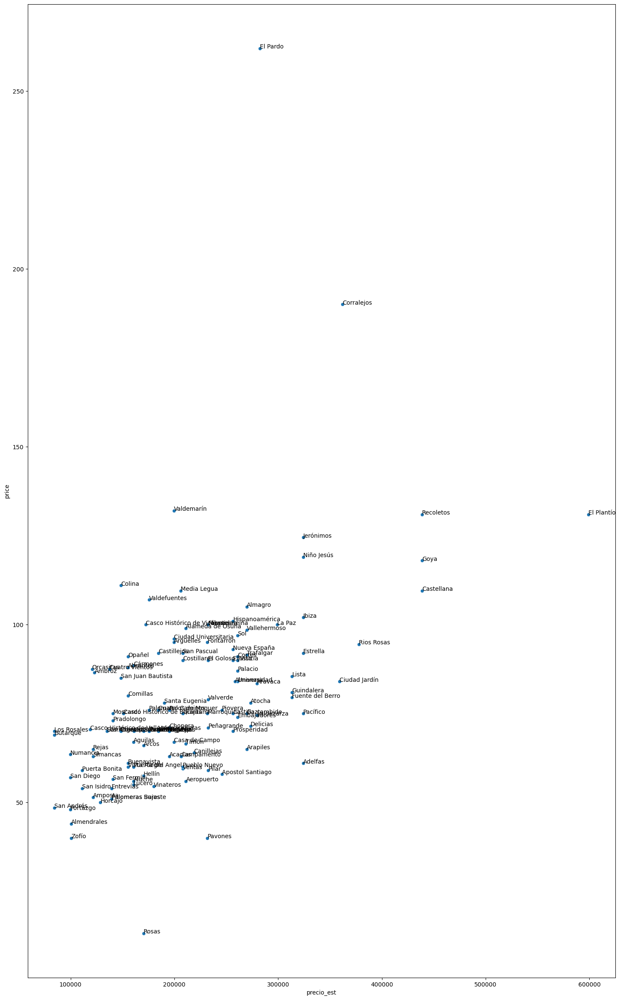

In [ ]:
plt.figure(figsize=(18,30))
sns.scatterplot(x='precio_est', y='price',data = temp)
for barrio in range(0,temp.shape[0]):
    plt.text(temp.precio_est.iloc[barrio],temp.price[barrio],temp.index[barrio])


In [ ]:
df_home.columns

Index(['id', 'host_id', 'host_is_superhost', 'name', 'host_name', 'amenities',
       'host_listings_count', 'neighbourhood_cleansed',
       'neighbourhood_group_cleansed', 'latitude', 'longitude',
       'property_type', 'room_type', 'accommodates', 'bedrooms', 'beds',
       'price', 'minimum_nights', 'maximum_nights', 'number_of_reviews',
       'review_scores_rating', 'calculated_host_listings_count', 'bathrooms',
       'distrito', 'precio_m2', 'price_disc', 'accommodates_disc',
       'propietarios_disc', 'price_accommodates', 'price_bedrooms', 'champion',
       'segmentacion_mercado', 'sup_m2_est', 'precio_est', 'price_x_sup'],
      dtype='object')

### Precio de alquiler vs precio discretizado

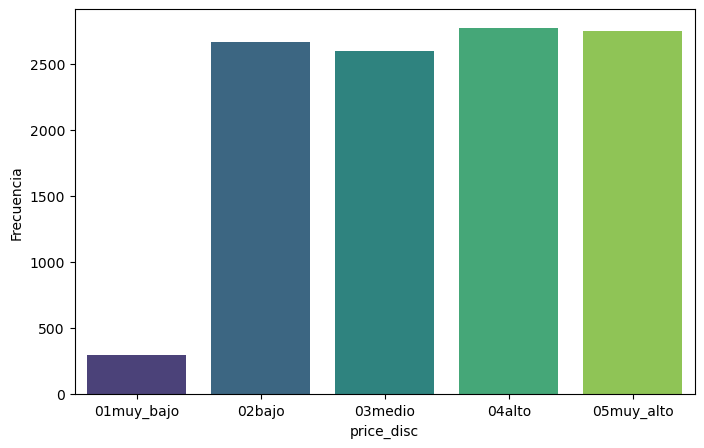

In [ ]:
temp = df_home['price_disc'].value_counts().sort_index()
plt.figure(figsize = (8,5))
sns.barplot(x = temp.index, y=temp, palette='viridis')
plt.ylabel('Frecuencia');

(2,)


c:\Users\Alfonso\miniconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


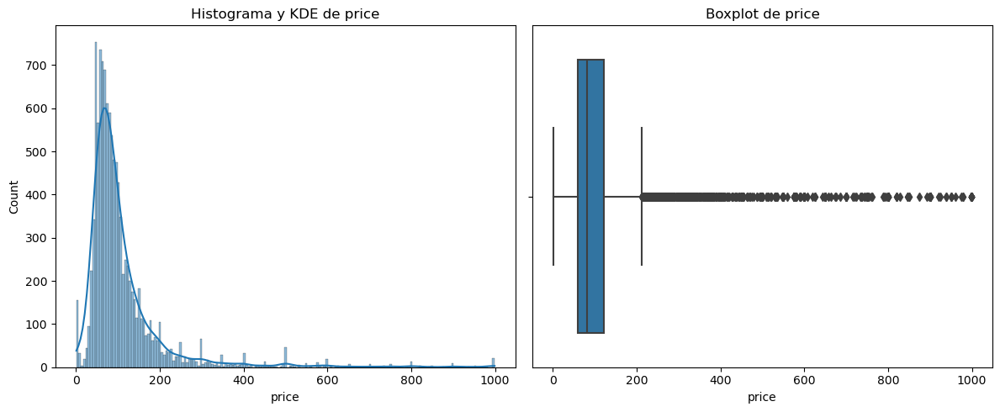

In [ ]:
plot_combined_graphs(df_home,['price'])

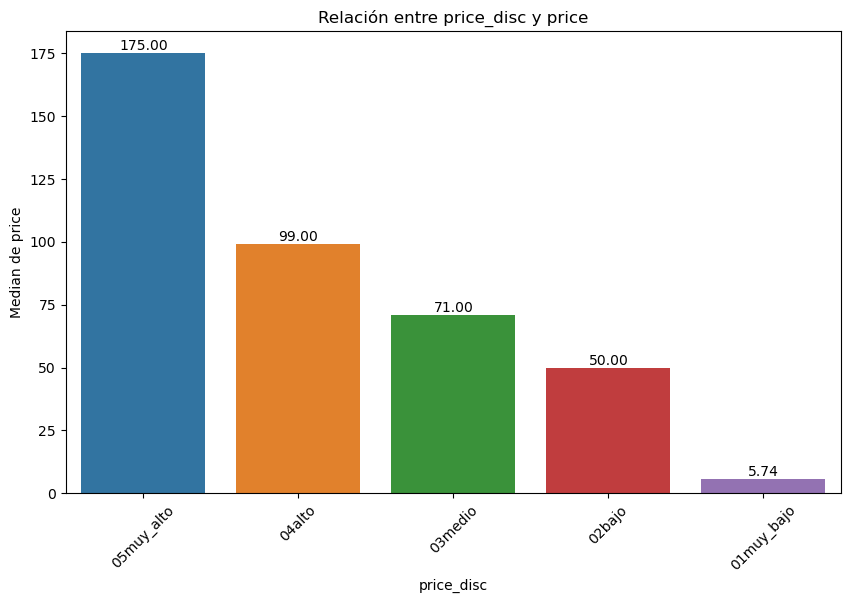

In [ ]:
plot_categorical_numerical_relationship(df_home,"price_disc",'price',measure="median",show_values=True)

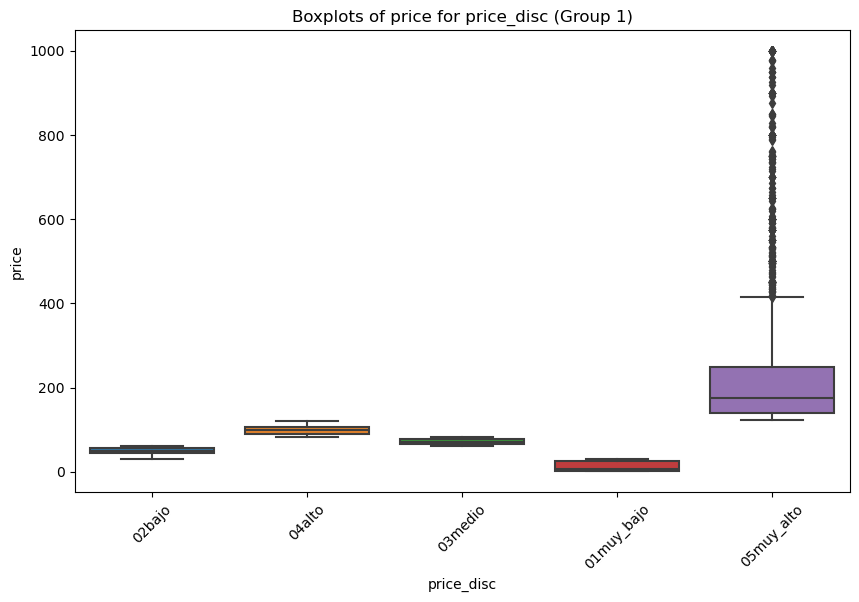

In [ ]:
plot_grouped_boxplots(df_home,'price_disc','price')

c:\Users\Alfonso\miniconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\Alfonso\miniconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\Alfonso\miniconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


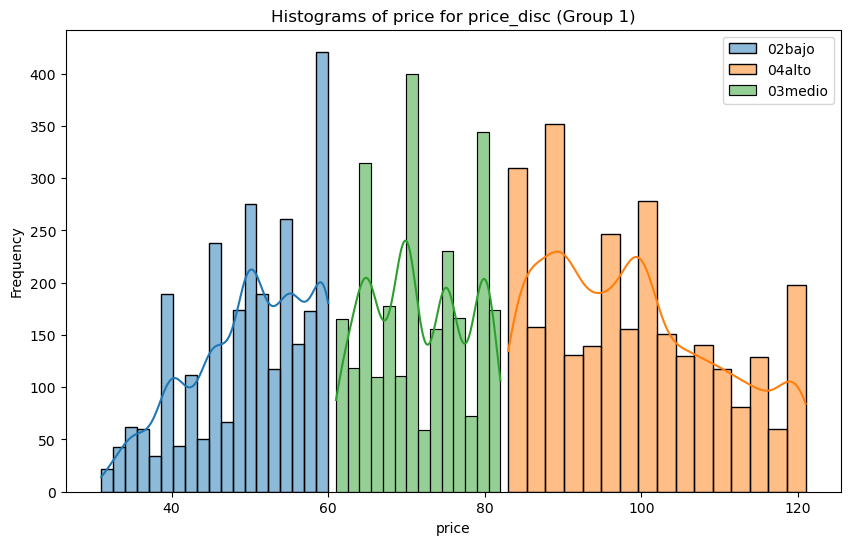

c:\Users\Alfonso\miniconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\Alfonso\miniconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


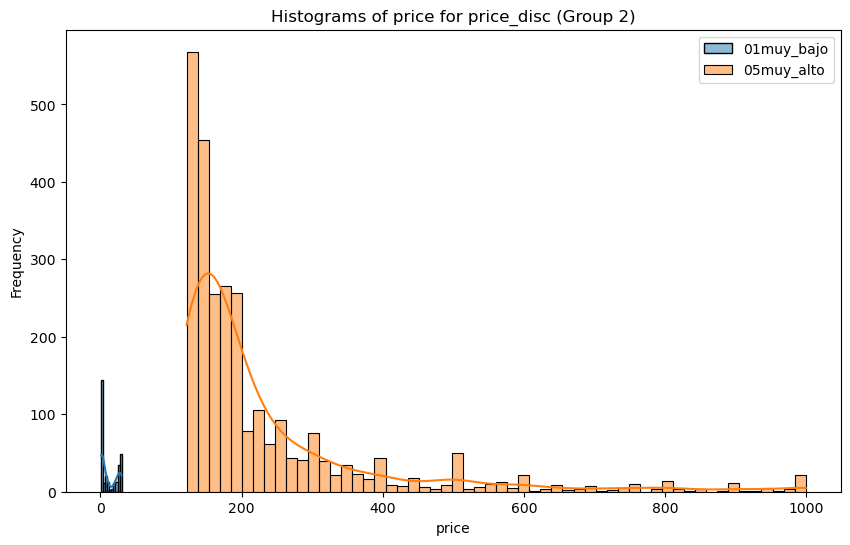

In [ ]:
plot_grouped_histograms(df_home,'price_disc','price',3)

### Precio alquiler vs colectivo de inquilinos (nº de personas maximo que pueden alojar)

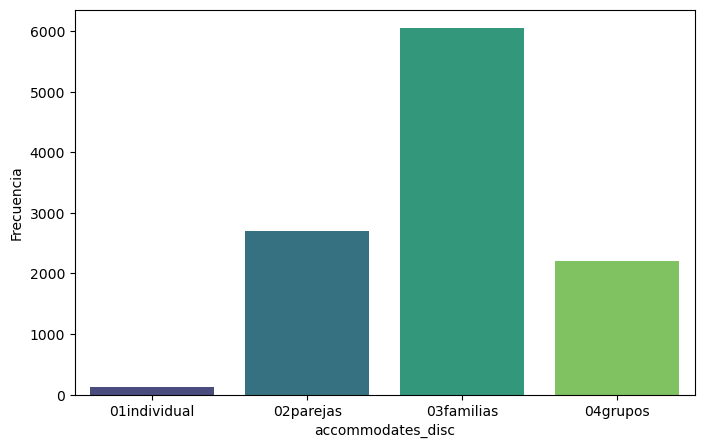

In [ ]:
temp = df_home['accommodates_disc'].value_counts().sort_index()
plt.figure(figsize = (8,5))
sns.barplot(x = temp.index, y=temp, palette='viridis')
plt.ylabel('Frecuencia');

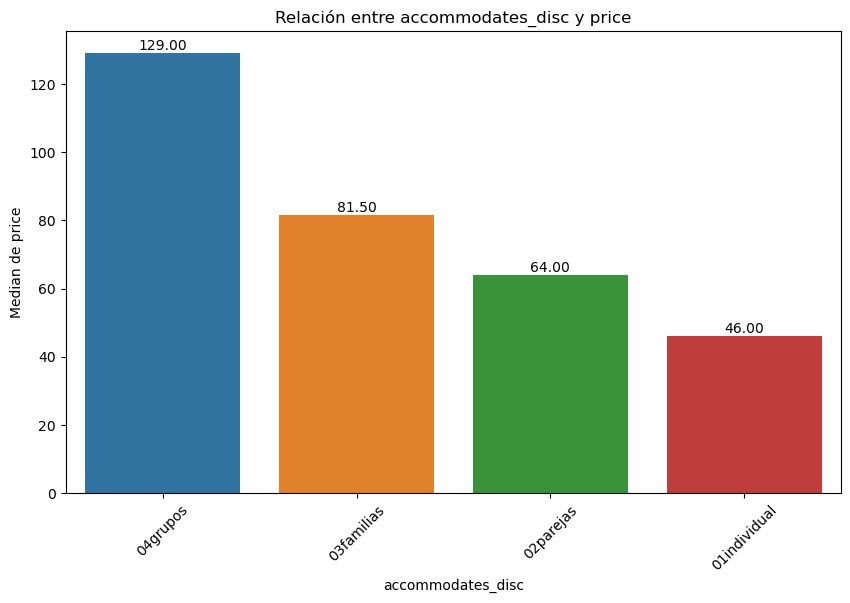

In [221]:
plot_categorical_numerical_relationship(df_home,'accommodates_disc','price', measure='median',show_values=True)

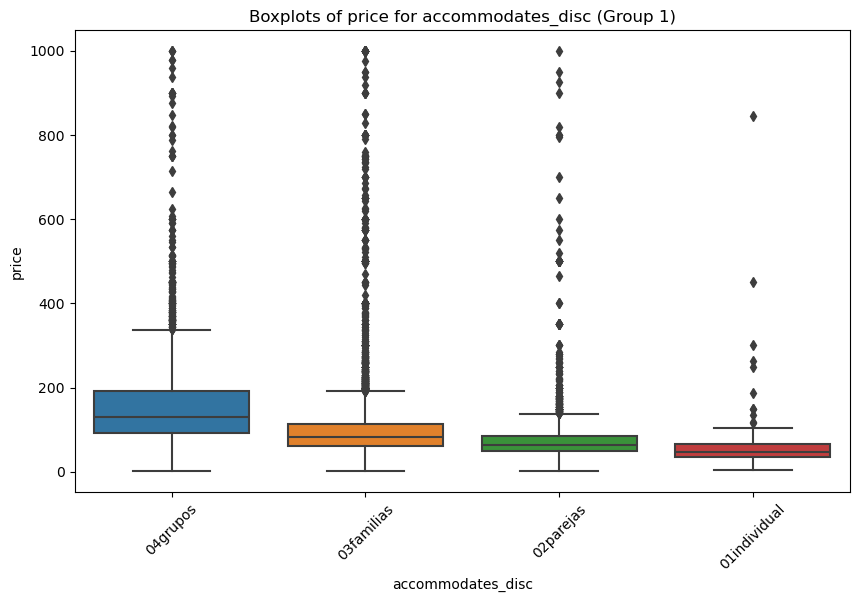

In [ ]:
plot_grouped_boxplots(df_home,'accommodates_disc','price')

### Precio de alquiler vs sup_m2 estimada

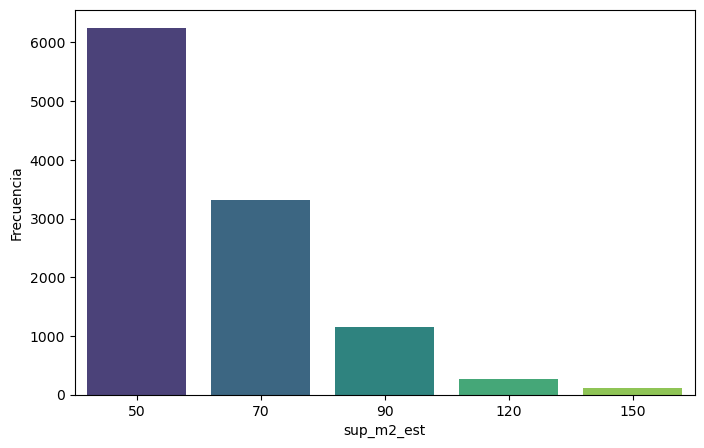

In [ ]:
temp = df_home['sup_m2_est'].value_counts()
plt.figure(figsize = (8,5))
sns.barplot(x = temp.index, y=temp, palette='viridis')
plt.ylabel('Frecuencia');

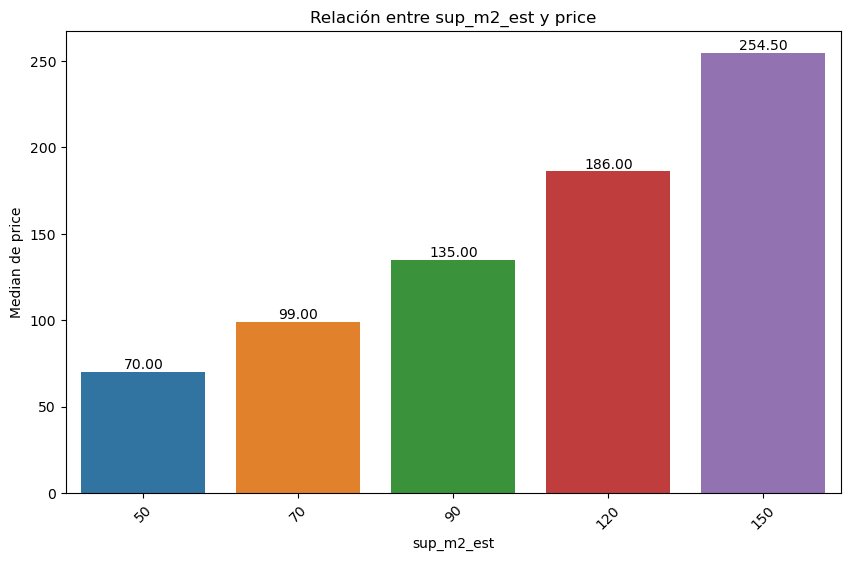

In [222]:
plot_categorical_numerical_relationship(df_home,'sup_m2_est','price', measure='median', show_values=True)

### Precio de alquiler vs camas

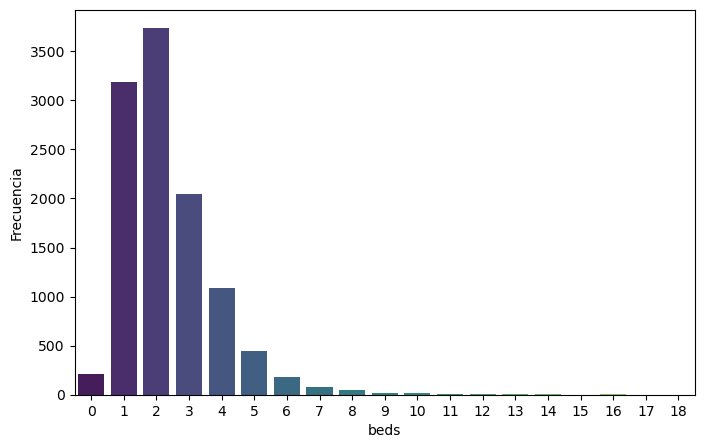

In [ ]:
temp = df_home['beds'].value_counts()
plt.figure(figsize = (8,5))
sns.barplot(x = temp.index, y=temp, palette='viridis')
plt.ylabel('Frecuencia');

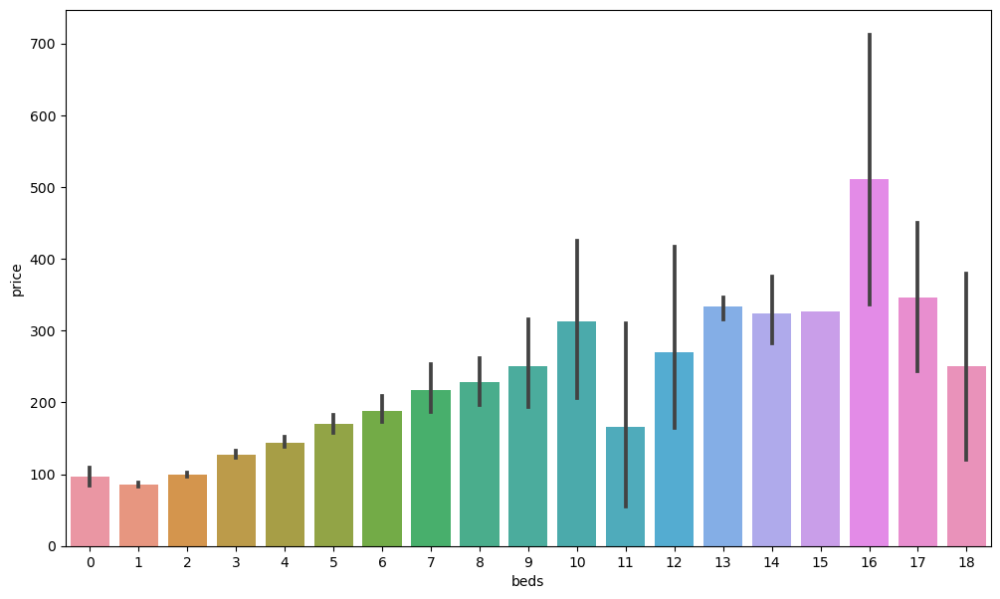

In [ ]:
plt.figure(figsize = (12,7))
sns.barplot(x = 'beds', y ='price', data = df_home);